In [1]:
import constants
cache_folder_name = 'ratio=logreg;loss=squared;method=pymanopt_UB'
seed = 44

In [2]:
import autograd.numpy as np
np.random.seed(seed)
import python_utils.python_utils.basic as basic
import python_utils.python_utils.caching as caching
log_folder = '%s/%s' % (constants.cache_folder, cache_folder_name)
caching.init(constants.cache_folder, constants.which_hash, basic.archiver(log_folder))
%load_ext autoreload
%autoreload 2
import matplotlib
matplotlib.use('Agg')

[Errno 17] File exists: '/Users/fultonw/Documents/projects/runs/domain_adapt_run/domain_adapt_run/notebooks/new/hyperparameter_loss_surface_stratified/CA_housing/cache/ratio=logreg;loss=squared;method=pymanopt_UB'


In [3]:
import matplotlib.pyplot as plt
from IPython.display import display_pretty, display_html
import python_utils.python_utils.basic as basic
import pandas as pd
import pdb
import itertools
import functools
import scipy.stats
import scipy
import cvxopt
import autograd
import autograd.numpy as np
import domain_adapt.domain_adapt.new.fxns as fxns
import domain_adapt.domain_adapt.new.utils as utils
import domain_adapt.domain_adapt.new.optimizers as optimizers
import domain_adapt.domain_adapt.new.constructors as constructors
#import domain_adapt.domain_adapt.SDR_data as data
import domain_adapt_run.domain_adapt_run.notebooks.new.hyperparameter_loss_surface_stratified.run as run
import data.domain_adapt_data.domain_adapt_data.fxns as data

Couldn't import dot_parser, loading of dot files will not be possible.


In [4]:
# define data
training_proportion = 0.9
training_sampler = functools.partial(data.kmm_paper_pca_subsample, 10., 5., 0.1)
get_data_f = data.CA_housing
num_data = 900

In [5]:
#
get_data = functools.partial(data.get_data_helper, training_proportion, training_sampler, get_data_f, num_data)

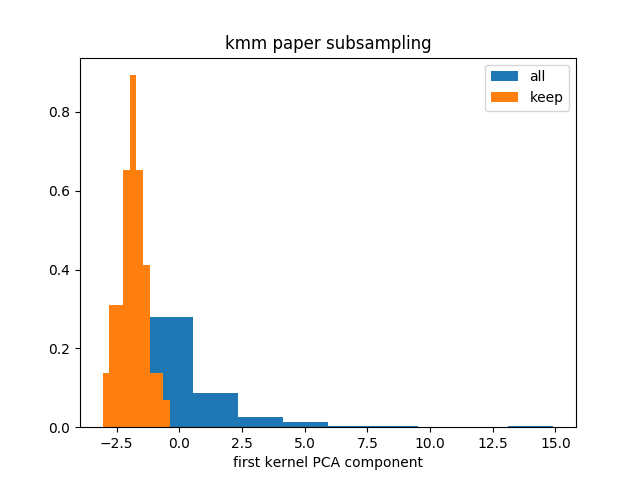

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


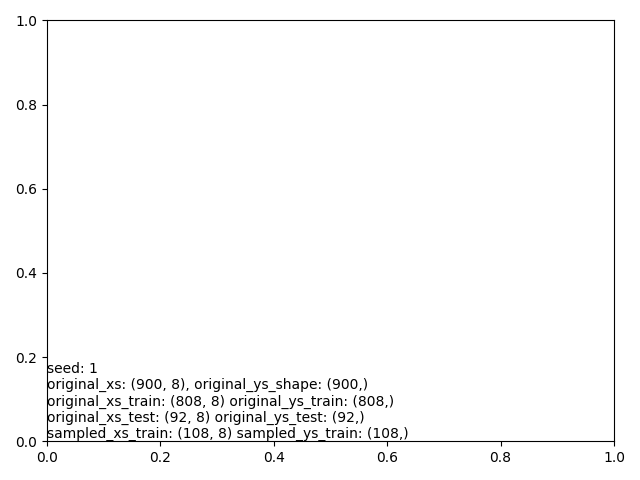

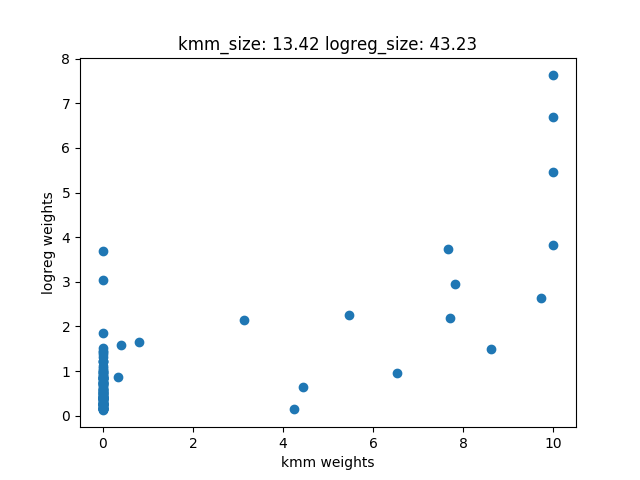

xs_train shape: (108, 8) xs_test_shape (108,)


In [6]:
# test get_data
xs_train, ys_train, xs_test, ys_test = get_data(1)
print 'xs_train shape:', xs_train.shape, 'xs_test_shape', xs_test.shape

In [7]:
# define fitter
pymanopt_options={'logverbosity':2, 'maxiter':100}
#u_dim = 1
unconstrained = False
#unconstrained = True
num_tries = 5
plot_b_info = constructors.plot_b_info
def get_fitter(c_lsqr_loss, c_lsqr_loss_eval, c_lsqr, c_logreg, weight_reg, UB_reg, sigma, max_ratio, u_dim):
    if unconstrained:
        B_init_f_getter = lambda xs_train, ys_train, xs_test: (lambda: np.random.normal(size=xs_train.shape[1]))
    else:
        B_init_f_getter = lambda xs_train, ys_train, xs_test: (lambda: np.random.normal(size=(xs_train.shape[1],u_dim)))
    return constructors.logreg_ratio_UB_fitter(c_lsqr, c_logreg, weight_reg, UB_reg, sigma, B_init_f_getter, unconstrained, c_lsqr_loss, c_lsqr_loss_eval, max_ratio=max_ratio, num_tries=num_tries, pymanopt_options=pymanopt_options, plot_b_info=plot_b_info)

In [8]:
# define hyperparameter search space via an iterator
UB_regs = [0.]#1,1.,10.]
u_dims = [1,]
c_lsqr_losses = [1.]
c_lsqr_loss_evals = [0.]
c_lsqrs = [.1,1.,10.,100]
c_logregs = [0.1,1.,10.]
weight_regs = [0.1,1.,10.]
sigmas = [0.25,1.,5.]#,5.]
max_ratios = [5.]
make_tuple = lambda key, vals: [(key,val) for val in vals]
care_hyperparam_tuples = itertools.product(
    make_tuple('UB_reg',UB_regs), 
    make_tuple('u_dim',u_dims), 
    )
nocare_hyperparam_tuples = itertools.product(
    make_tuple('c_lsqr_loss',c_lsqr_losses), 
    make_tuple('c_lsqr_loss_eval',c_lsqr_loss_evals), 
    make_tuple('c_lsqr',c_lsqrs), 
    make_tuple('c_logreg',c_logregs), 
    make_tuple('weight_reg',weight_regs), 
    make_tuple('UB_reg',UB_regs), 
    make_tuple('sigma',sigmas), 
    make_tuple('max_ratio',max_ratios)
    )

In [9]:
# define mapper
mapper = map

In [10]:
#
num_iterations = 3

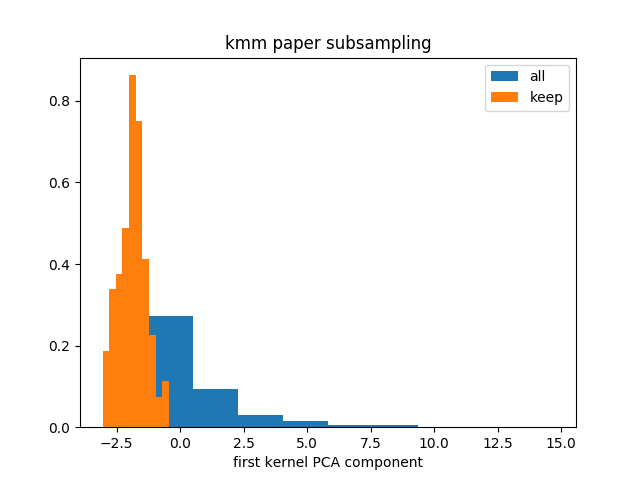

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


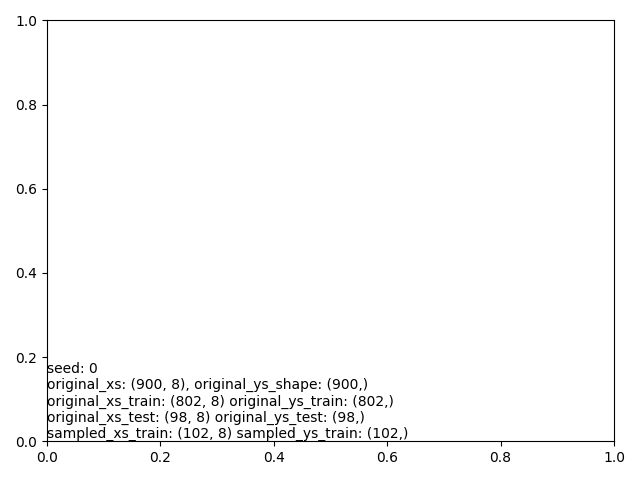

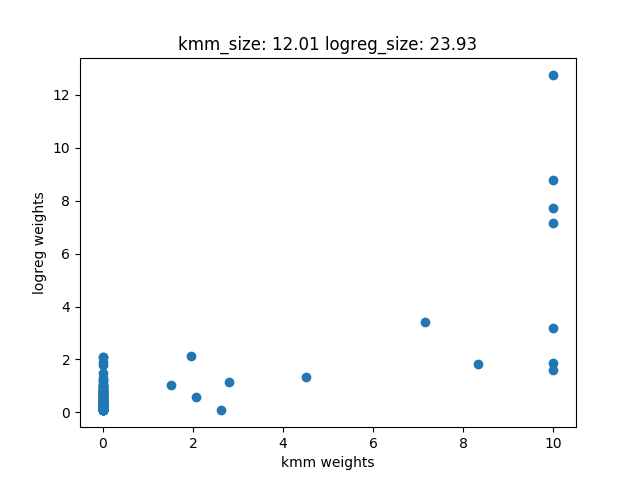

 iter		   cost val	    grad. norm
    1	+4.2779307913552476e+12	7.20702634e+12
    2	+4.2040493499116016e+12	1.11846558e+13
    3	+3.9019993229584912e+12	1.30915514e+13
    4	+3.3891464612515342e+12	6.71618958e+12
    5	+3.3124427910049302e+12	7.02025959e+12
    6	+3.1950559557432065e+12	3.93068269e+12
    7	+3.1837327512210220e+12	3.71434841e+12
    8	+3.1541996874998052e+12	1.39894457e+12
    9	+3.1419938013238101e+12	2.47160886e+12
   10	+3.1331838987265098e+12	2.50354826e+12
   11	+3.1173276111480063e+12	1.41500175e+12
   12	+3.1099474268472300e+12	2.75625799e+12
   13	+3.0918298270963638e+12	1.11216838e+12
   14	+3.0313960502709536e+12	2.60301562e+12
   15	+3.0261388036380073e+12	2.89529869e+12
   16	+3.0099622440285947e+12	1.64430377e+12
   17	+3.0027659784361948e+12	2.64348018e+12
   18	+2.9868614763140913e+12	1.12333739e+12
   19	+2.9301529771433369e+12	2.01935453e+12
   20	+2.9191642031078135e+12	1.56930345e+12
   21	+2.9084643150542373e+12	1.63214393e+12
   22	+2.908378956244

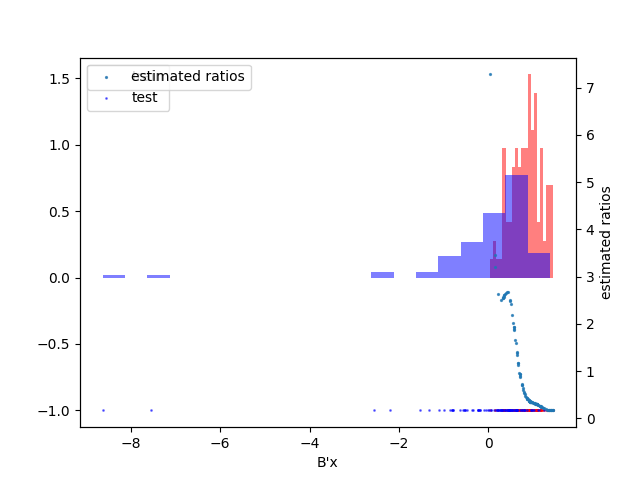

('train_loss: 917453727046.74',)
('test_loss: 14041038253287.86',)


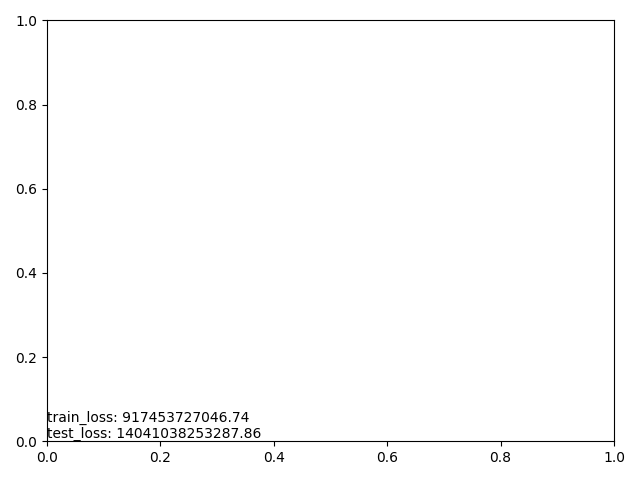

b_norm: 1.0


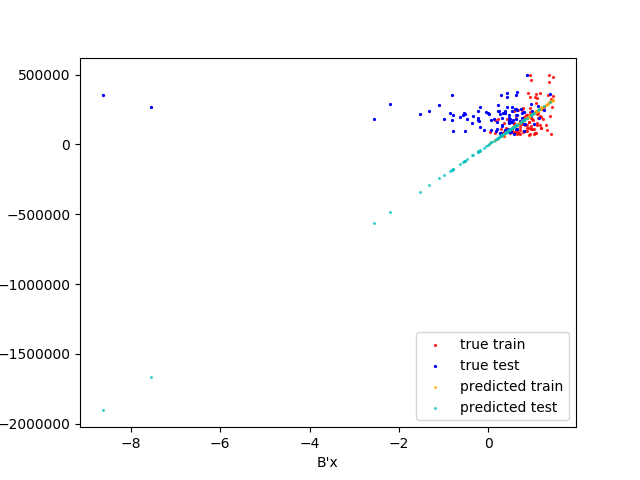

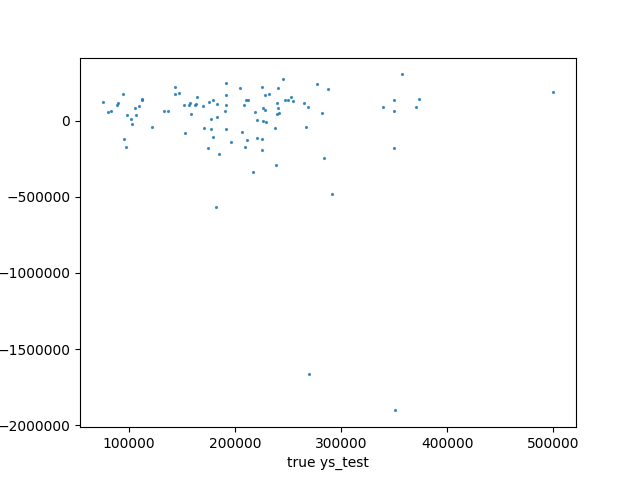

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 14041038253287.86',)


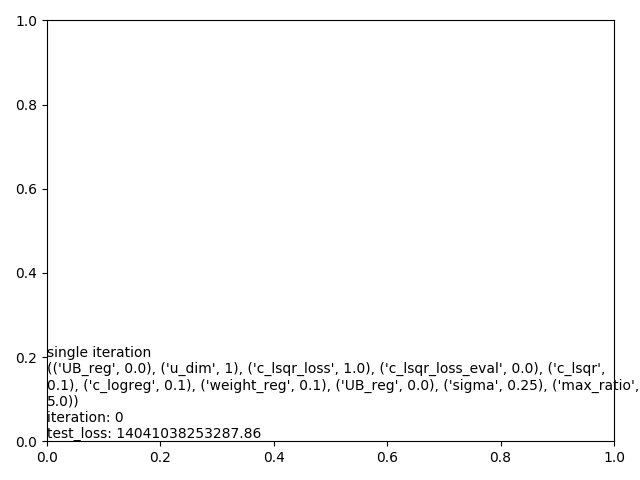

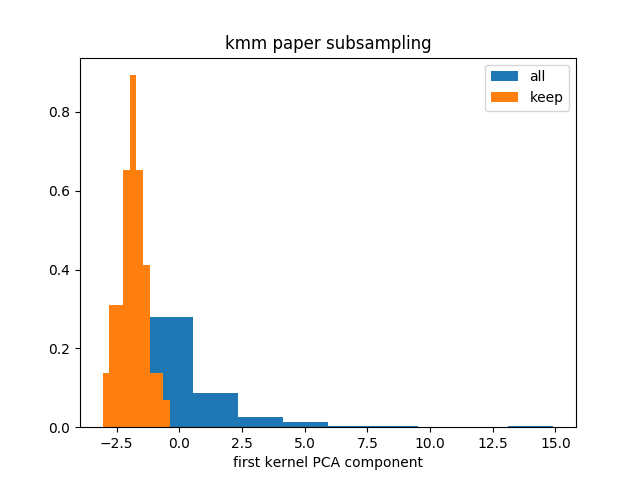

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


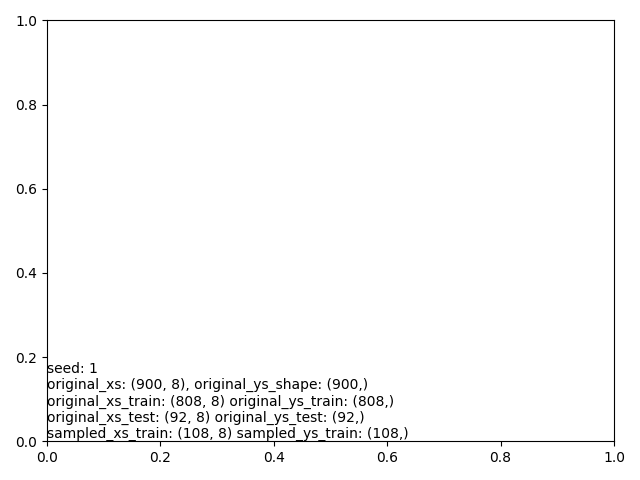

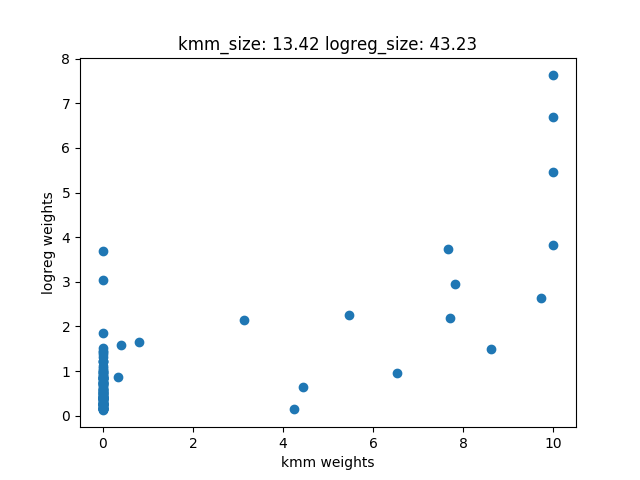

 iter		   cost val	    grad. norm
    1	+6.4145562543137617e+12	8.98179407e+12
    2	+2.8141438876599258e+12	1.30746962e+13
    3	+1.5430145153365149e+12	1.72581690e+12
    4	+1.4269042359571755e+12	1.96393271e+12
    5	+1.4149889061820073e+12	1.48317697e+12
    6	+1.4070011920089370e+12	2.04784356e+12
    7	+1.3979108725957122e+12	1.85068299e+12
    8	+1.3926603996430369e+12	2.40265060e+12
    9	+1.3770121536310613e+12	1.17708768e+12
   10	+1.3675446160163291e+12	2.55382167e+12
   11	+1.3532716985186509e+12	1.41040303e+12
   12	+1.3487876961468489e+12	1.40476443e+12
   13	+1.3479088297772795e+12	1.77116728e+12
   14	+1.3446674490213516e+12	1.47904937e+12
   15	+1.3398891141337637e+12	1.07059176e+12
   16	+1.3381339749635752e+12	1.33627799e+12
   17	+1.3340368185090381e+12	5.99228229e+11
   18	+1.3228074141628838e+12	1.39532201e+12
   19	+1.3193786310057334e+12	1.01818456e+12
   20	+1.3176607738205645e+12	1.00931846e+12
   21	+1.3159895652337256e+12	1.03054180e+12
   22	+1.314231049300

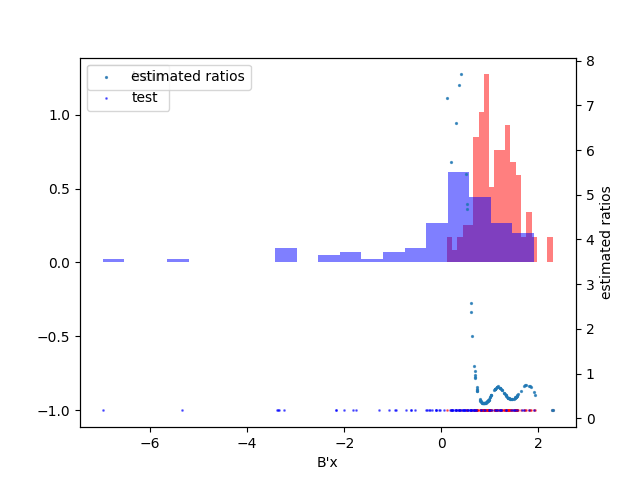

('train_loss: 1136802640046.87',)
('test_loss: 10451782780563.72',)


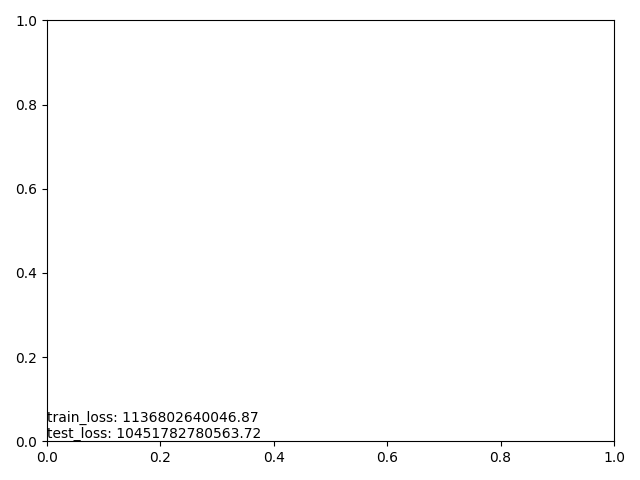

b_norm: 1.0


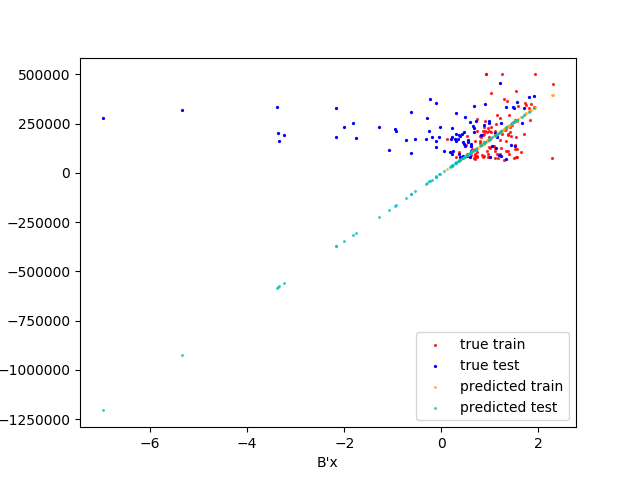

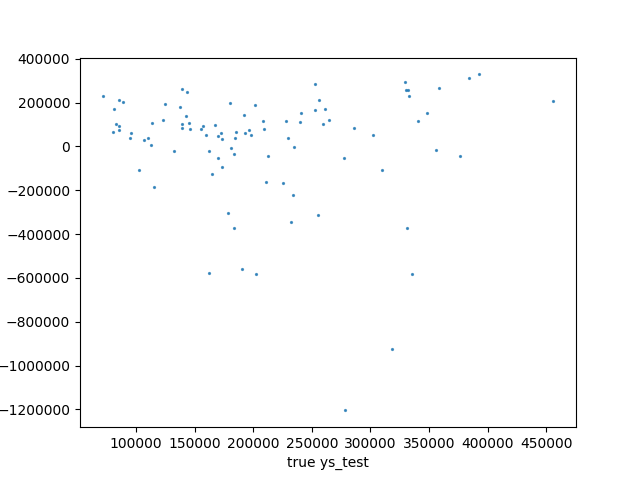

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 10451782780563.72',)


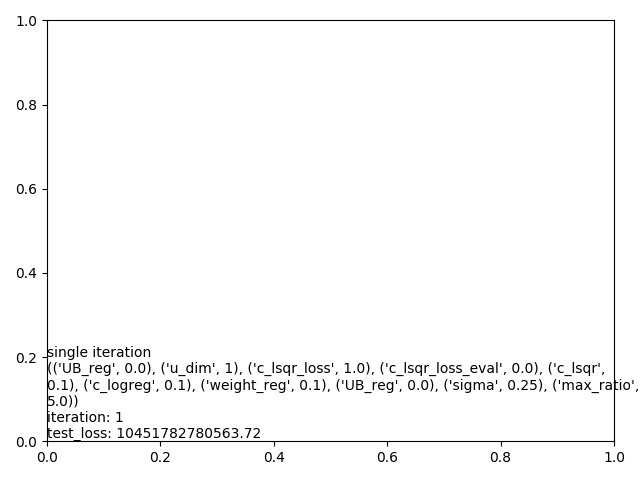

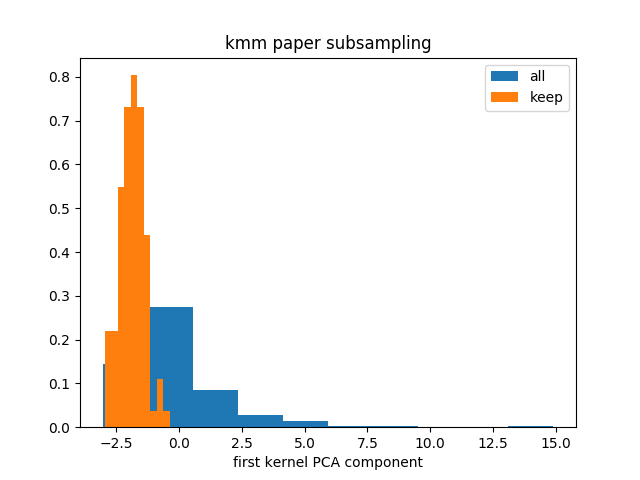

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


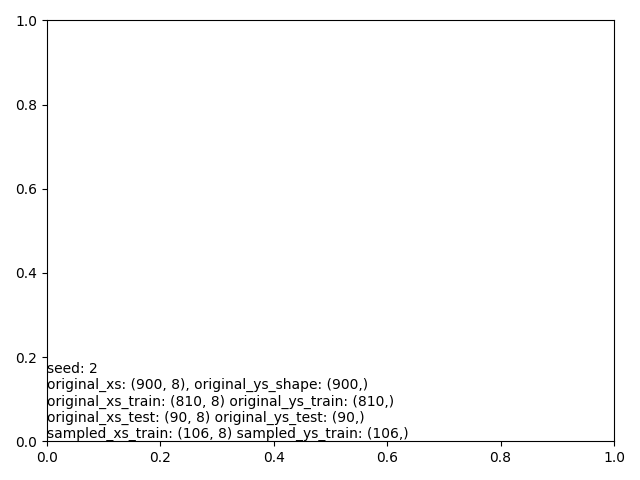

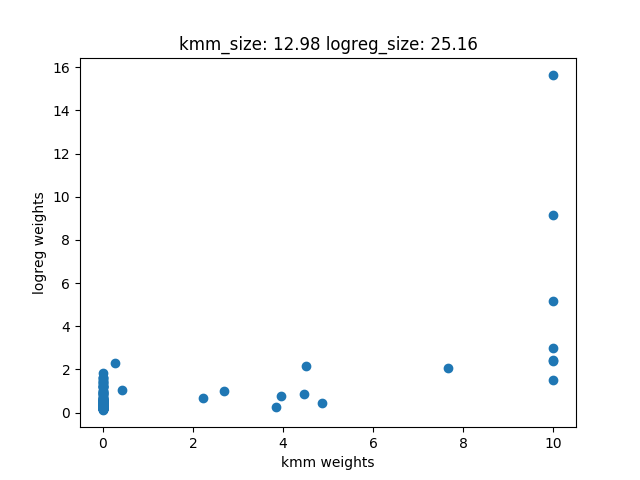

 iter		   cost val	    grad. norm
    1	+5.3823164778568105e+12	7.06826706e+12
    2	+3.1405564226010728e+12	4.51580008e+12
    3	+1.1779141044623220e+12	3.87723909e+12
    4	+7.4717737417303418e+11	1.78564859e+12
    5	+6.7947864223447168e+11	1.31574668e+12
    6	+6.0491742024466492e+11	6.61432061e+11
    7	+5.8732602987612354e+11	4.05871684e+11
    8	+5.8233846899675061e+11	4.74271884e+11
    9	+5.7583304394232153e+11	4.94520907e+11
   10	+5.7516859881315015e+11	6.60622703e+11
   11	+5.7259447248809192e+11	6.16742215e+11
   12	+5.6465016934160889e+11	3.29530906e+11
   13	+5.6145637404995679e+11	3.26158528e+11
   14	+5.5908966666387598e+11	2.76483208e+11
   15	+5.5728176621265576e+11	2.51851174e+11
   16	+5.5580289130416687e+11	2.11227022e+11
   17	+5.5467018409345544e+11	2.15956381e+11
   18	+5.5359429915019873e+11	1.52704156e+11
   19	+5.5279901478570642e+11	2.18504477e+11
   20	+5.5226464638251440e+11	2.37452395e+11
   21	+5.5118223827410596e+11	1.05209711e+11
   22	+5.503309363711

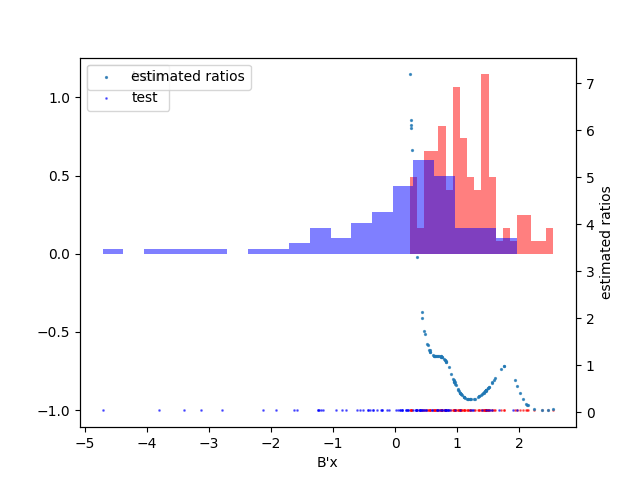

('train_loss: 858467325487.49',)
('test_loss: 8402651080791.63',)


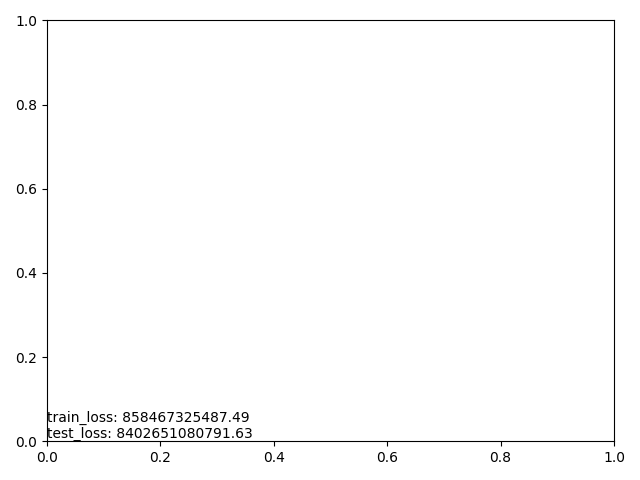

b_norm: 1.0


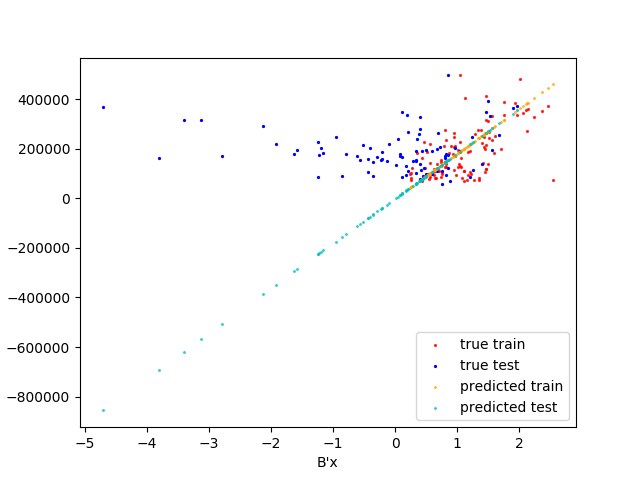

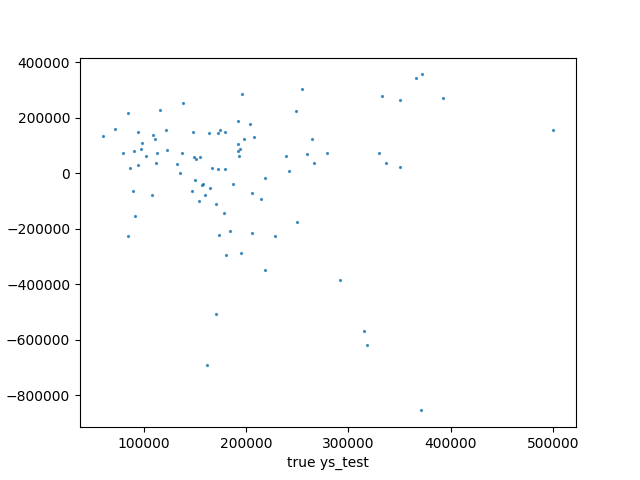

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8402651080791.63',)


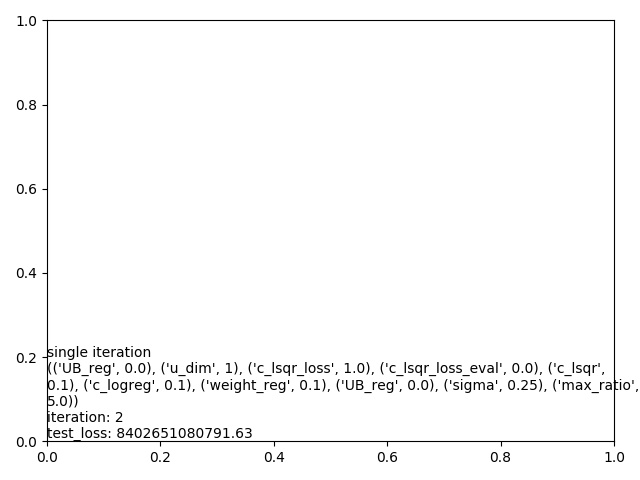

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('mean loss: 10965157371547.74',)
('std loss: 2330310076612.62',)
('test losses: [14041038253287.857, 10451782780563.719, 8402651080791.6289]',)


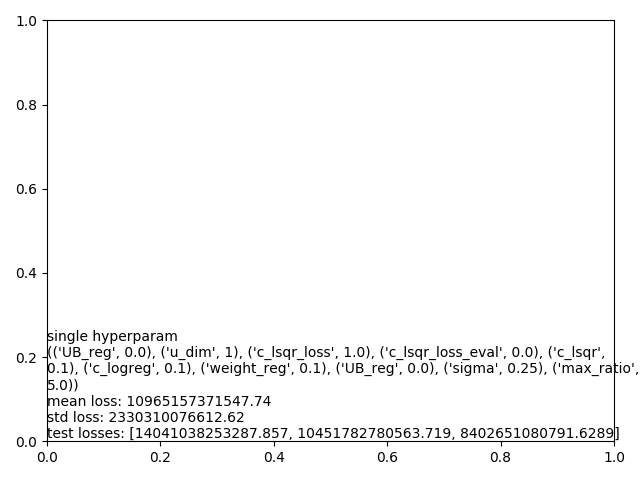

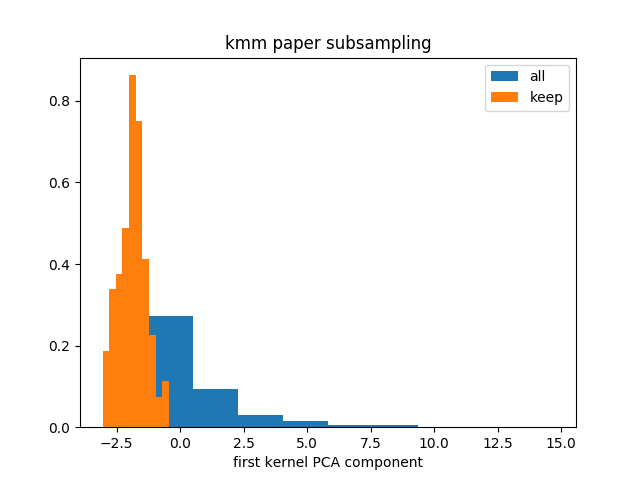

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


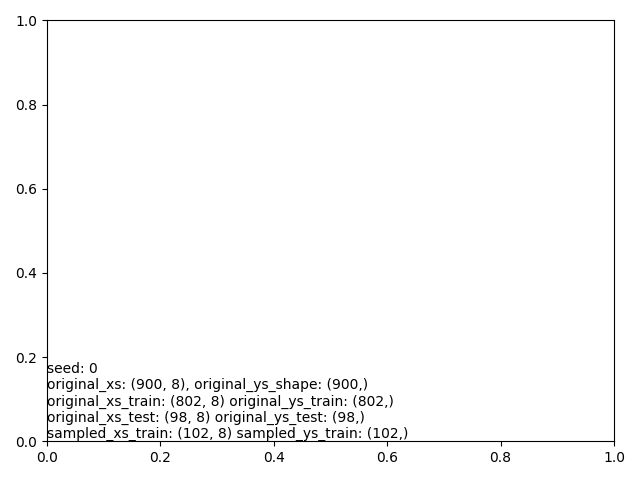

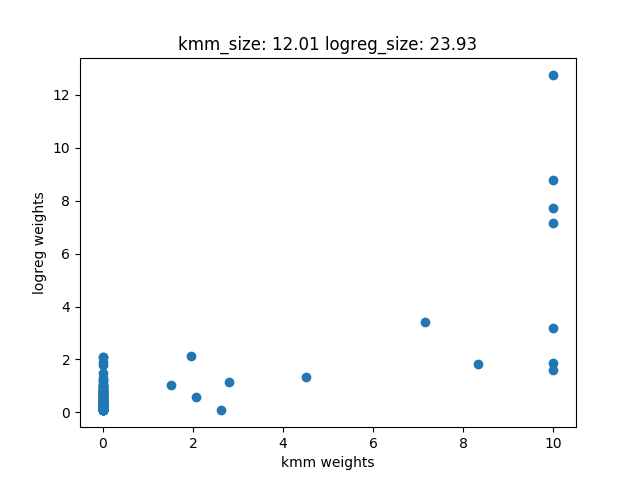

 iter		   cost val	    grad. norm
    1	+5.9251986691816934e+12	1.60327742e+13
    2	+1.3102768015429331e+12	2.91785497e+12
    3	+1.0612338214890421e+12	1.91089503e+12
    4	+9.3108810869416211e+11	1.01312266e+12
    5	+7.8537449197133472e+11	2.89438850e+11
    6	+7.7649991041032642e+11	3.34156401e+11
    7	+7.6859434614319592e+11	1.94653488e+11
    8	+7.6756231658527332e+11	4.13251532e+11
    9	+7.6388967316357324e+11	3.23784497e+11
   10	+7.5772044231562292e+11	1.71127464e+11
   11	+7.5623803607468713e+11	3.77616719e+11
   12	+7.5140954217974585e+11	2.43336066e+11
   13	+7.4736589737919373e+11	1.84173651e+11
   14	+7.4408252565422058e+11	2.26422234e+11
   15	+7.4241654664272534e+11	3.33151512e+11
   16	+7.3750704186263232e+11	1.76002318e+11
   17	+7.3463087534942627e+11	3.07364288e+11
   18	+7.2927228564156604e+11	1.67297297e+11
   19	+7.2602631736398706e+11	3.54671476e+11
   20	+7.1965204385115881e+11	1.61561714e+11
   21	+7.1520242314338489e+11	4.23376543e+11
   22	+7.076926877812

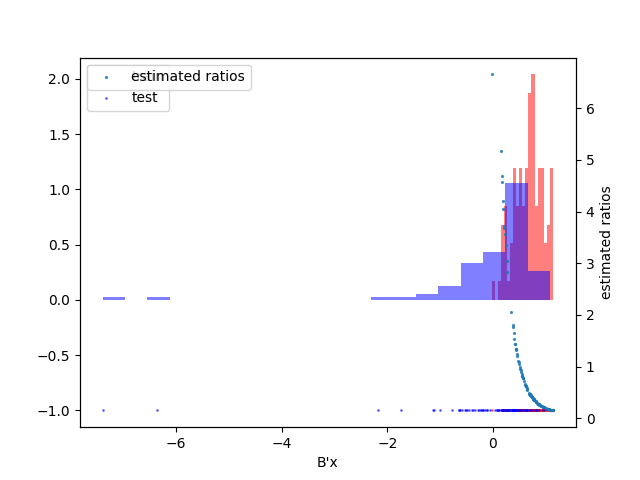

('train_loss: 980846768216.12',)
('test_loss: 15525411689021.27',)


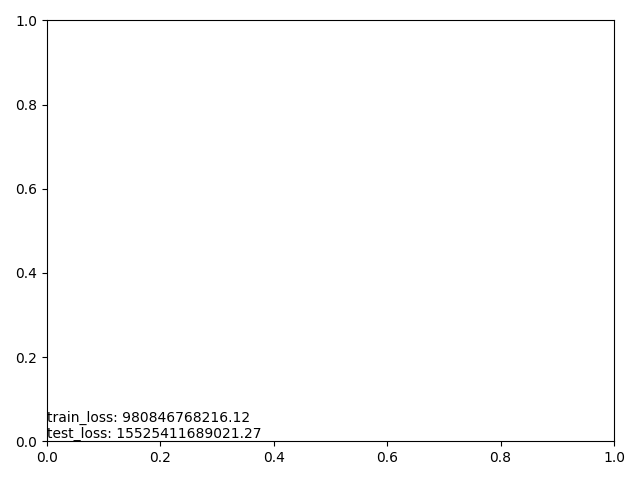

b_norm: 1.0


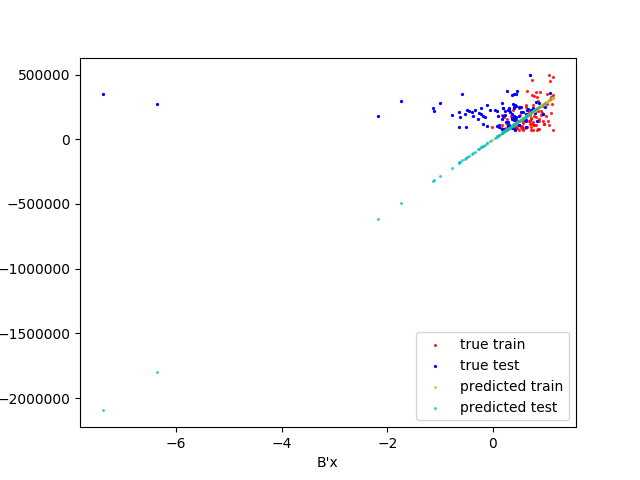

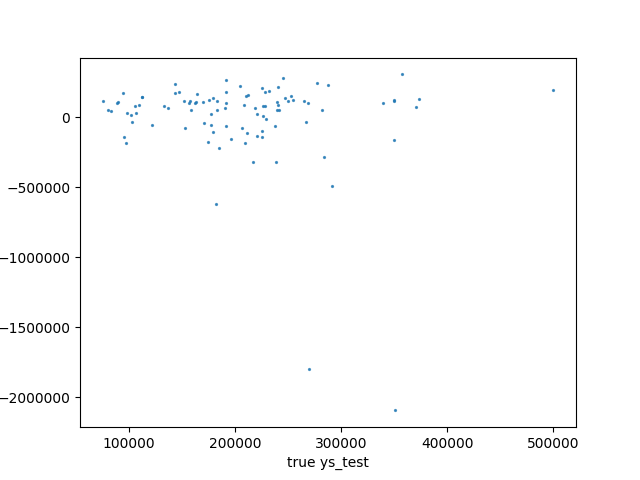

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 15525411689021.27',)


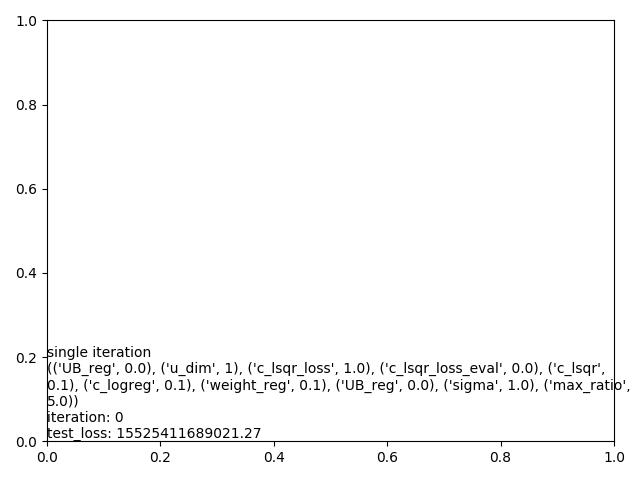

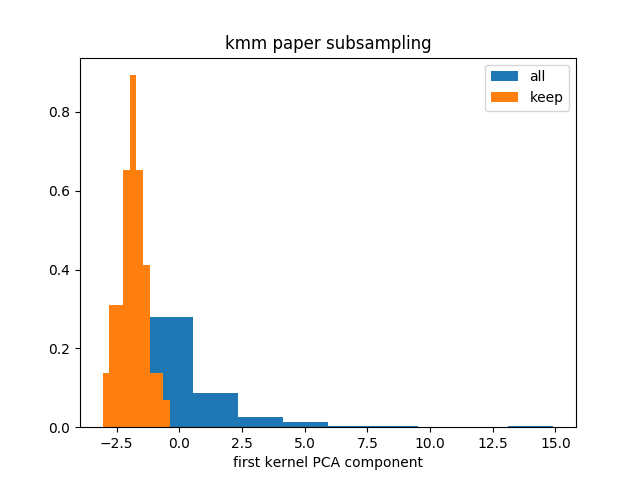

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


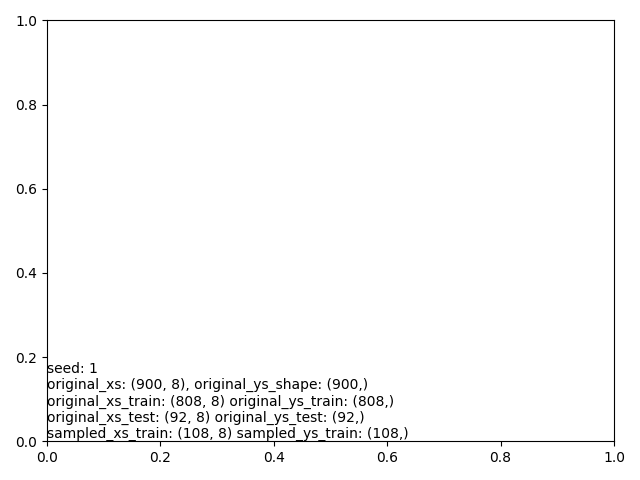

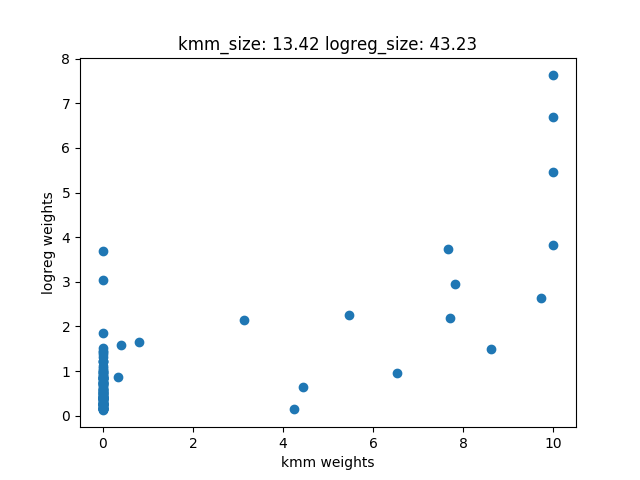

 iter		   cost val	    grad. norm
    1	+6.4422602243769551e+12	8.58657152e+12
    2	+2.4724790914415059e+12	5.79173210e+12
    3	+1.9567975281177874e+12	4.95614411e+12
    4	+1.0924292779989756e+12	1.33979357e+12
    5	+9.4654666044363049e+11	5.90256081e+11
    6	+9.3171199111829541e+11	6.20500700e+11
    7	+9.2814627653471655e+11	4.87222408e+11
    8	+9.1673611746611951e+11	3.12505540e+11
    9	+9.1228773215583191e+11	3.23401345e+11
   10	+9.1145472597155029e+11	3.52606077e+11
   11	+9.0862012225619080e+11	2.50784504e+11
   12	+9.0826545119411975e+11	2.55242244e+11
   13	+9.0697251174420251e+11	2.11618661e+11
   14	+9.0686356377232019e+11	2.09462891e+11
   15	+9.0682695973207703e+11	2.15201145e+11
   16	+9.0668235322121082e+11	2.10426423e+11
   17	+9.0660245640103577e+11	2.08554808e+11
   18	+9.0652282356606653e+11	2.11386216e+11
   19	+9.0641102737770740e+11	2.07789093e+11
   20	+9.0639152371592908e+11	2.15694054e+11
   21	+9.0631333076611511e+11	2.13125447e+11
   22	+9.061227289995

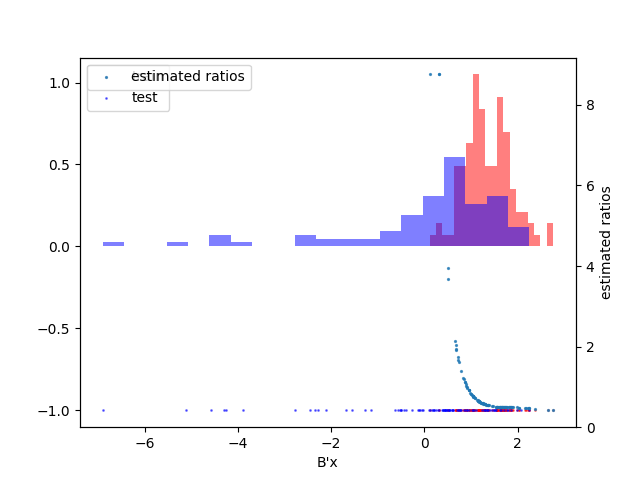

('train_loss: 1080875596744.82',)
('test_loss: 9744921050895.92',)


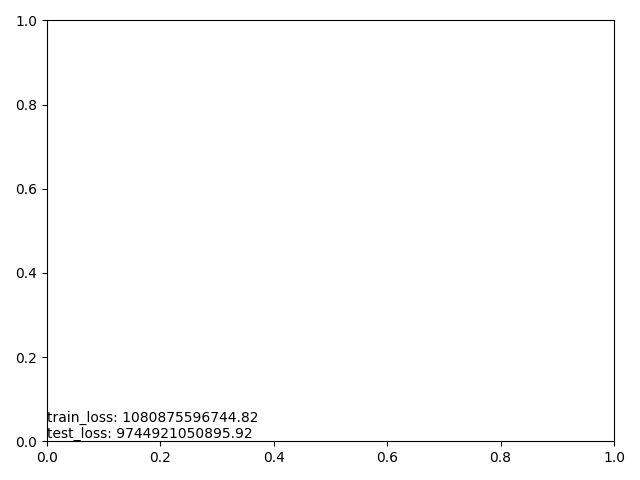

b_norm: 1.0


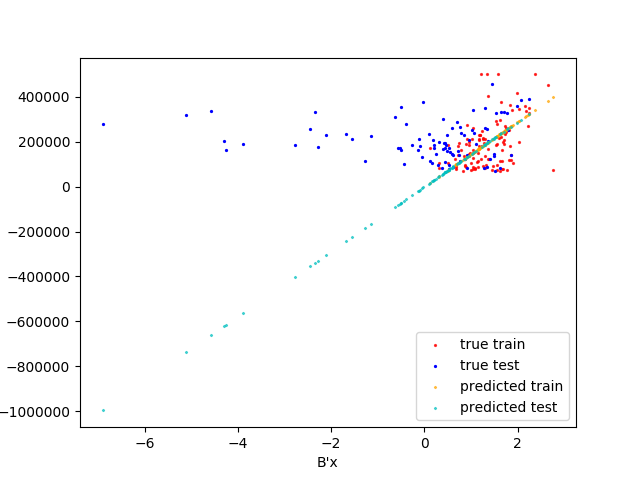

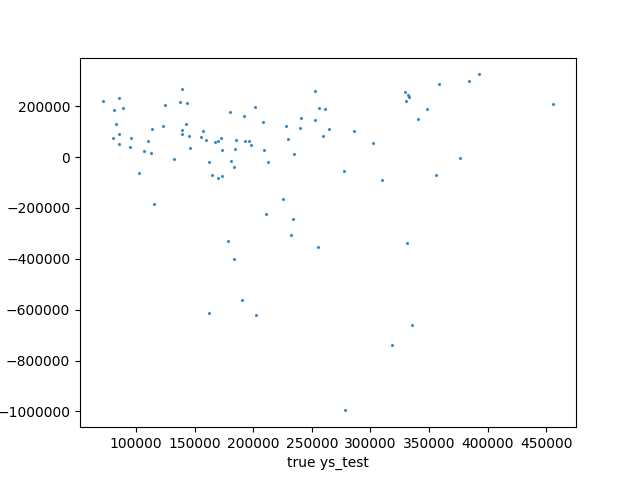

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9744921050895.93',)


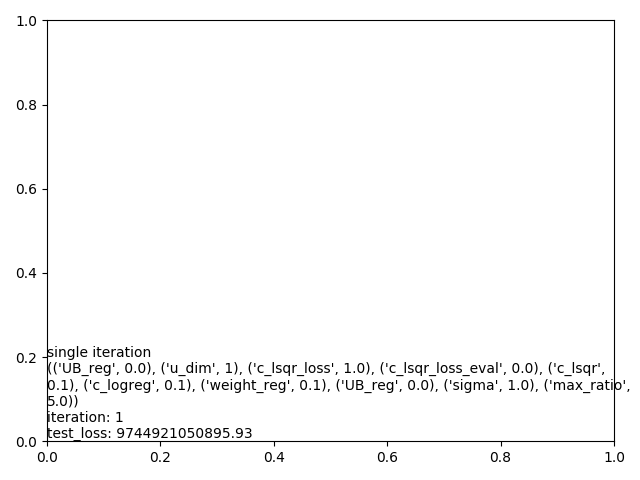

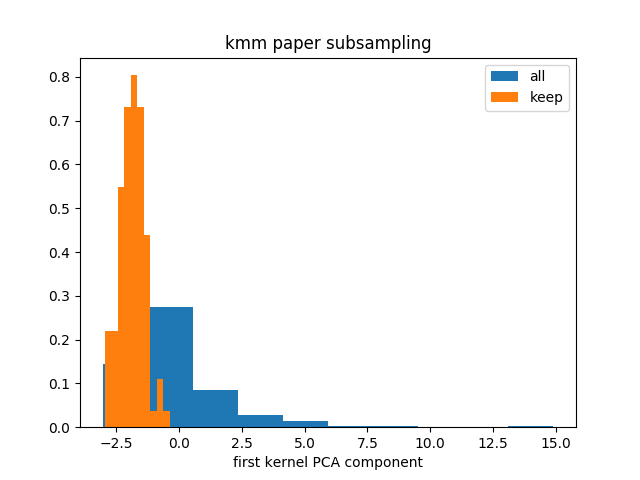

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


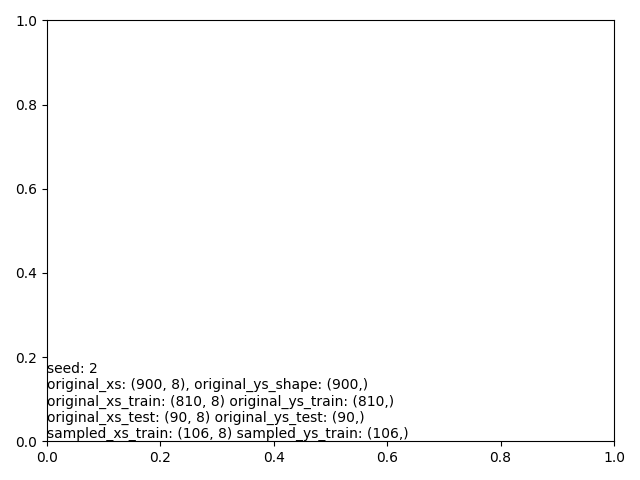

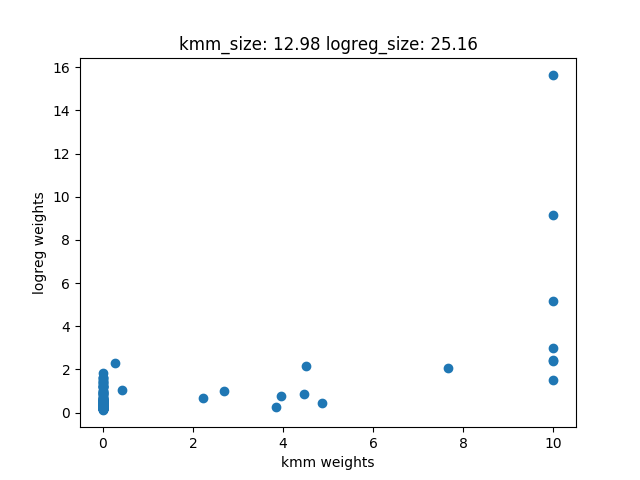

 iter		   cost val	    grad. norm
    1	+5.6578150905324551e+12	1.33426521e+12
    2	+5.6241701910861191e+12	5.60197013e+12
    3	+5.4858658244532305e+12	5.92126446e+12
    4	+4.9336840351921348e+12	6.89864987e+12
    5	+2.8095034695273472e+12	8.99698221e+12
    6	+9.6269142939467236e+11	2.14990981e+12
    7	+8.3372287354208252e+11	3.22795732e+12
    8	+6.3780431570627515e+11	3.19699890e+11
    9	+6.3453798374195178e+11	4.02920992e+11
   10	+6.2787334663104810e+11	1.72630404e+11
   11	+6.2552987290236597e+11	2.41670189e+11
   12	+6.2452726727531165e+11	2.94832426e+11
   13	+6.2162301555688721e+11	1.46226134e+11
   14	+6.2104654659258118e+11	3.17845806e+11
   15	+6.1911035230817578e+11	2.19282883e+11
   16	+6.1857152397903101e+11	2.79255526e+11
   17	+6.1677519112416602e+11	1.89251354e+11
   18	+6.1504787414864282e+11	1.24132928e+11
   19	+6.1365622264323438e+11	1.94194916e+11
   20	+6.1262984456653235e+11	2.22549847e+11
   21	+6.1065354291329407e+11	1.06836543e+11
   22	+6.091101912409

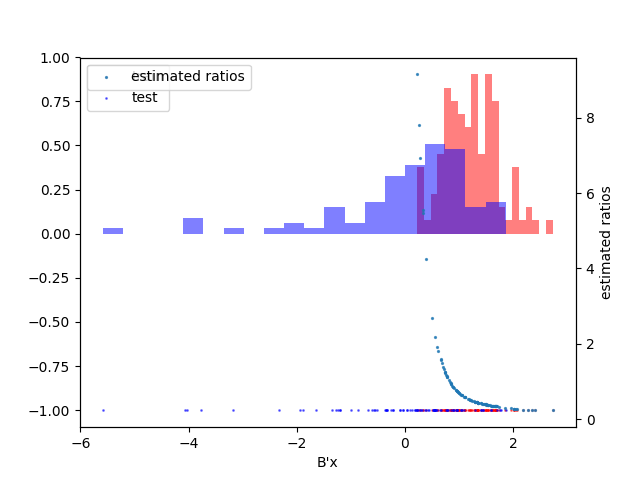

('train_loss: 853909916727.35',)
('test_loss: 8431773301686.74',)


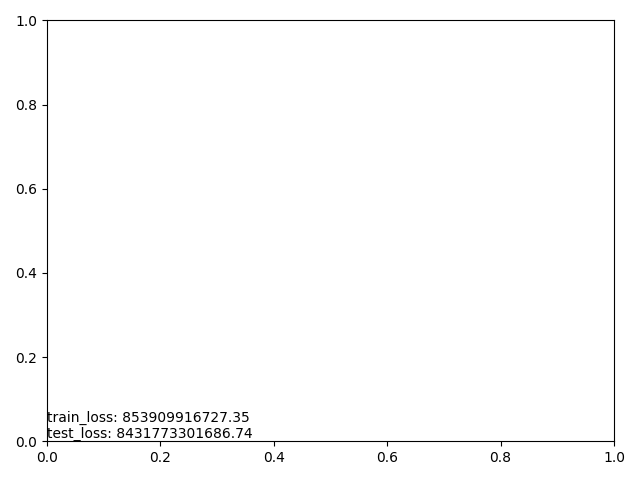

b_norm: 1.0


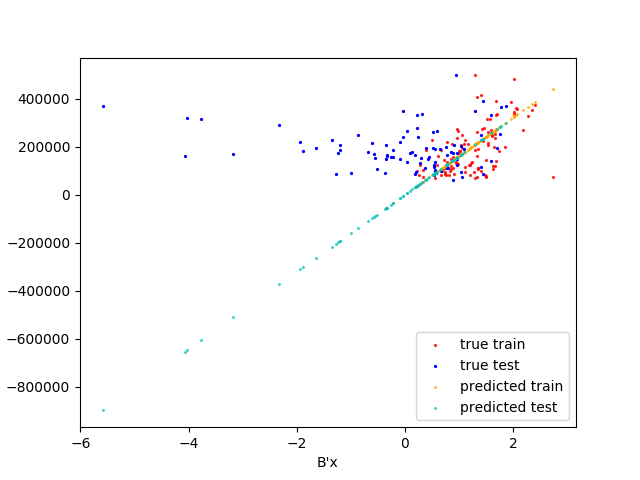

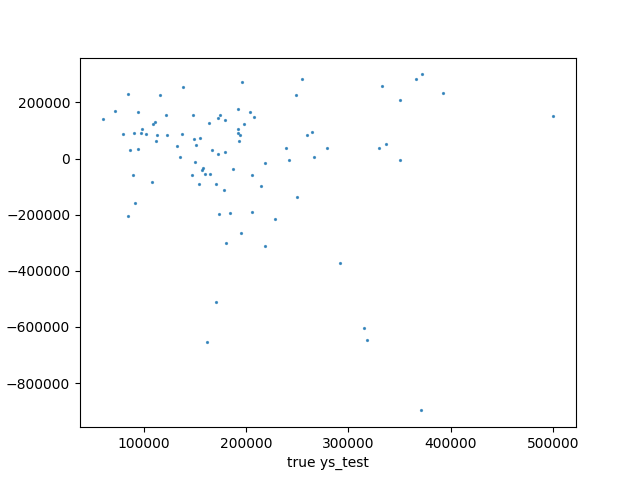

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8431773301686.74',)


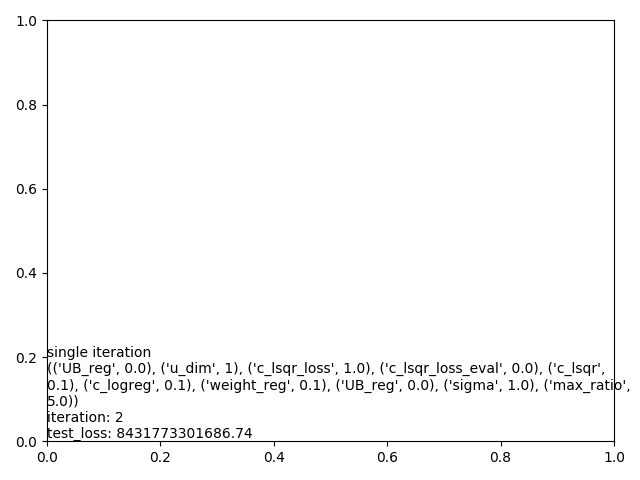

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('mean loss: 11234035347201.31',)
('std loss: 3081452301882.16',)
('test losses: [15525411689021.271, 9744921050895.9258, 8431773301686.7383]',)


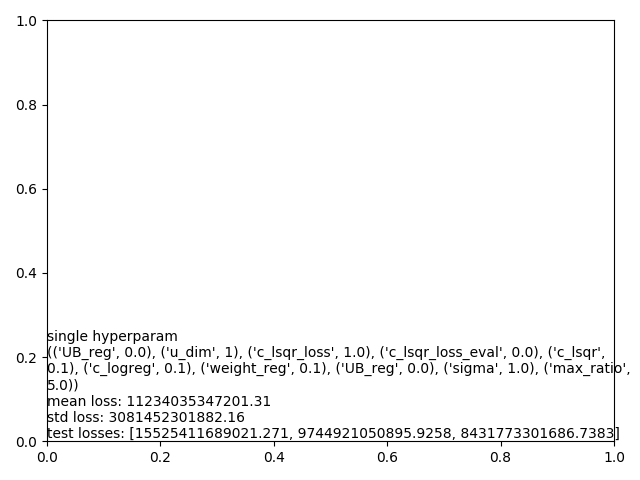

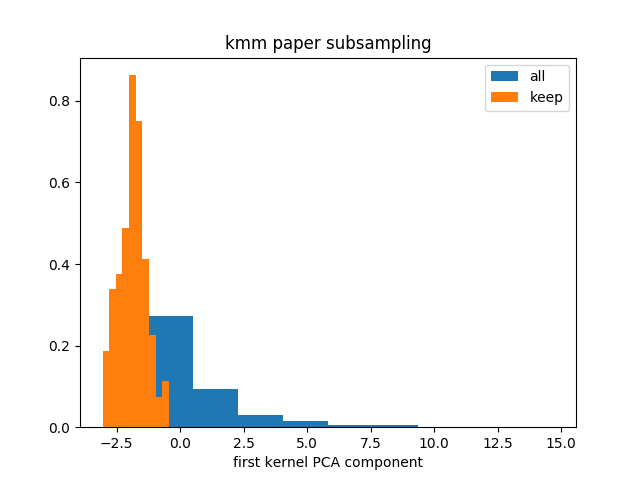

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


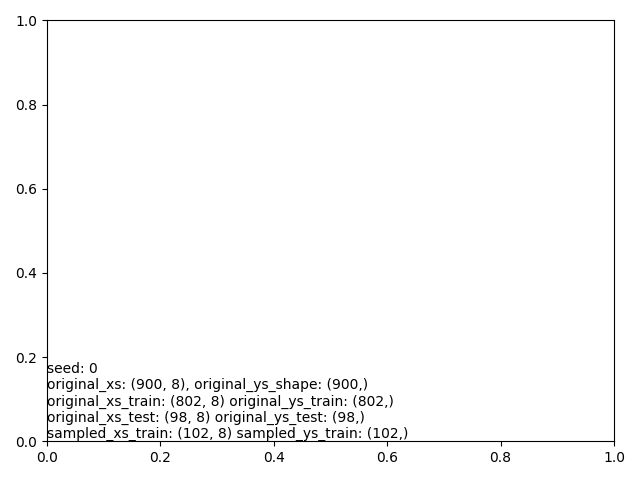

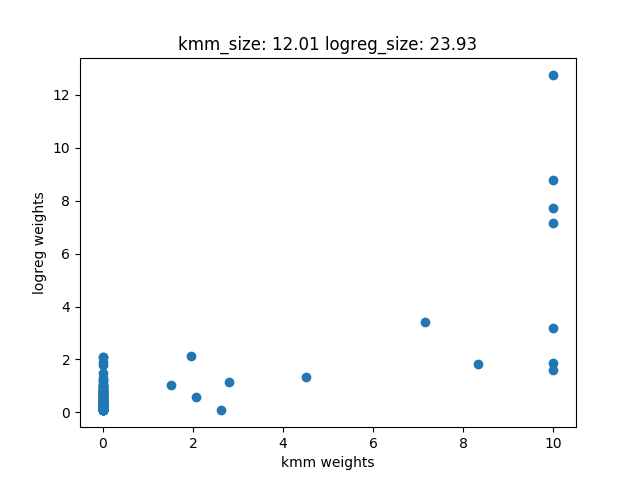

 iter		   cost val	    grad. norm
    1	+4.7382110456692920e+12	1.32548978e+13
    2	+8.8912006303830774e+11	1.36805850e+12
    3	+8.8641800992495728e+11	5.51588359e+11
    4	+8.7610105100652246e+11	5.03996553e+11
    5	+8.4174802590879590e+11	3.84480689e+11
    6	+7.3959123516066028e+11	2.22810403e+11
    7	+7.3123354593570496e+11	2.89053589e+11
    8	+7.3046723833334534e+11	4.26409138e+11
    9	+7.2757151077096790e+11	3.79637213e+11
   10	+7.1901862388305847e+11	1.99898011e+11
   11	+7.1410350078403809e+11	3.05756568e+11
   12	+7.0804171020292529e+11	2.71897759e+11
   13	+7.0324151819393042e+11	2.01707098e+11
   14	+7.0032145608835974e+11	2.58254451e+11
   15	+6.9706972792458105e+11	2.42871571e+11
   16	+6.9624609502556555e+11	3.39938715e+11
   17	+6.9341726117813623e+11	2.46416383e+11
   18	+6.9173575383896594e+11	2.91752242e+11
   19	+6.8779016415455920e+11	1.15398225e+11
   20	+6.7472121609311108e+11	1.29954227e+11
   21	+6.7400945881473975e+11	2.06910353e+11
   22	+6.724199305440

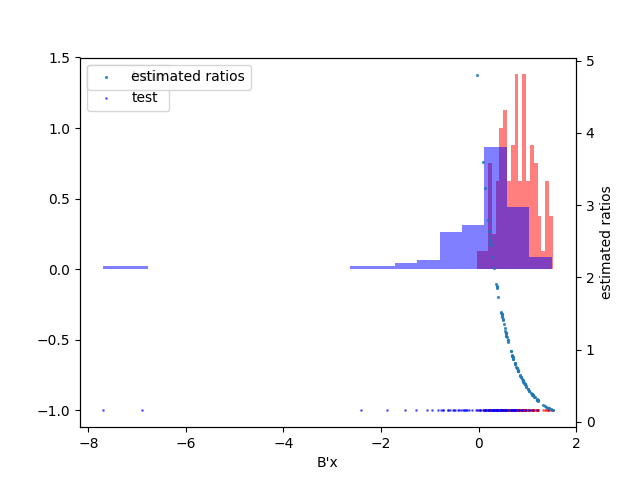

('train_loss: 801340424795.59',)
('test_loss: 12883852753940.36',)


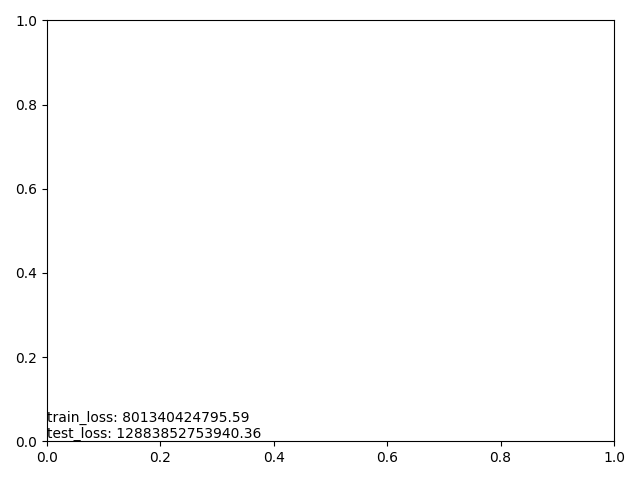

b_norm: 1.0


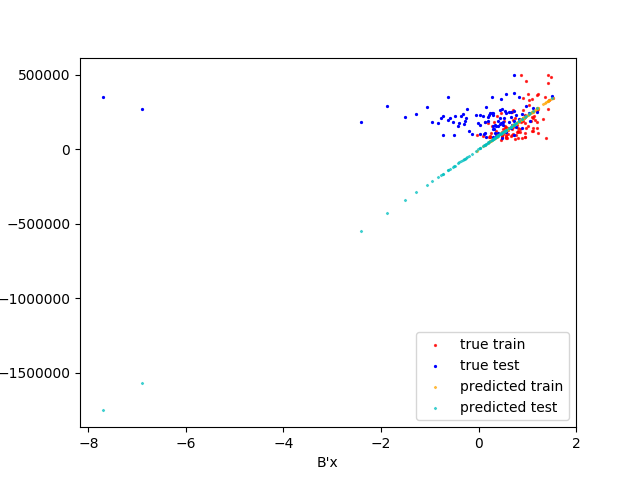

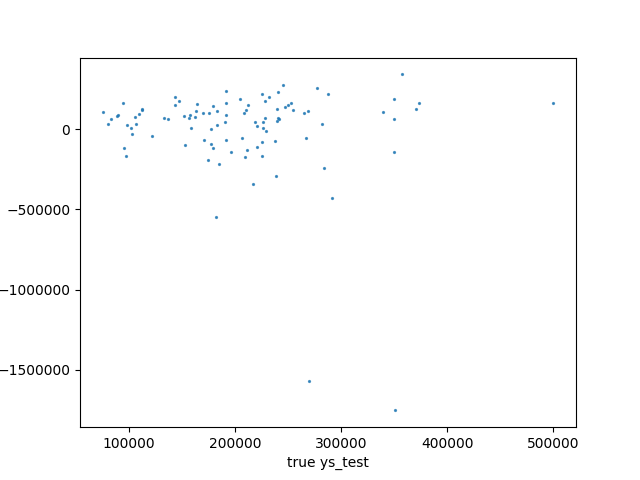

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 12883852753940.36',)


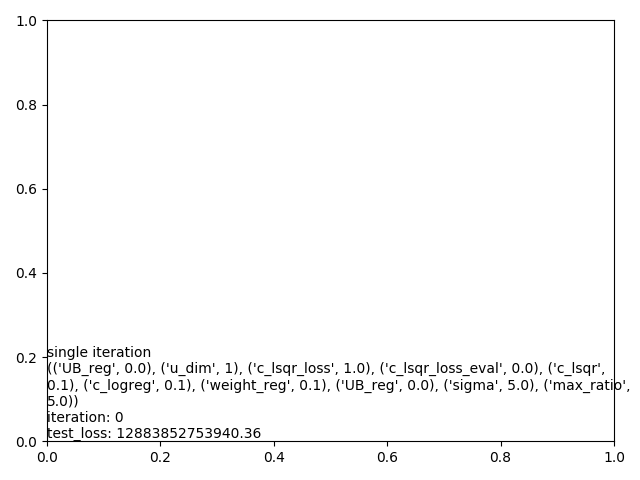

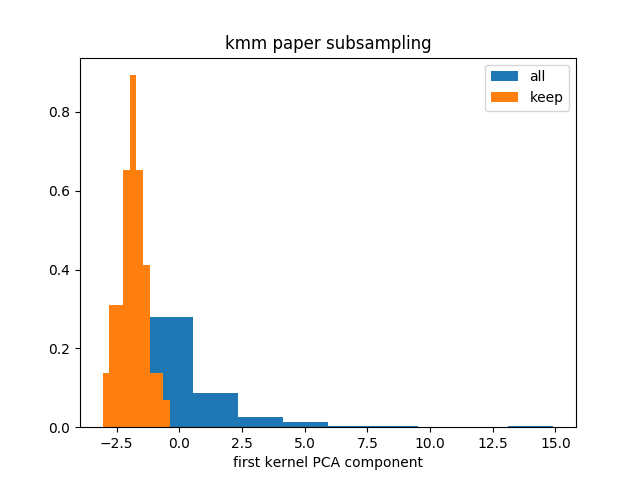

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


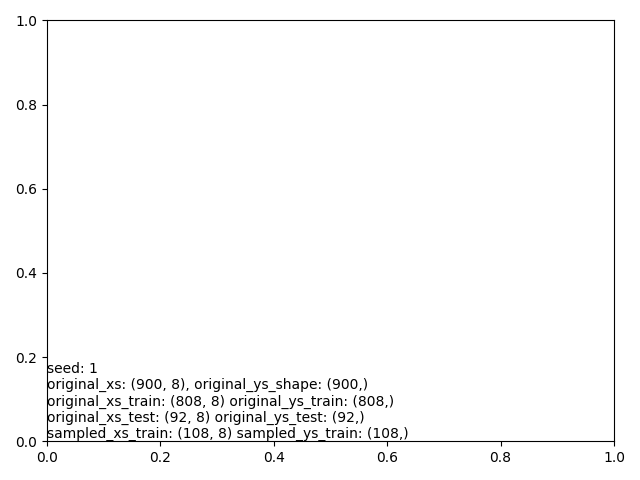

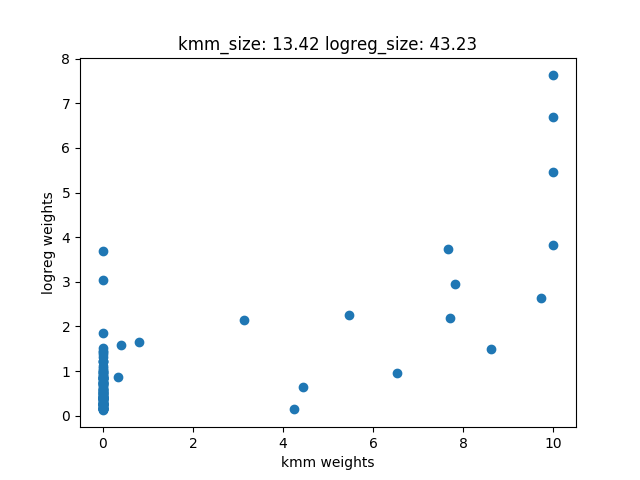

 iter		   cost val	    grad. norm
    1	+5.9881739309797939e+12	9.65639137e+12
    2	+2.7399267419217534e+12	6.67342220e+12
    3	+1.9256791129356567e+12	2.81654946e+12
    4	+1.4948782362029265e+12	2.87055378e+12
    5	+1.0617405208013778e+12	2.26456508e+12
    6	+1.0537240590665228e+12	1.67087186e+12
    7	+1.0229105514437893e+12	1.54093652e+12
    8	+9.2207119932833911e+11	9.80372078e+11
    9	+9.1001190506891650e+11	1.22574840e+12
   10	+8.7233693478345239e+11	7.08008030e+11
   11	+8.5612763384658630e+11	5.18261771e+11
   12	+8.3943999964322424e+11	2.65520528e+11
   13	+8.2793269635733032e+11	5.71136482e+11
   14	+8.1385944368318994e+11	3.97534094e+11
   15	+8.0993126587989783e+11	4.50133049e+11
   16	+8.0020638608880554e+11	1.82971637e+11
   17	+7.8053525491112915e+11	5.19643345e+11
   18	+7.7288567453033606e+11	1.51317511e+11
   19	+7.7195351620882666e+11	9.29314274e+10
   20	+7.7131052893191748e+11	1.59238331e+11
   21	+7.7063447854097961e+11	1.28222887e+11
   22	+7.700419283178

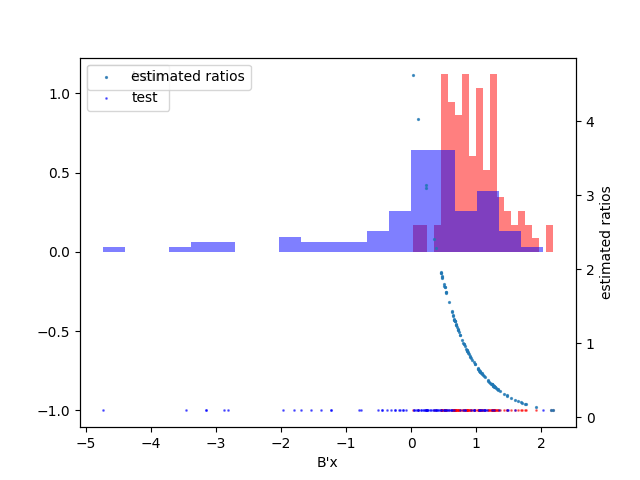

('train_loss: 1020698664256.04',)
('test_loss: 9698732133815.39',)


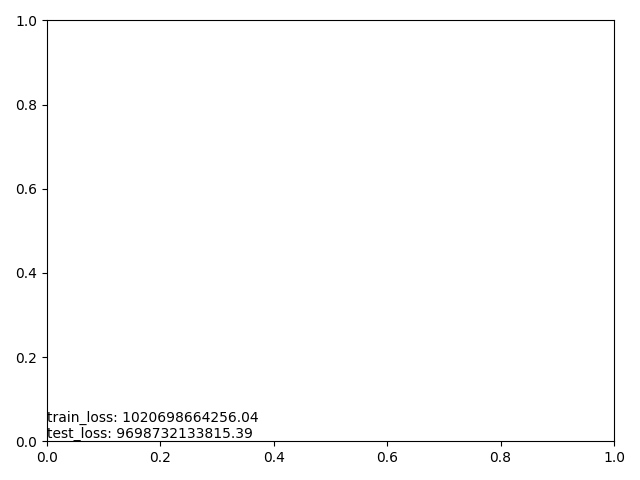

b_norm: 1.0


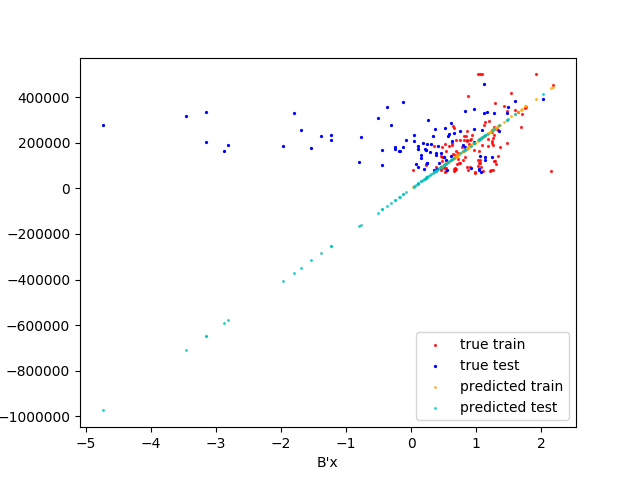

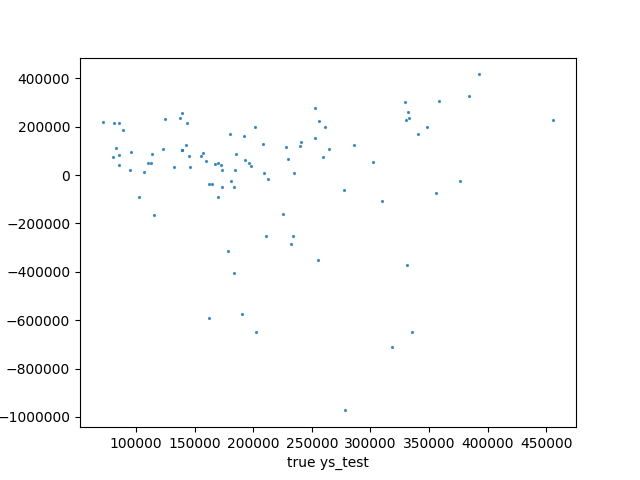

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9698732133815.39',)


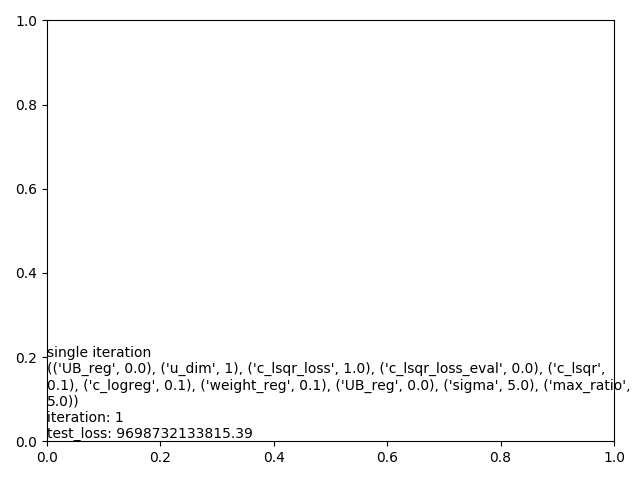

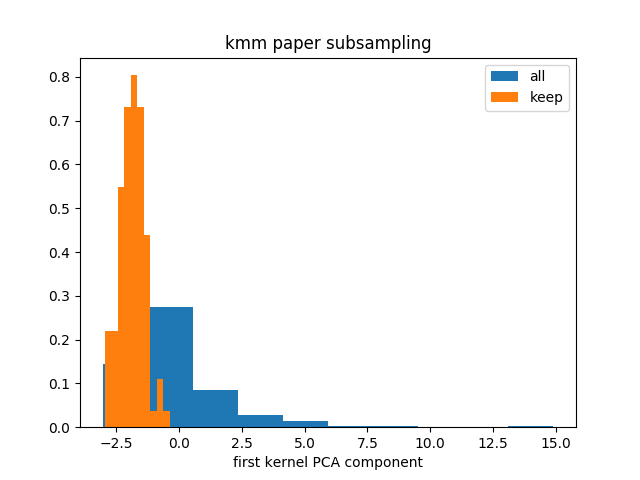

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


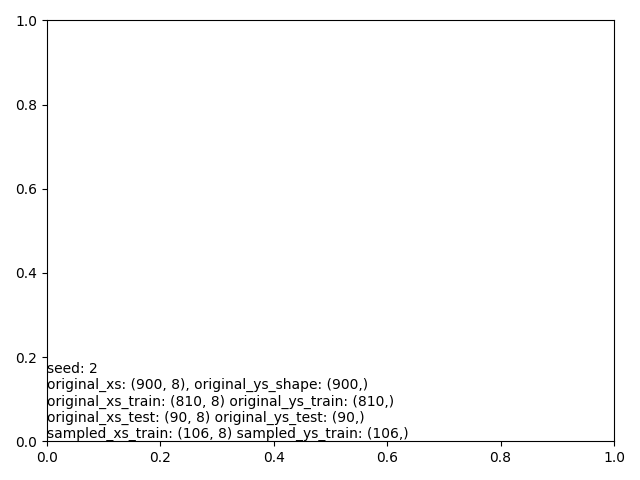

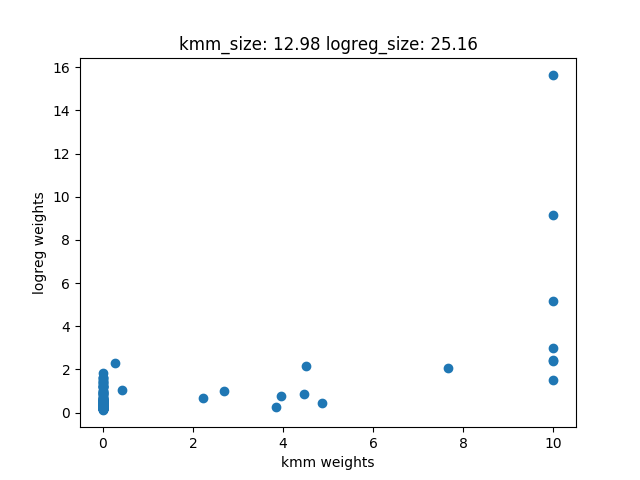

 iter		   cost val	    grad. norm
    1	+5.8141068677174941e+12	3.40776276e+12
    2	+3.3525335339407964e+12	6.64198603e+12
    3	+8.1445144512587134e+11	1.10066475e+12
    4	+7.7606882160897388e+11	2.27207633e+12
    5	+6.5507889427380139e+11	1.35892294e+12
    6	+5.6121826590879553e+11	2.35195912e+11
    7	+5.5836486867666895e+11	3.82895080e+11
    8	+5.5008824379042090e+11	1.88347468e+11
    9	+5.4948955937388531e+11	3.18033322e+11
   10	+5.4725162077714935e+11	2.76639155e+11
   11	+5.4119425498342755e+11	1.17485359e+11
   12	+5.3821590178084357e+11	1.57832474e+11
   13	+5.3588408901747192e+11	1.17541490e+11
   14	+5.3428990308438269e+11	1.36643485e+11
   15	+5.3356186464460120e+11	1.69718315e+11
   16	+5.3149419037250226e+11	8.05056445e+10
   17	+5.3140853662031781e+11	1.91684640e+11
   18	+5.3107718854469208e+11	1.79098069e+11
   19	+5.2994135198981122e+11	1.28849937e+11
   20	+5.2922094762113873e+11	1.19864839e+11
   21	+5.2806089195150952e+11	6.20451547e+10
   22	+5.275827358627

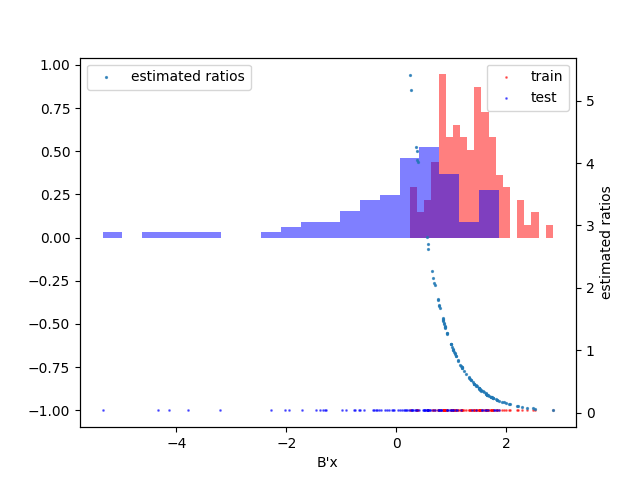

('train_loss: 869302045275.12',)
('test_loss: 8345401764698.54',)


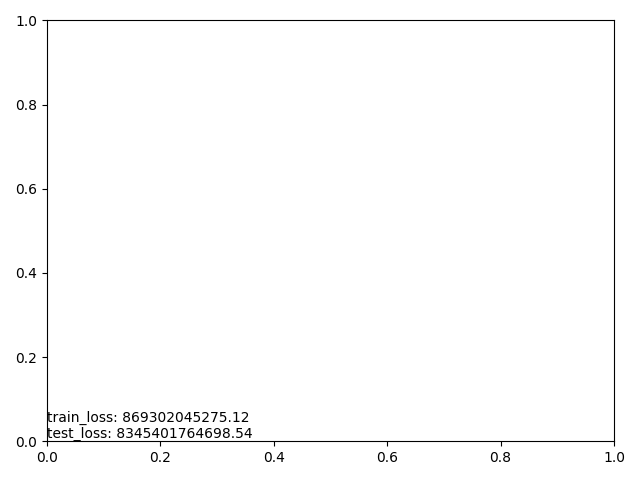

b_norm: 1.0


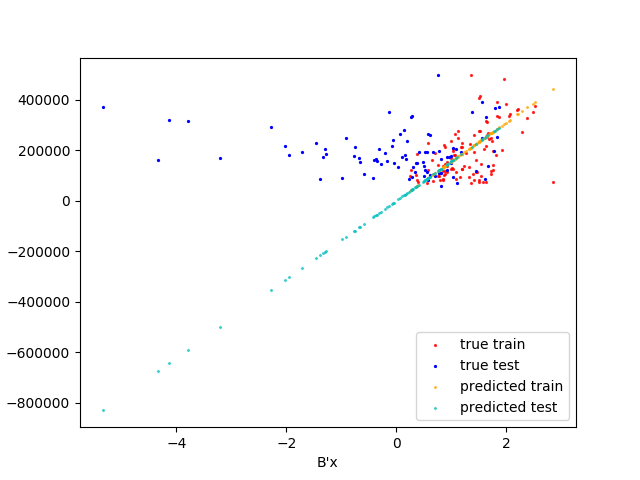

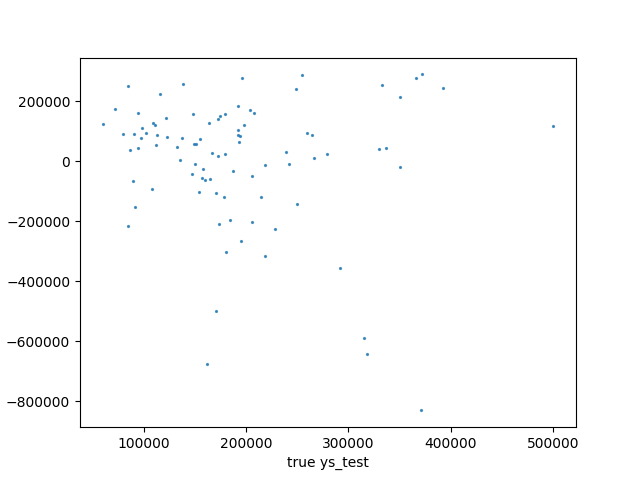

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8345401764698.54',)


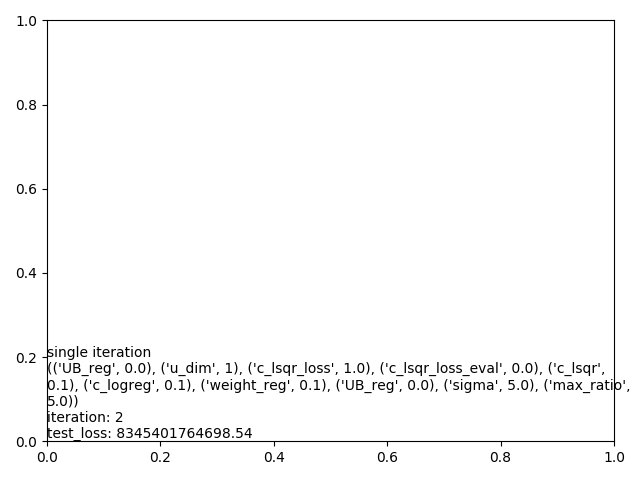

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('mean loss: 10309328884151.43',)
('std loss: 1902455542902.07',)
('test losses: [12883852753940.357, 9698732133815.3926, 8345401764698.5381]',)


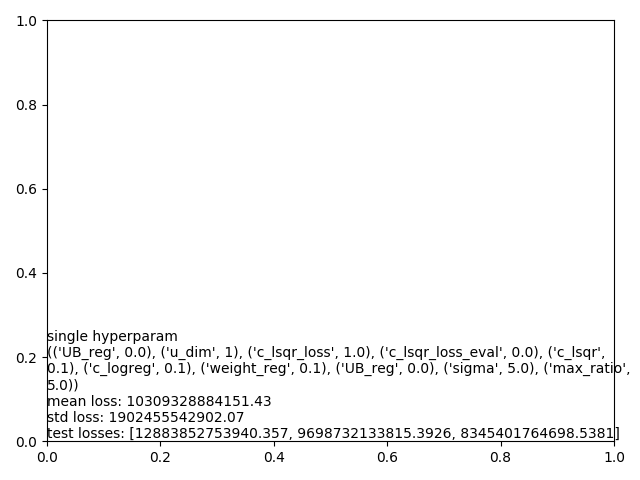

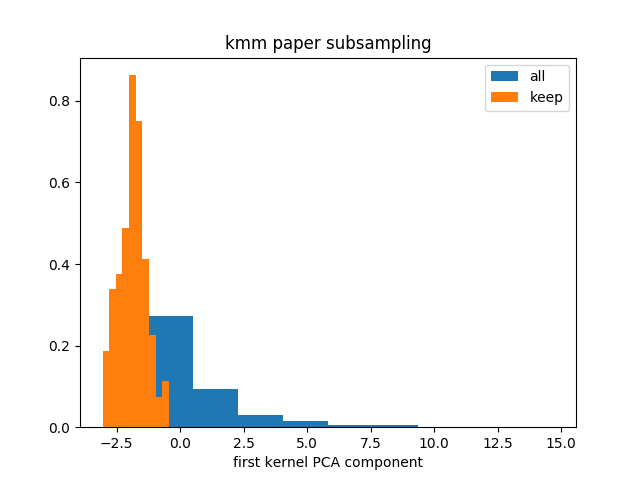

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


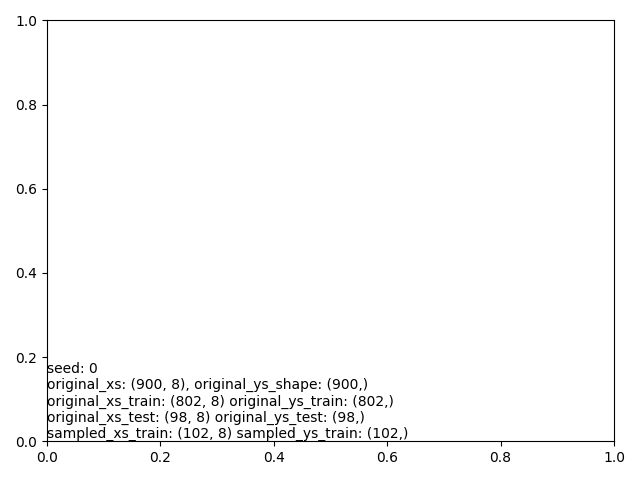

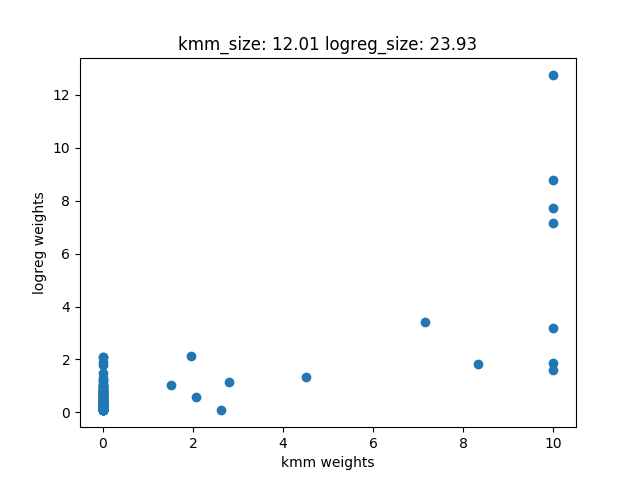

 iter		   cost val	    grad. norm
    1	+4.2779307915456489e+12	7.20701816e+12
    2	+4.2040535031044023e+12	1.11841682e+13
    3	+3.9020077969603940e+12	1.30914933e+13
    4	+3.3891376020975161e+12	6.71597569e+12
    5	+3.3124572308791216e+12	7.02066778e+12
    6	+3.1950130378649570e+12	3.92685743e+12
    7	+3.1838695478743188e+12	3.72391673e+12
    8	+3.1544729194602368e+12	1.43437615e+12
    9	+3.1432014257661626e+12	2.48099062e+12
   10	+3.1321228495089077e+12	2.20521195e+12
   11	+3.1252873648180083e+12	2.73163652e+12
   12	+3.1089469867754121e+12	1.11172992e+12
   13	+3.0495510515473496e+12	1.79420842e+12
   14	+3.0396040337328940e+12	2.07351201e+12
   15	+3.0326419744617593e+12	2.42864065e+12
   16	+3.0165762314560962e+12	1.12784404e+12
   17	+2.9637253975044150e+12	2.30429660e+12
   18	+2.9568347811367632e+12	3.06756239e+12
   19	+2.9390396766500107e+12	1.25594977e+12
   20	+2.9236337624097563e+12	2.52625669e+12
   21	+2.9145733862748101e+12	3.11668461e+12
   22	+2.894866159842

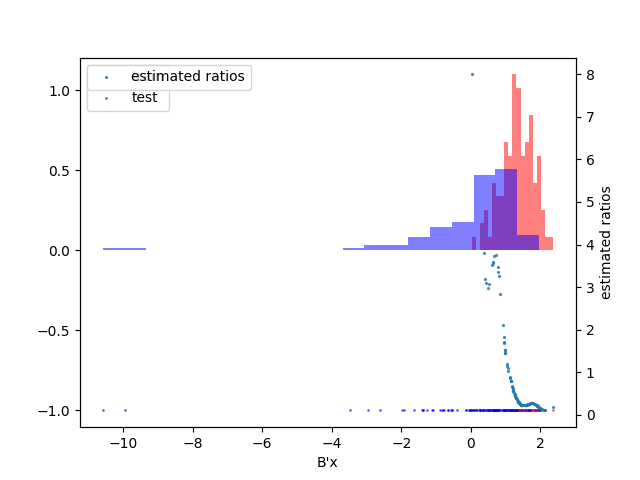

('train_loss: 1042346437282.57',)
('test_loss: 11317701470172.68',)


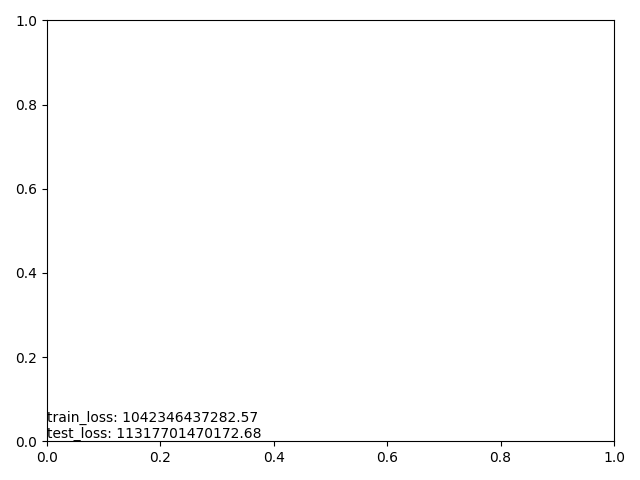

b_norm: 1.0


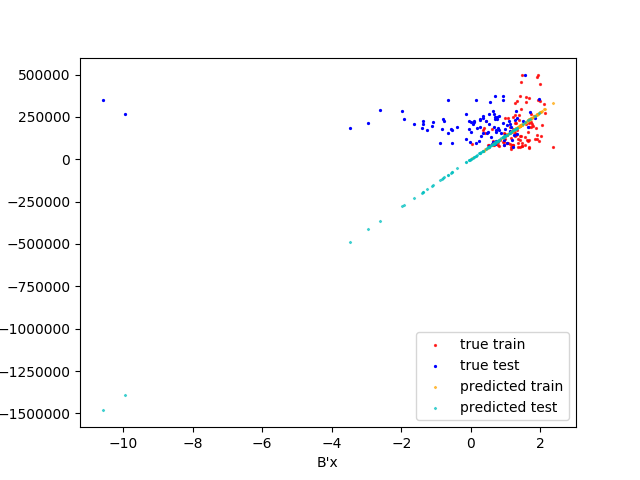

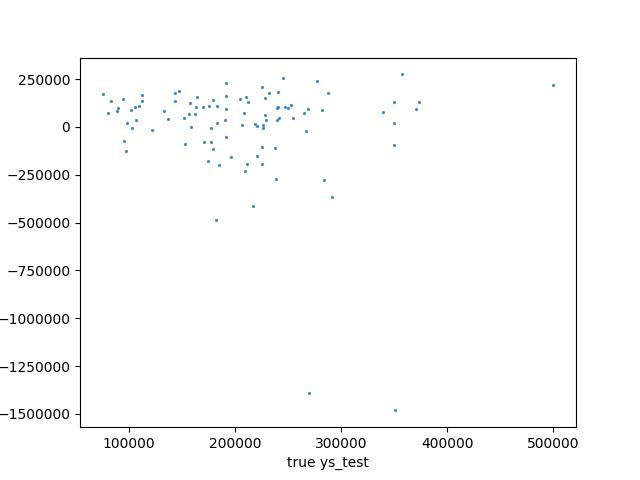

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 11317701470172.68',)


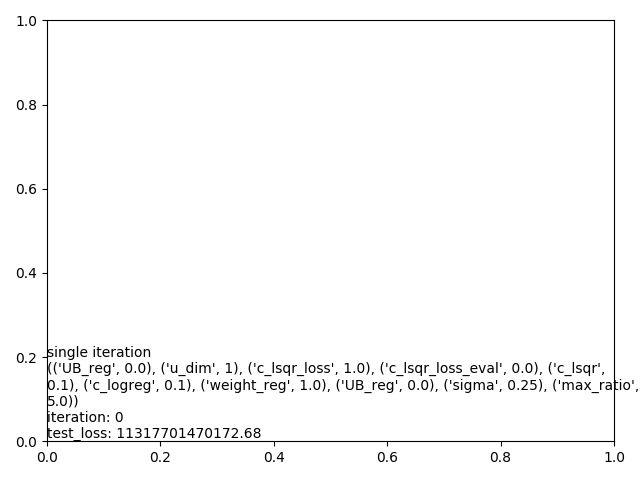

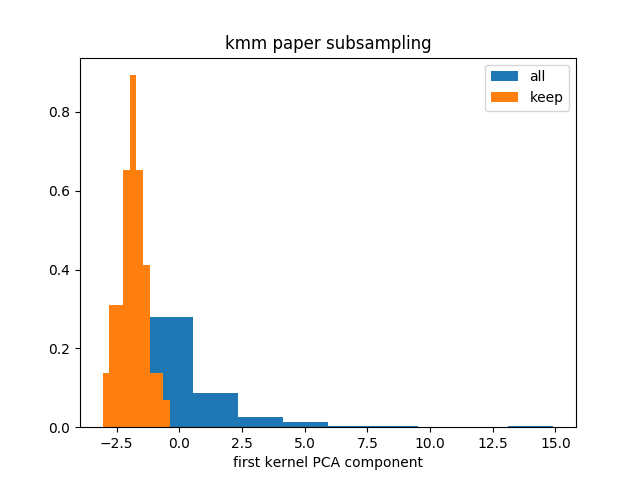

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


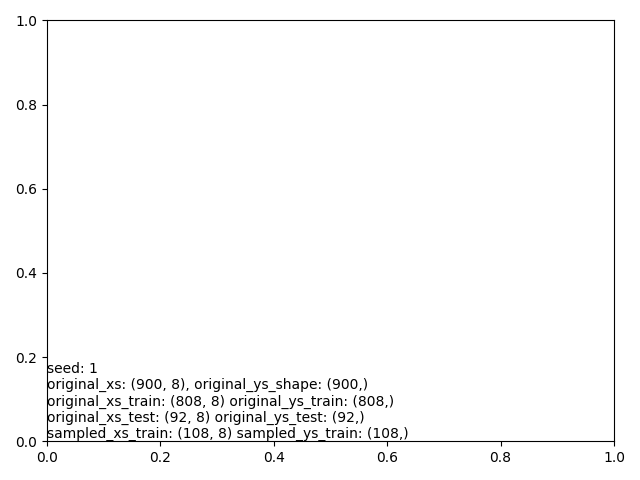

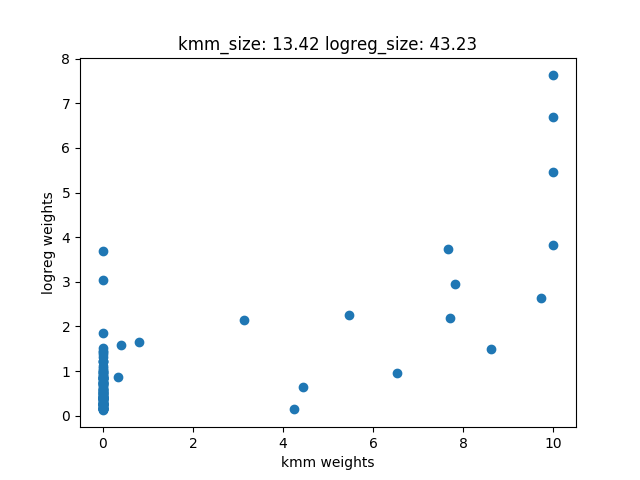

 iter		   cost val	    grad. norm
    1	+6.4145562545604717e+12	8.98179096e+12
    2	+2.8141487593411460e+12	1.30746464e+13
    3	+1.5430166239458137e+12	1.72581606e+12
    4	+1.4269011330239895e+12	1.96372420e+12
    5	+1.4149585977628684e+12	1.48370261e+12
    6	+1.4069882583074199e+12	2.05218801e+12
    7	+1.3977980482420618e+12	1.84110277e+12
    8	+1.3930270744528254e+12	2.41997615e+12
    9	+1.3778770682256782e+12	1.33401738e+12
   10	+1.3754449771559749e+12	2.66628998e+12
   11	+1.3665979363837485e+12	2.15238913e+12
   12	+1.3602411598598684e+12	1.91885635e+12
   13	+1.3513141833611558e+12	1.50811093e+12
   14	+1.3484626664446184e+12	1.62488593e+12
   15	+1.3418910810393984e+12	7.01525960e+11
   16	+1.3349742084423101e+12	2.01619488e+12
   17	+1.3238313251014255e+12	1.30582336e+12
   18	+1.3215290140315854e+12	1.22062460e+12
   19	+1.3189541294929177e+12	1.04879701e+12
   20	+1.3165809402495266e+12	6.45836845e+11
   21	+1.3149666106671763e+12	1.08771792e+12
   22	+1.312774503099

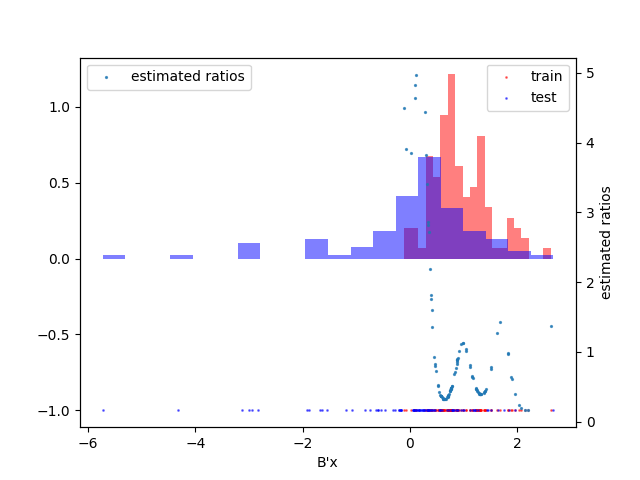

('train_loss: 1003843665867.00',)
('test_loss: 9656948455644.62',)


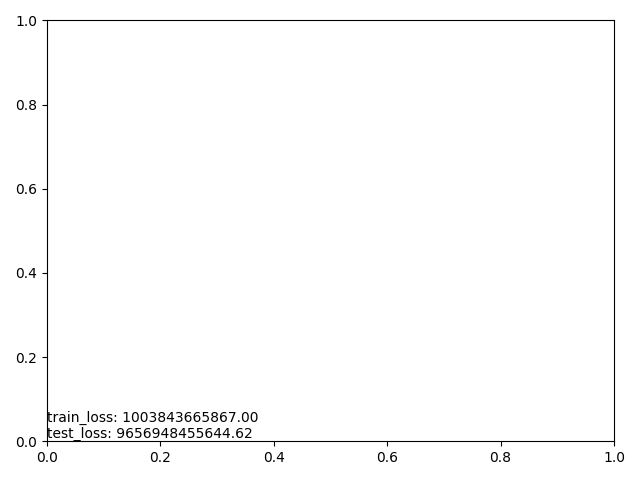

b_norm: 1.0


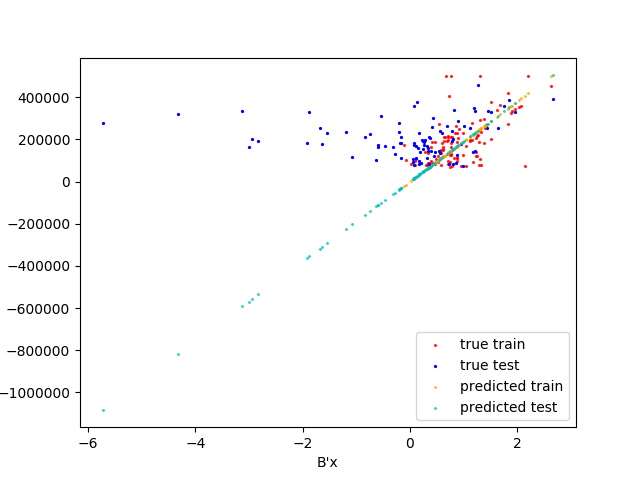

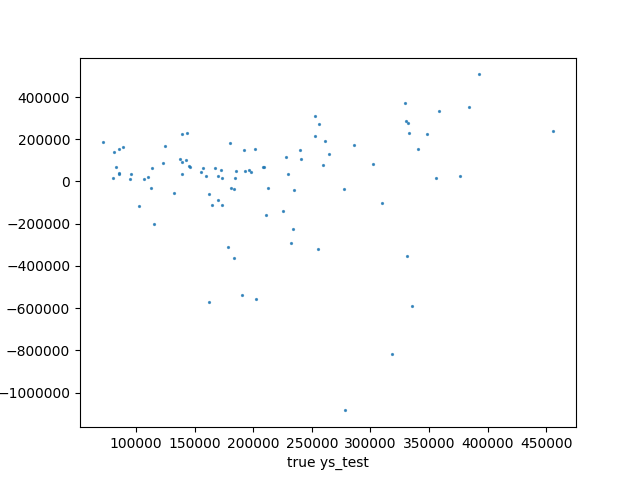

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9656948455644.62',)


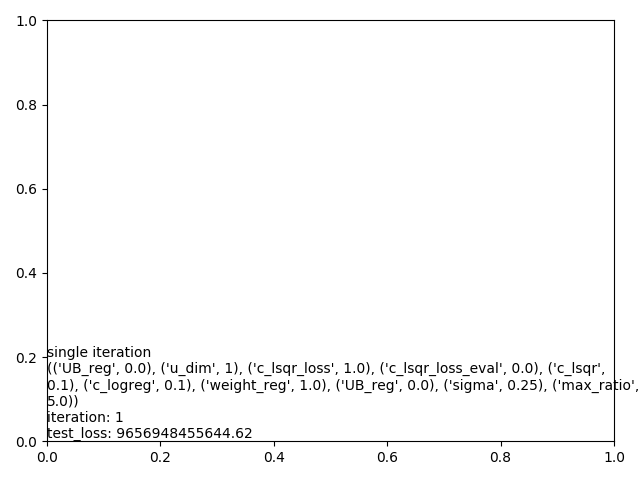

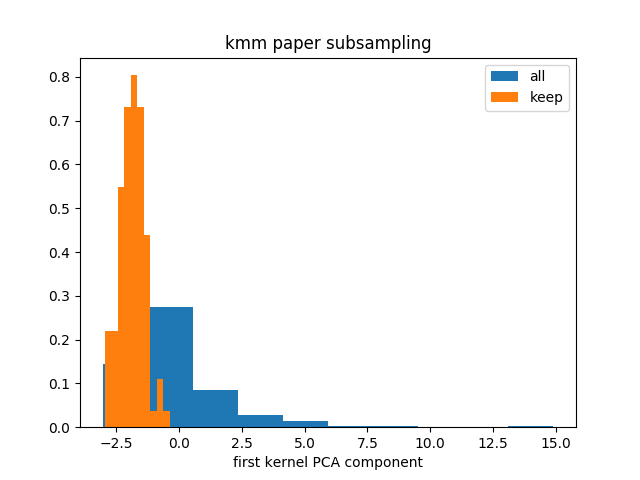

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


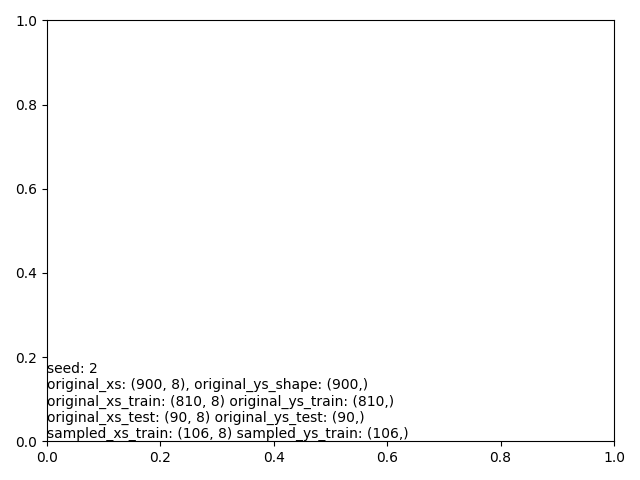

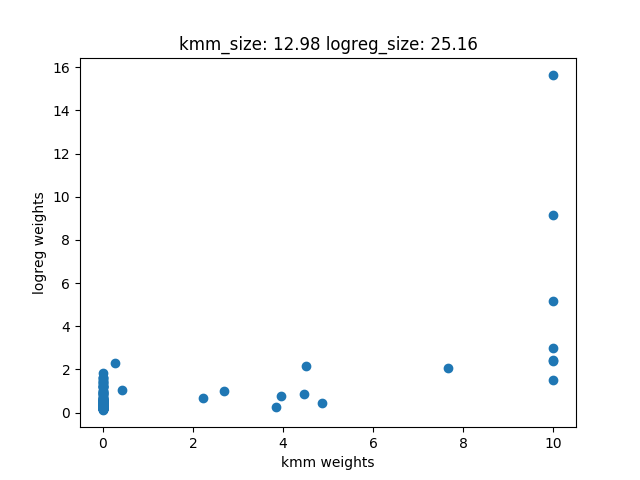

 iter		   cost val	    grad. norm
    1	+5.3823164779789570e+12	7.06828454e+12
    2	+3.1405564876112773e+12	4.51584089e+12
    3	+1.1779507420117593e+12	3.87751880e+12
    4	+7.4711180880234985e+11	1.78497650e+12
    5	+6.7953382893772998e+11	1.31731386e+12
    6	+6.0479216972307910e+11	6.58078363e+11
    7	+5.8743710398147217e+11	4.16554787e+11
    8	+5.8226658634793103e+11	4.57223967e+11
    9	+5.7713592689799695e+11	5.74716927e+11
   10	+5.7015760796888770e+11	4.22640312e+11
   11	+5.6623083095193152e+11	4.65987666e+11
   12	+5.6389248174700439e+11	4.88793580e+11
   13	+5.5890851754160962e+11	1.83921104e+11
   14	+5.5601485208346936e+11	4.66420406e+11
   15	+5.5285992982821497e+11	2.90660715e+11
   16	+5.5139898509907898e+11	1.09903732e+11
   17	+5.5077527059760596e+11	1.90063789e+11
   18	+5.5052541614404858e+11	2.23724369e+11
   19	+5.4979339246011755e+11	1.13165805e+11
   20	+5.4964618651752814e+11	2.29258027e+11
   21	+5.4915469384538354e+11	1.55930986e+11
   22	+5.486695588399

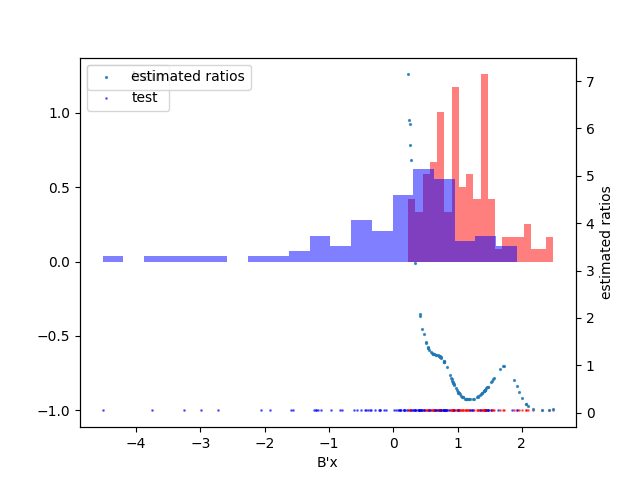

('train_loss: 858041130943.13',)
('test_loss: 8350985815361.09',)


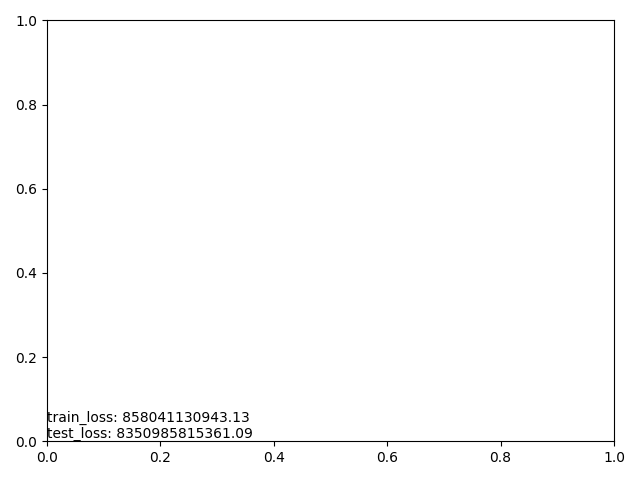

b_norm: 1.0


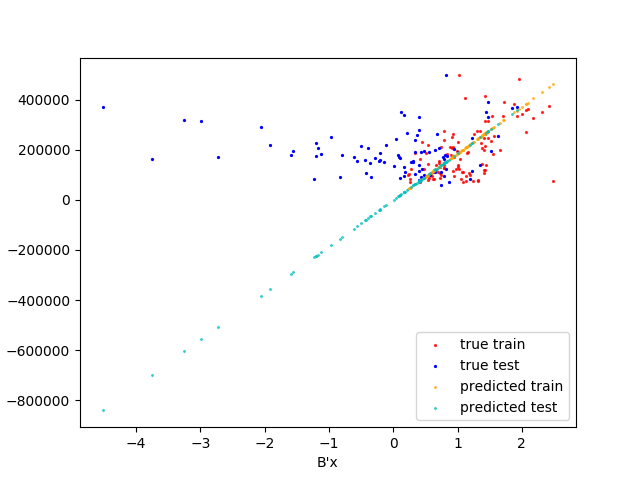

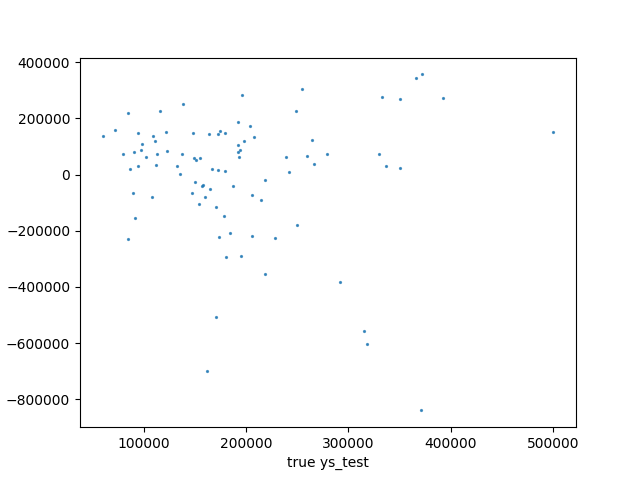

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8350985815361.09',)


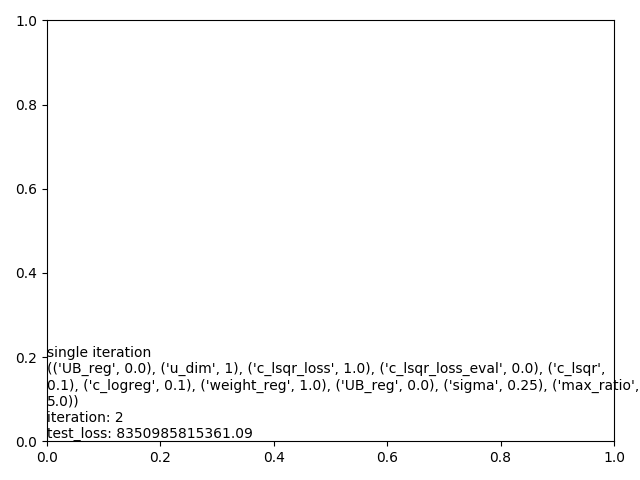

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('mean loss: 9775211913726.13',)
('std loss: 1214040122418.83',)
('test losses: [11317701470172.682, 9656948455644.6211, 8350985815361.0898]',)


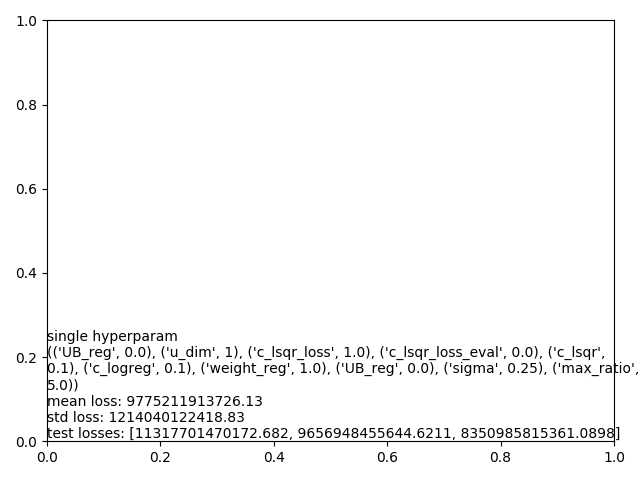

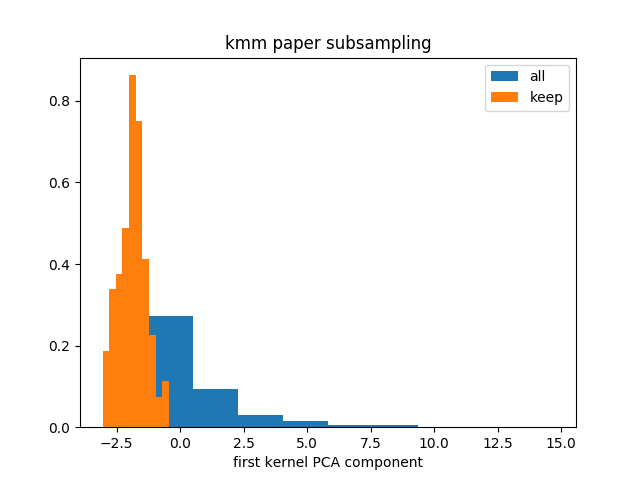

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


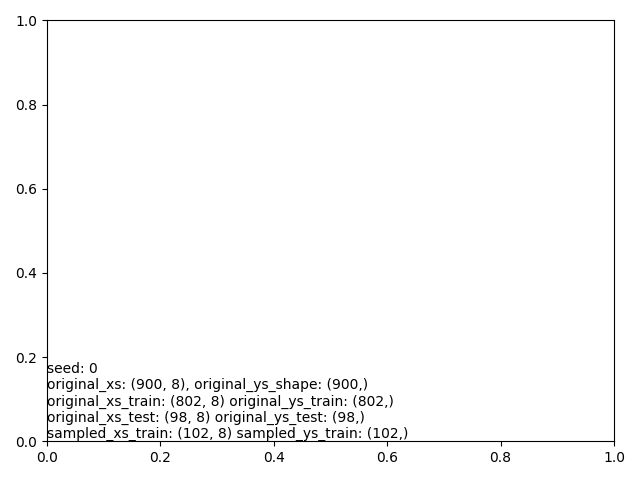

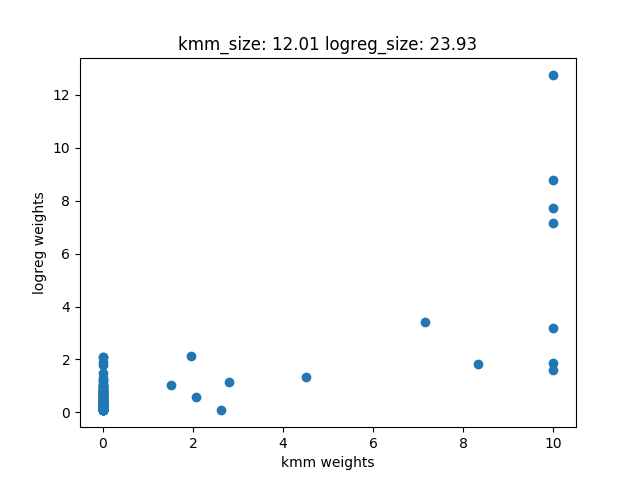

 iter		   cost val	    grad. norm
    1	+5.9251986693940273e+12	1.60327742e+13
    2	+1.3102768011904309e+12	2.91785481e+12
    3	+1.0612339074315336e+12	1.91088101e+12
    4	+9.3109084791760828e+11	1.01313440e+12
    5	+7.8537503992940442e+11	2.89436887e+11
    6	+7.7649866943043274e+11	3.34138330e+11
    7	+7.6859523673894275e+11	1.94738931e+11
    8	+7.6756106593846765e+11	4.13049684e+11
    9	+7.6388233481006311e+11	3.23373955e+11
   10	+7.5773360709442004e+11	1.72095134e+11
   11	+7.5625956154181055e+11	3.75493395e+11
   12	+7.5146232578440552e+11	2.41577033e+11
   13	+7.4745547826384302e+11	1.85045886e+11
   14	+7.4415772367640894e+11	2.22947204e+11
   15	+7.4270484253581946e+11	3.42366830e+11
   16	+7.3816852969662109e+11	2.02776715e+11
   17	+7.3506541347156494e+11	2.46922210e+11
   18	+7.3225592575922668e+11	2.90436250e+11
   19	+7.2754178734897913e+11	1.89188805e+11
   20	+7.2466101811532727e+11	3.04363764e+11
   21	+7.1992863935583911e+11	1.98010551e+11
   22	+7.171604739205

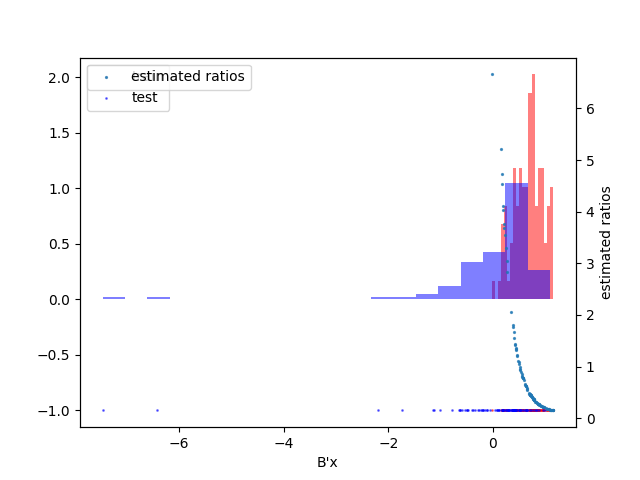

('train_loss: 981031415844.31',)
('test_loss: 15548448908389.09',)


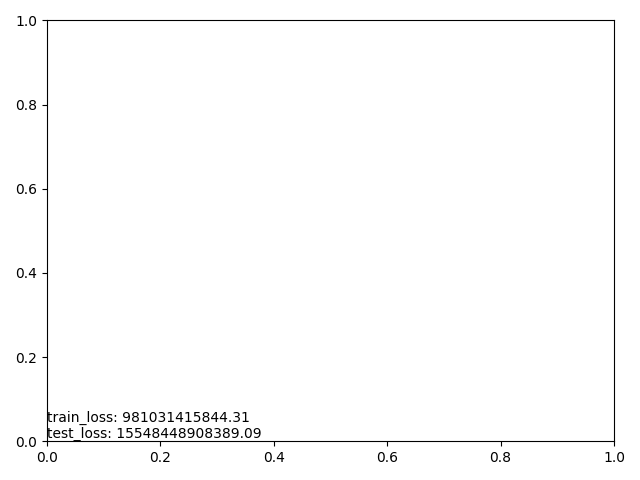

b_norm: 1.0


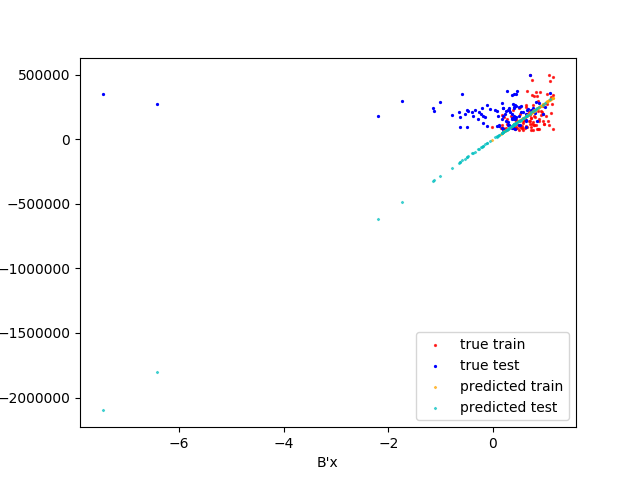

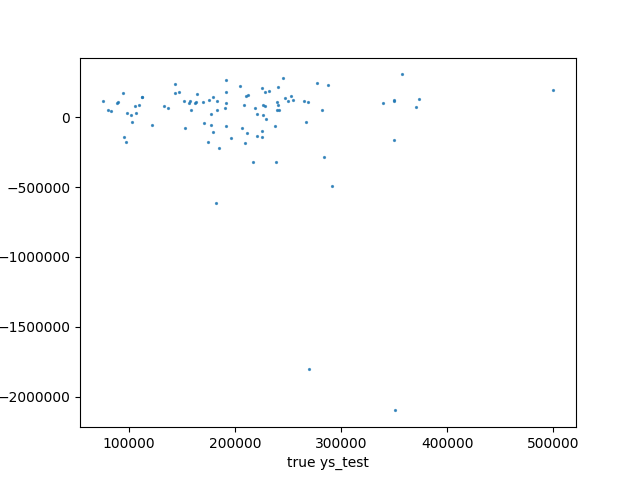

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 15548448908389.09',)


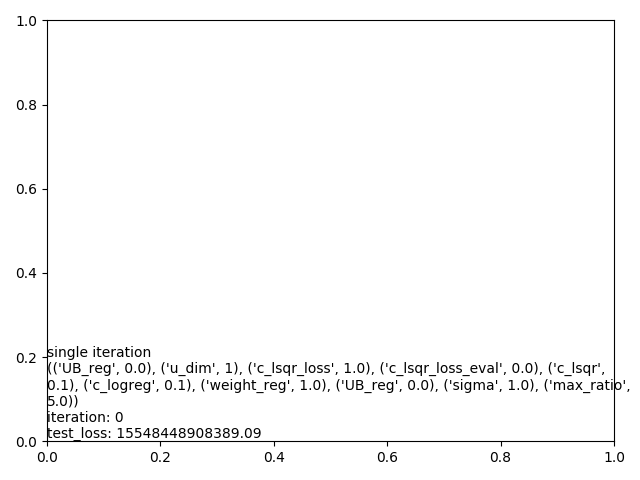

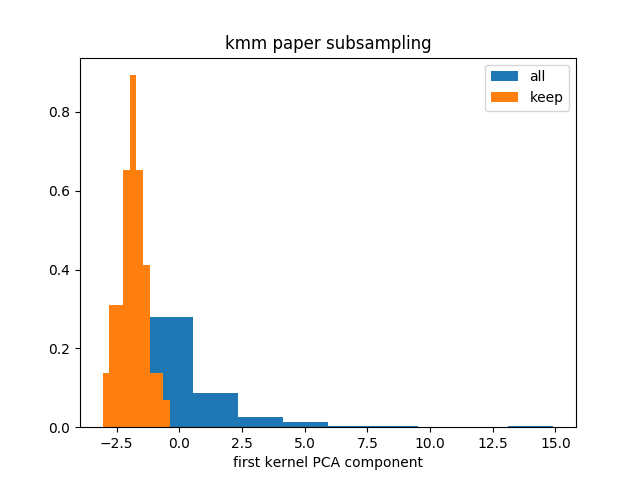

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


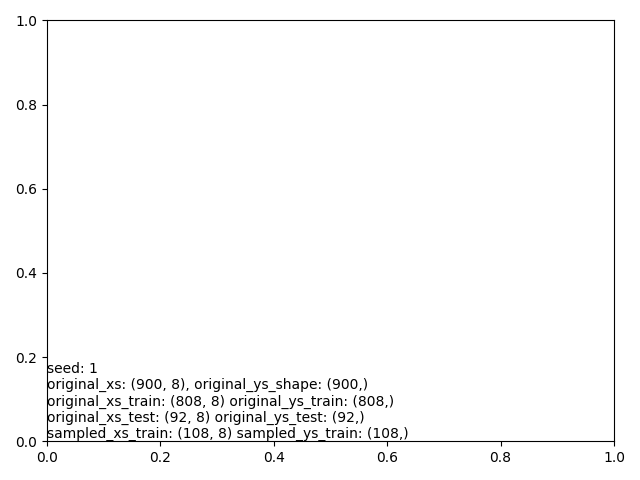

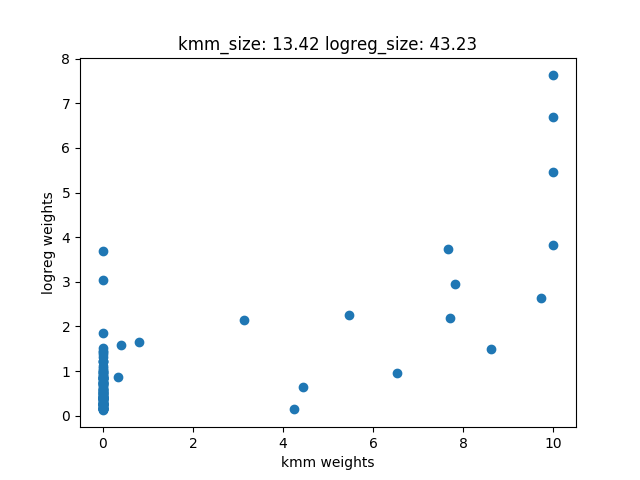

 iter		   cost val	    grad. norm
    1	+6.4422602246238457e+12	8.58657255e+12
    2	+2.4724787270077837e+12	5.79173054e+12
    3	+1.9567975980174736e+12	4.95614131e+12
    4	+1.0924293902612036e+12	1.33979502e+12
    5	+9.4654666536543091e+11	5.90255231e+11
    6	+9.3171214855303406e+11	6.20502866e+11
    7	+9.2814594009249670e+11	4.87222046e+11
    8	+9.1673468768672021e+11	3.12481117e+11
    9	+9.1228776095873926e+11	3.23412676e+11
   10	+9.1145089924818384e+11	3.52481921e+11
   11	+9.0860587713807056e+11	2.50183979e+11
   12	+9.0828304288877502e+11	2.56194359e+11
   13	+9.0709515260461731e+11	2.16393145e+11
   14	+9.0689633111595667e+11	2.14053089e+11
   15	+9.0684909896685986e+11	2.22911639e+11
   16	+9.0666263756002295e+11	2.16737058e+11
   17	+9.0650439405554590e+11	2.17916285e+11
   18	+9.0620094064105493e+11	2.12933903e+11
   19	+9.0614708725521387e+11	2.15914130e+11
   20	+9.0593633528968860e+11	2.06924255e+11
   21	+9.0587063481169531e+11	2.14128794e+11
   22	+9.056261467815

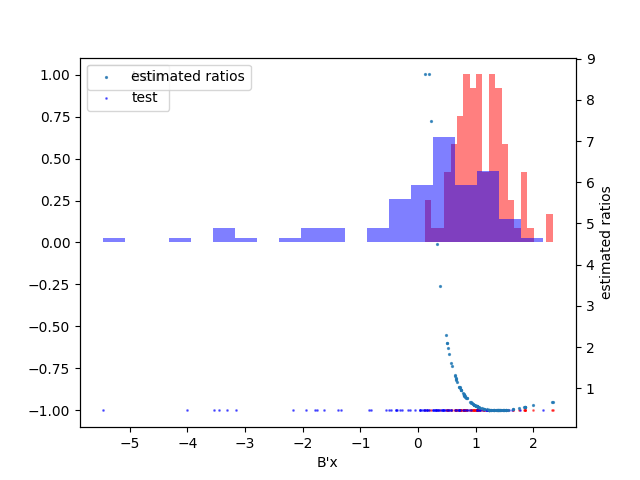

('train_loss: 1041720913171.86',)
('test_loss: 9486216101233.57',)


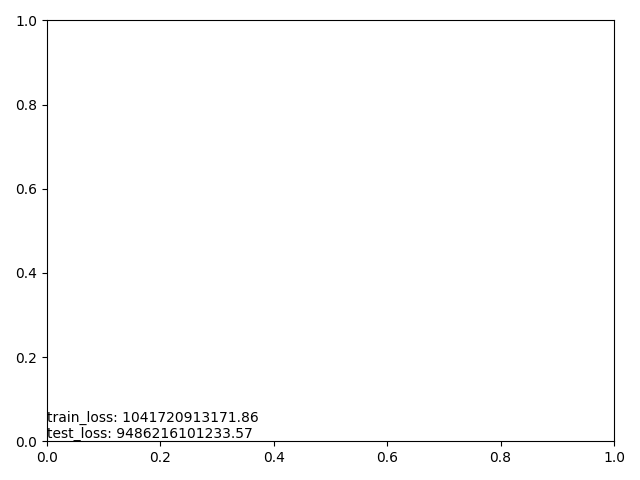

b_norm: 1.0


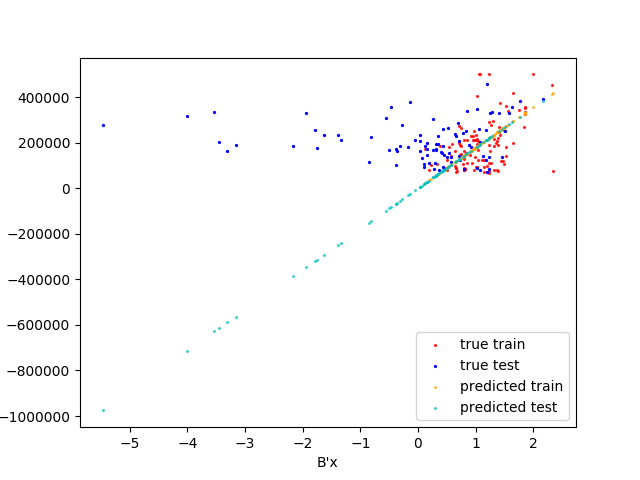

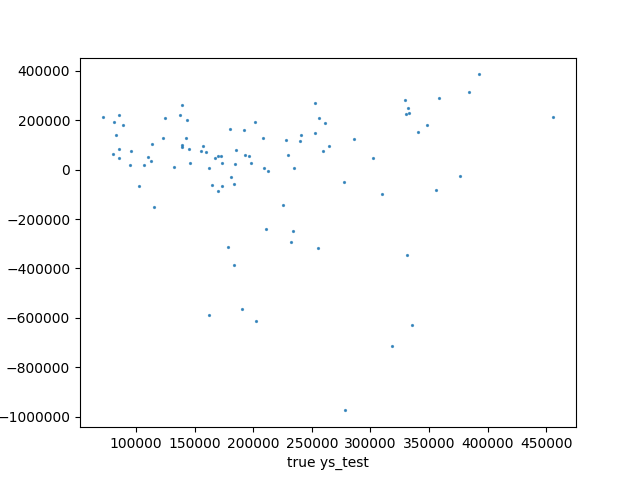

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9486216101233.57',)


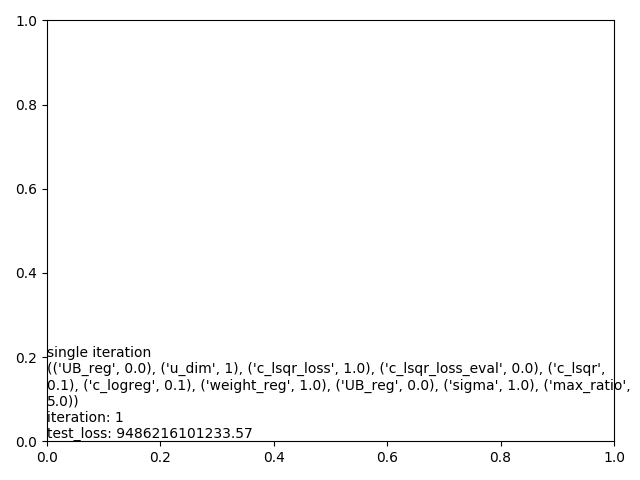

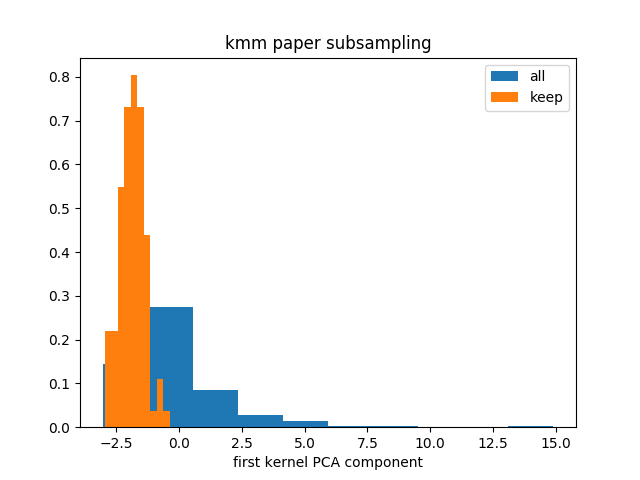

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


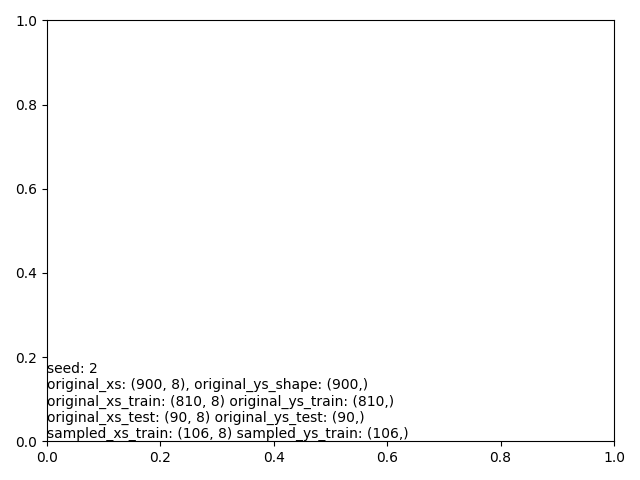

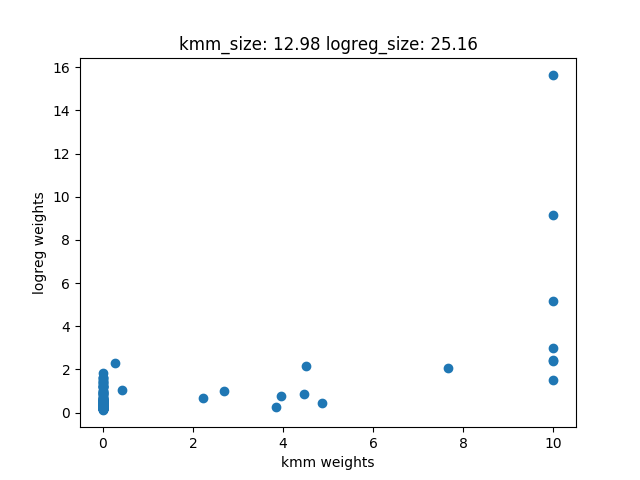

 iter		   cost val	    grad. norm
    1	+5.6578150906365742e+12	1.33426548e+12
    2	+5.6241700935745820e+12	5.60197144e+12
    3	+5.4858653045706230e+12	5.92126280e+12
    4	+4.9336832756790059e+12	6.89863276e+12
    5	+2.8094960349940103e+12	8.99696457e+12
    6	+9.6269581898888342e+11	2.14991806e+12
    7	+8.3370422347433179e+11	3.22776041e+12
    8	+6.3781161434098389e+11	3.19951687e+11
    9	+6.3453519913894714e+11	4.03004238e+11
   10	+6.2787544908741174e+11	1.72858333e+11
   11	+6.2555725985721069e+11	2.42778470e+11
   12	+6.2443810629463391e+11	2.88197978e+11
   13	+6.2139842129717688e+11	1.26974295e+11
   14	+6.1990354991522144e+11	3.21468111e+11
   15	+6.1634118186991882e+11	1.07176263e+11
   16	+6.1587088603889087e+11	5.65319193e+11
   17	+6.1406152091946484e+11	5.22052639e+11
   18	+6.0809800367424890e+11	3.38318087e+11
   19	+6.0466315319799292e+11	1.98448140e+11
   20	+6.0312916188565454e+11	1.03359267e+11
   21	+6.0242771875992151e+11	2.24714635e+11
   22	+6.006956786774

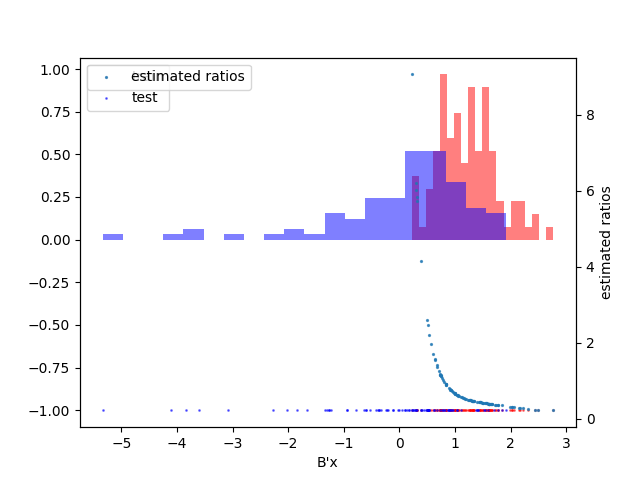

('train_loss: 843492518348.73',)
('test_loss: 8282769407674.31',)


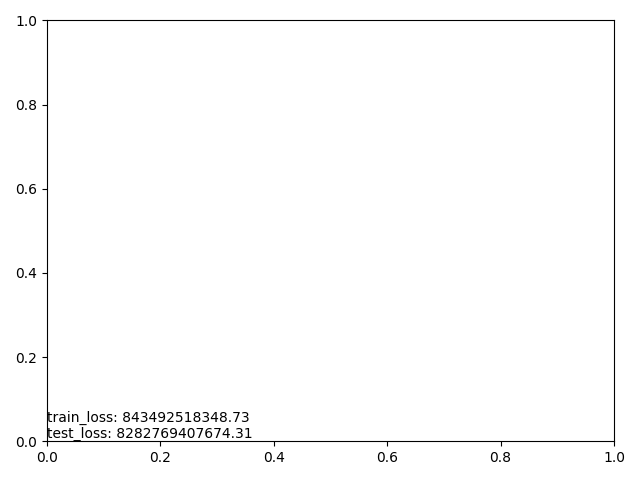

b_norm: 1.0


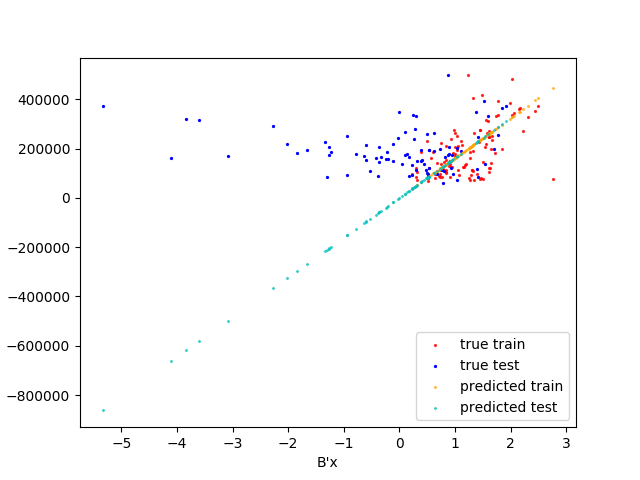

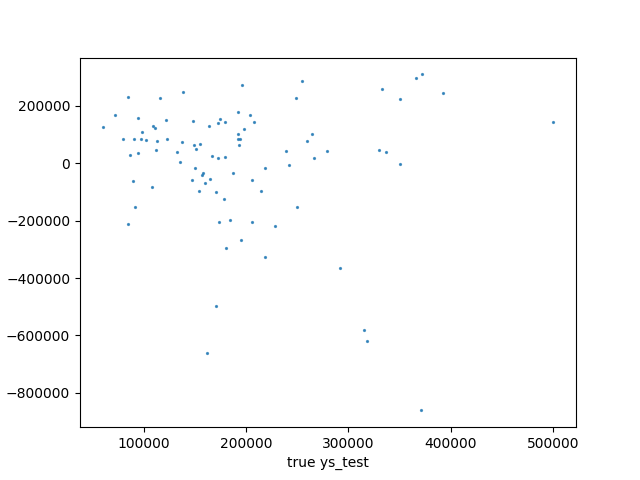

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8282769407674.31',)


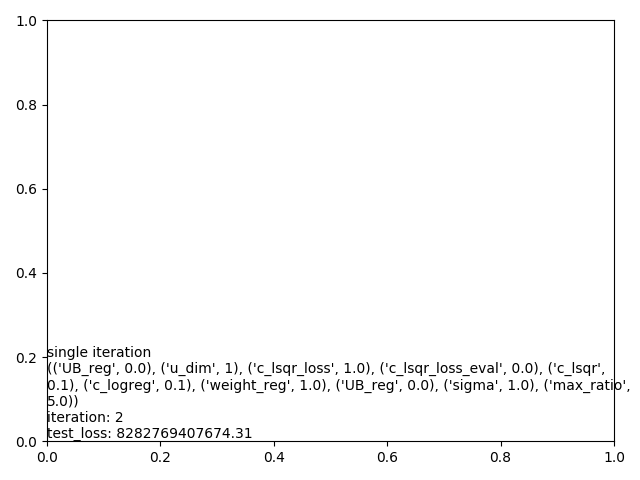

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('mean loss: 11105811472432.32',)
('std loss: 3179606005632.68',)
('test losses: [15548448908389.094, 9486216101233.5723, 8282769407674.3086]',)


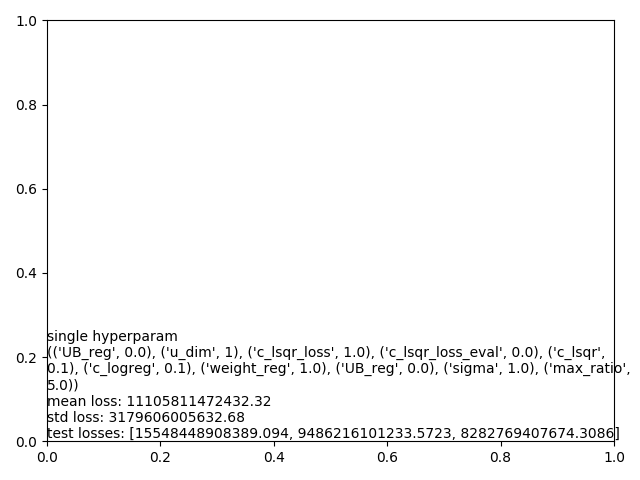

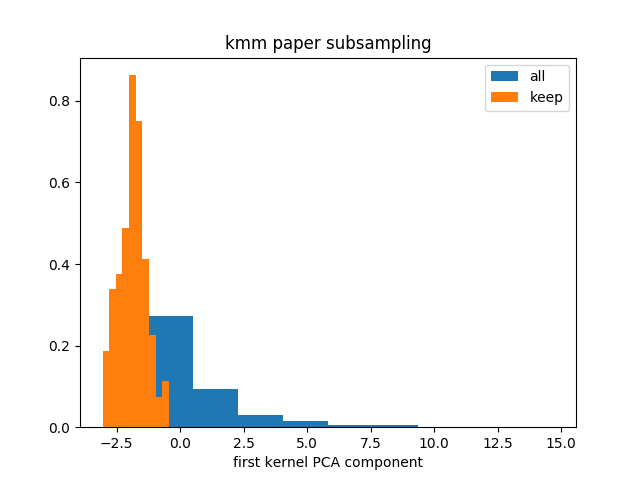

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


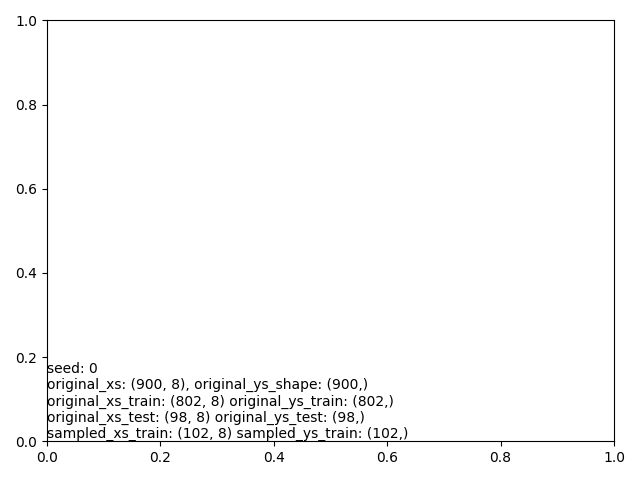

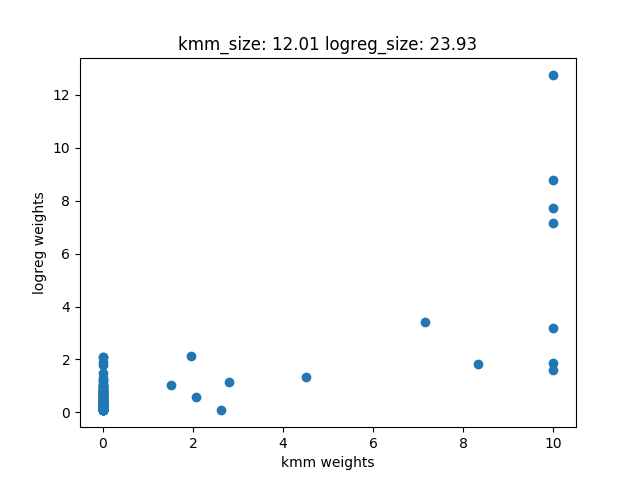

 iter		   cost val	    grad. norm
    1	+4.7382110458214717e+12	1.32548978e+13
    2	+8.8912006318192212e+11	1.36805850e+12
    3	+8.8641801019801770e+11	5.51588359e+11
    4	+8.7610105175038635e+11	5.03996555e+11
    5	+8.4174802792526758e+11	3.84480693e+11
    6	+7.3959123260781543e+11	2.22810348e+11
    7	+7.3123354716580591e+11	2.89053685e+11
    8	+7.3046720441319397e+11	4.26408526e+11
    9	+7.2757135230074744e+11	3.79634408e+11
   10	+7.1901827029390210e+11	1.99888671e+11
   11	+7.1410329045313721e+11	3.05772585e+11
   12	+7.0803996870937817e+11	2.71852056e+11
   13	+7.0324231907743005e+11	2.01857793e+11
   14	+7.0031816812526904e+11	2.57857275e+11
   15	+6.9709198840095386e+11	2.44214738e+11
   16	+6.9609162342779419e+11	3.32795815e+11
   17	+6.9280362681215442e+11	2.18823283e+11
   18	+6.8997364298183240e+11	1.64586368e+11
   19	+6.8795457545866467e+11	2.14315778e+11
   20	+6.8643257116496338e+11	2.53107279e+11
   21	+6.8344723809472864e+11	1.21618164e+11
   22	+6.812358062174

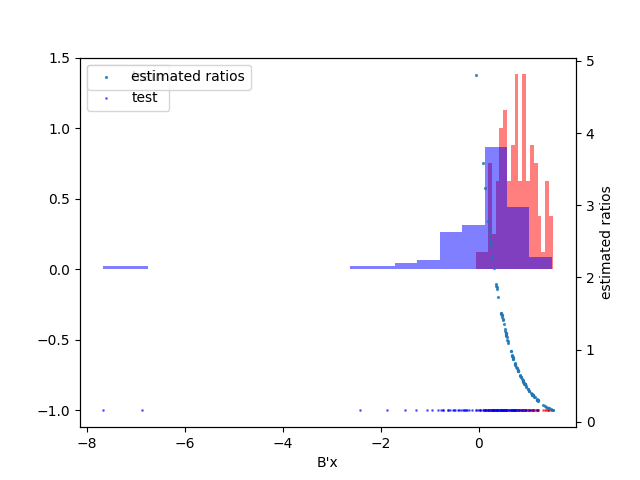

('train_loss: 801522110805.52',)
('test_loss: 12862755733593.69',)


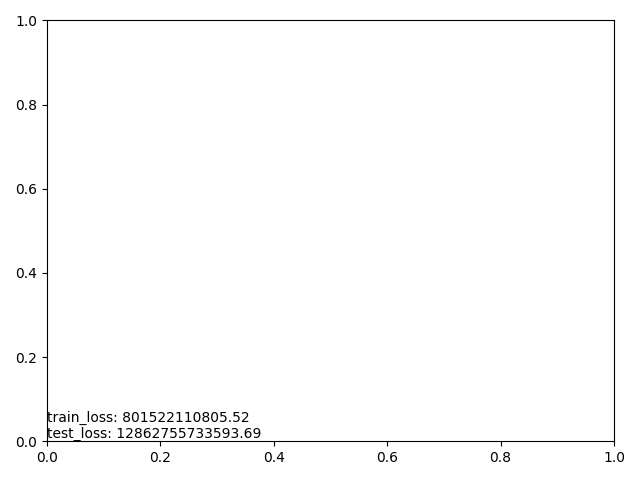

b_norm: 1.0


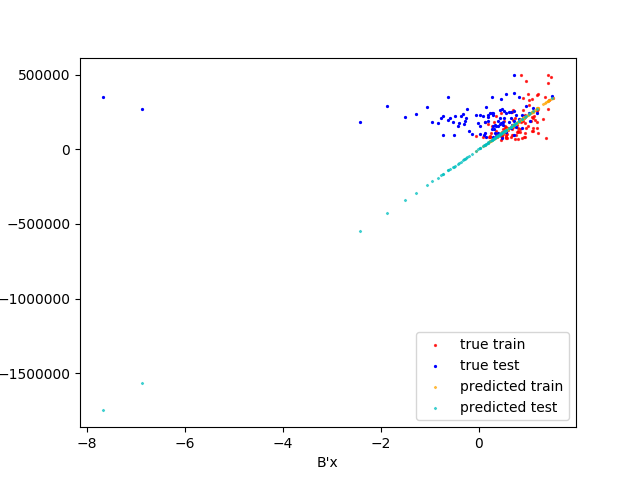

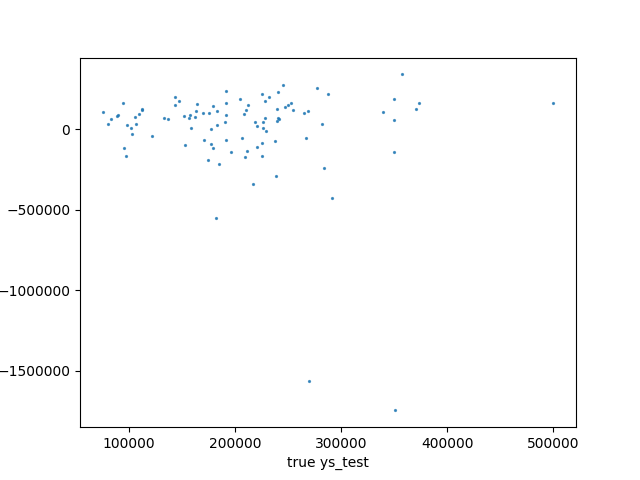

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 12862755733593.69',)


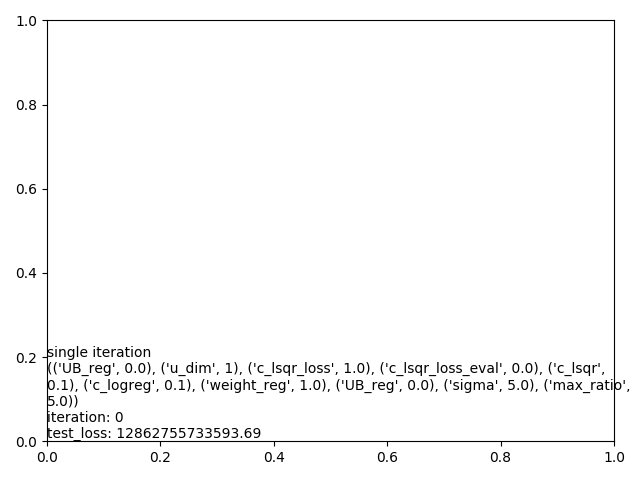

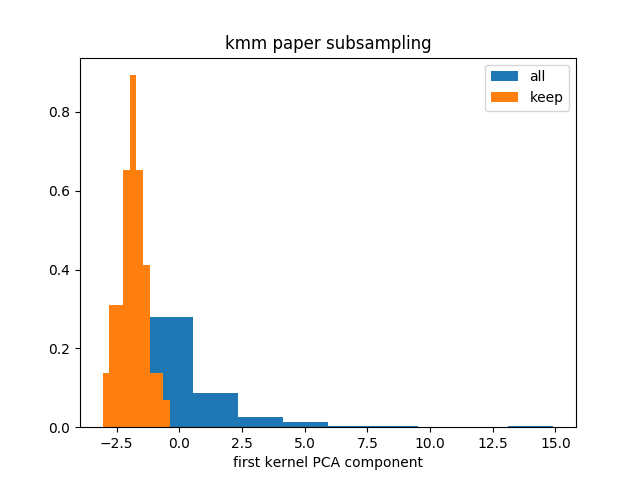

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


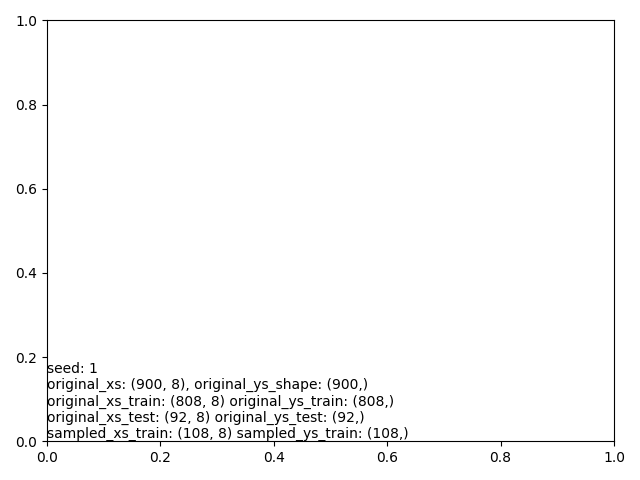

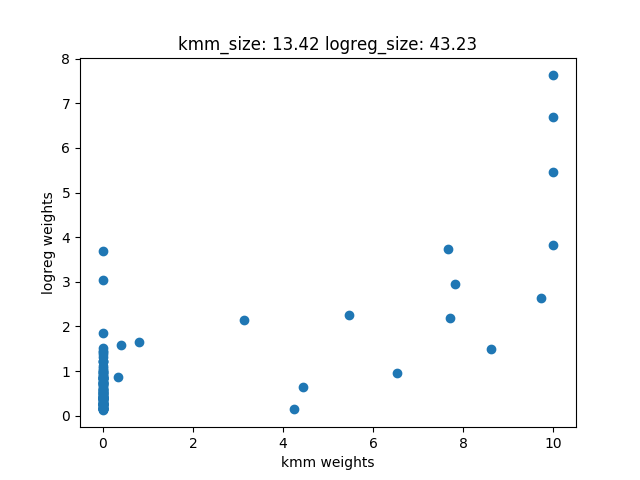

 iter		   cost val	    grad. norm
    1	+5.9881739311505645e+12	9.65639137e+12
    2	+2.7399267435430488e+12	6.67342220e+12
    3	+1.9256791114860811e+12	2.81654946e+12
    4	+1.4948782429338196e+12	2.87055379e+12
    5	+1.0617404936937794e+12	2.26456488e+12
    6	+1.0537241665478105e+12	1.67087233e+12
    7	+1.0229111544985597e+12	1.54093923e+12
    8	+9.2207296218175366e+11	9.80385567e+11
    9	+9.1000488692598730e+11	1.22565668e+12
   10	+8.7231122170451331e+11	7.07549423e+11
   11	+8.5617564403154089e+11	5.19449729e+11
   12	+8.3942736423766821e+11	2.62987852e+11
   13	+8.2702213259466357e+11	5.63579787e+11
   14	+8.1593991893346106e+11	4.90675948e+11
   15	+8.1569059836857751e+11	5.95204823e+11
   16	+8.1470739438818372e+11	5.78398995e+11
   17	+8.1100732097801831e+11	5.10289042e+11
   18	+8.0048310906396594e+11	2.39355220e+11
   19	+7.9563353392235803e+11	2.78013754e+11
   20	+7.9131650825932385e+11	2.19620330e+11
   21	+7.8790027182178015e+11	2.68217474e+11
   22	+7.874780674582

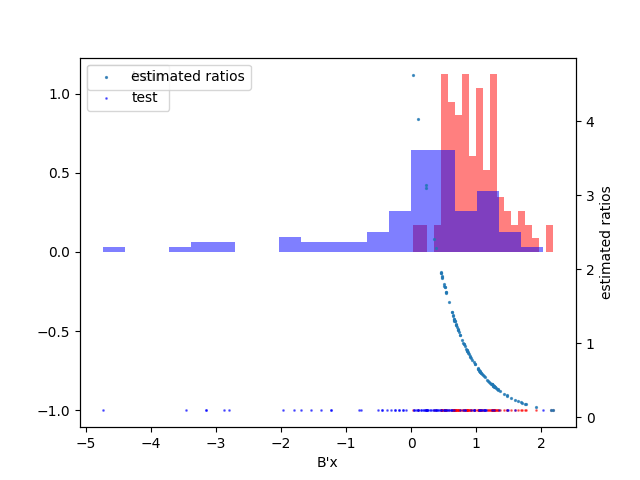

('train_loss: 1020557895065.45',)
('test_loss: 9697991705591.38',)


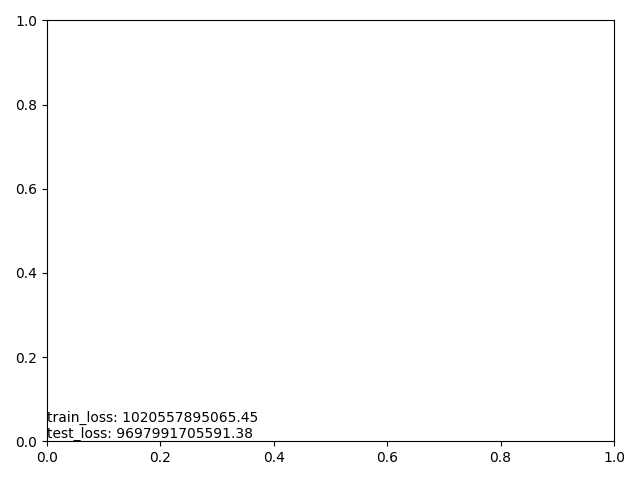

b_norm: 1.0


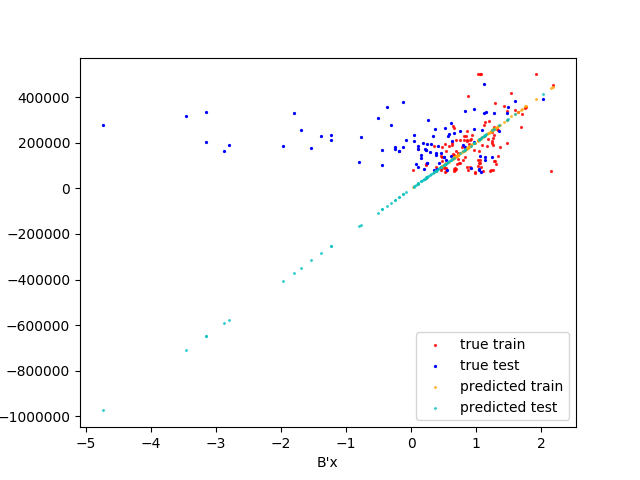

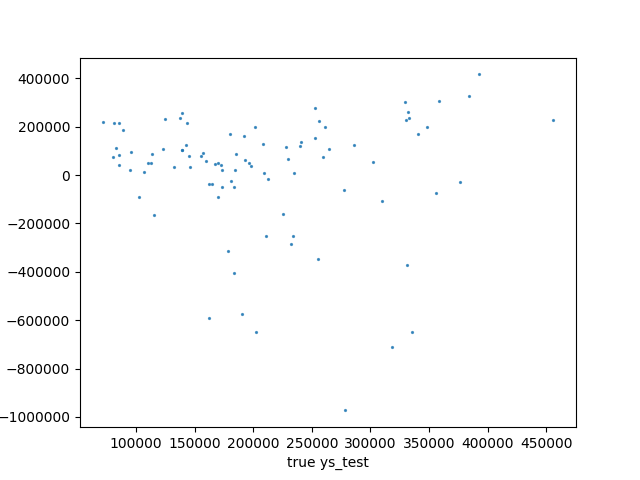

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9697991705591.38',)


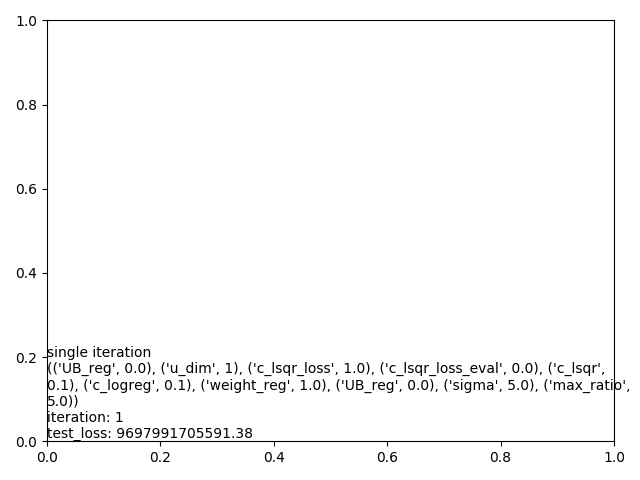

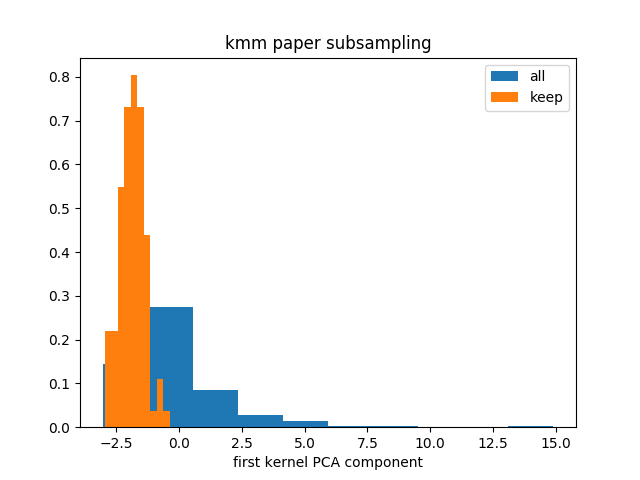

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


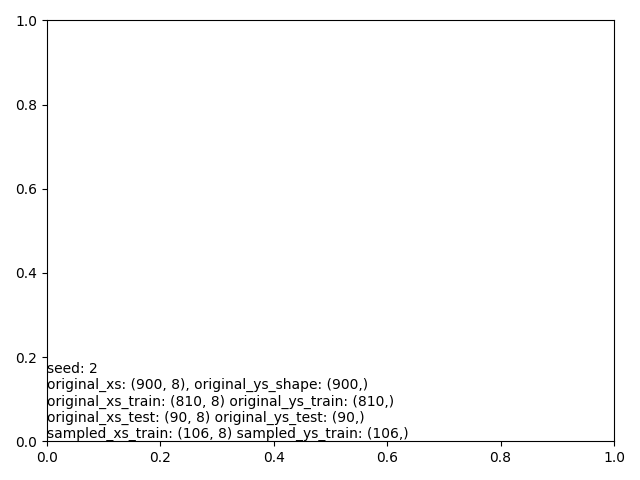

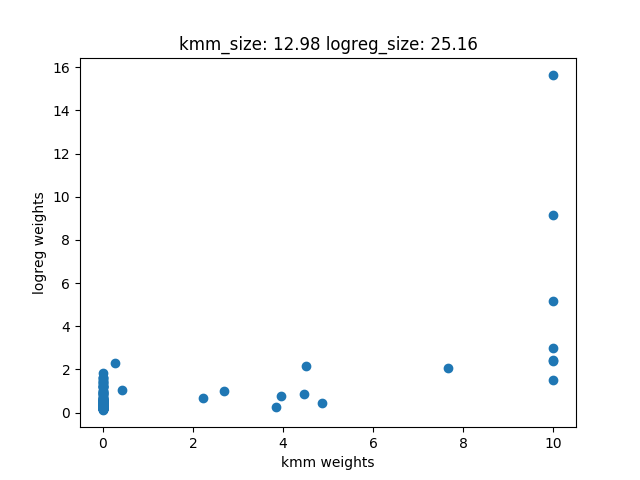

 iter		   cost val	    grad. norm
    1	+5.8141068678227373e+12	3.40776276e+12
    2	+3.3525335339785703e+12	6.64198603e+12
    3	+8.1445144533869006e+11	1.10066475e+12
    4	+7.7606882749956104e+11	2.27207638e+12
    5	+6.5507891305433533e+11	1.35892310e+12
    6	+5.6121825987795862e+11	2.35195682e+11
    7	+5.5836488196546680e+11	3.82895680e+11
    8	+5.5008828501591675e+11	1.88349201e+11
    9	+5.4948947208128412e+11	3.18029375e+11
   10	+5.4725109022816986e+11	2.76625959e+11
   11	+5.4119336457225134e+11	1.17450243e+11
   12	+5.3821343415897192e+11	1.57833503e+11
   13	+5.3588254625651477e+11	1.17619290e+11
   14	+5.3428727210703424e+11	1.36466274e+11
   15	+5.3357138070289050e+11	1.70252644e+11
   16	+5.3151976276879279e+11	8.22491645e+10
   17	+5.3143532625869702e+11	1.88825960e+11
   18	+5.3110883402177820e+11	1.76305145e+11
   19	+5.2999162594571088e+11	1.26389099e+11
   20	+5.2932108215573328e+11	1.21888544e+11
   21	+5.2808087596105536e+11	5.26396072e+10
   22	+5.275277125827

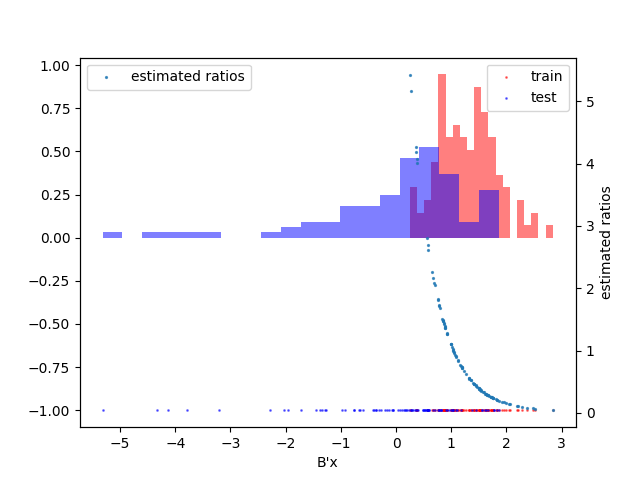

('train_loss: 868598063383.75',)
('test_loss: 8335155391945.13',)


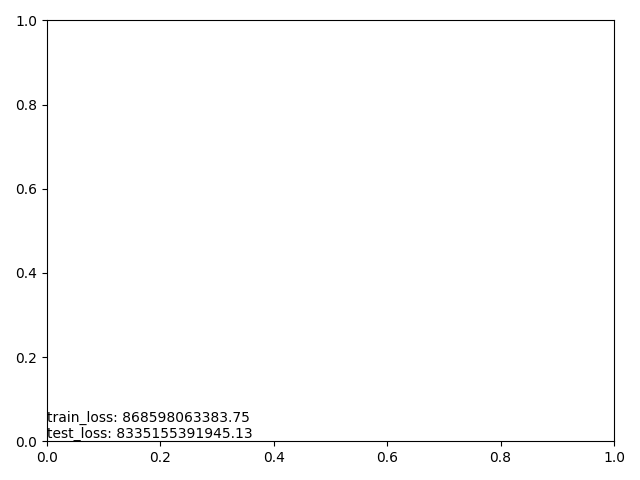

b_norm: 1.0


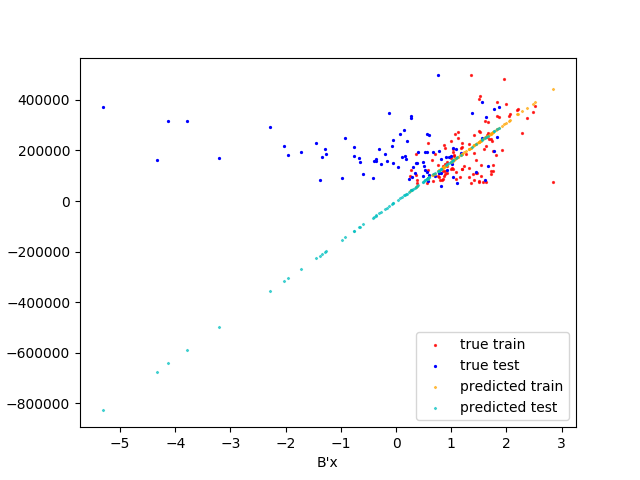

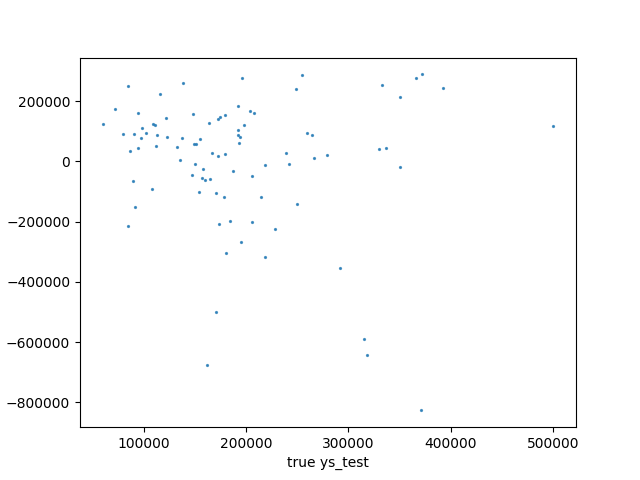

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8335155391945.13',)


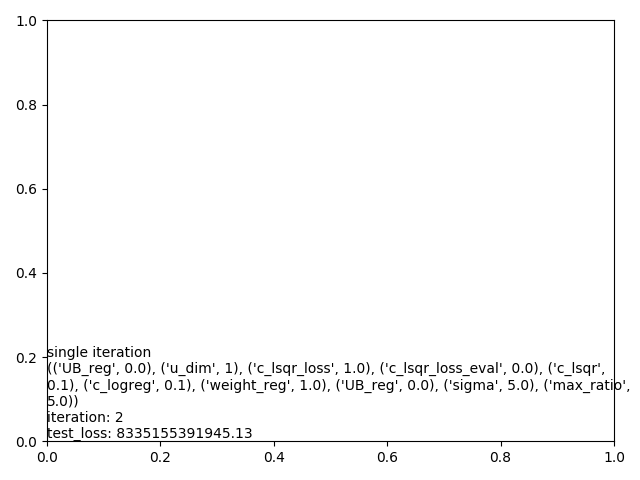

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 1.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('mean loss: 10298634277043.40',)
('std loss: 1896552985006.29',)
('test losses: [12862755733593.688, 9697991705591.3789, 8335155391945.127]',)


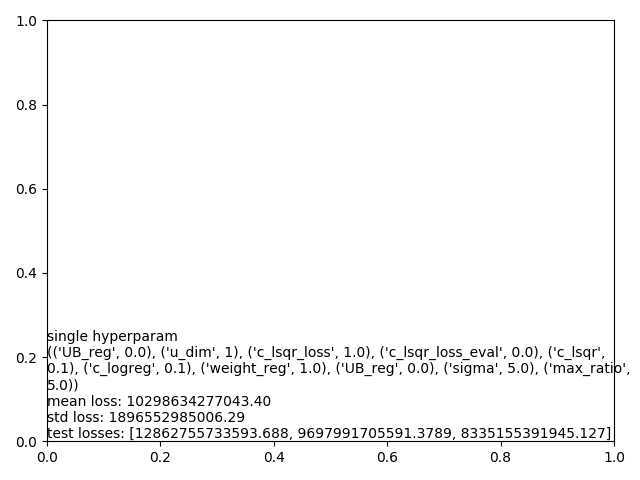

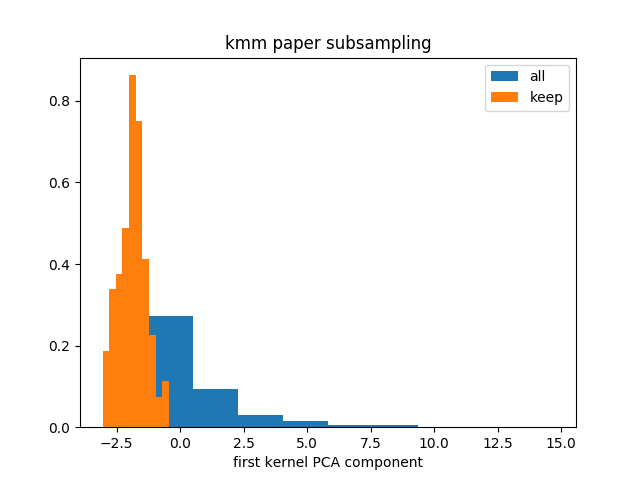

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


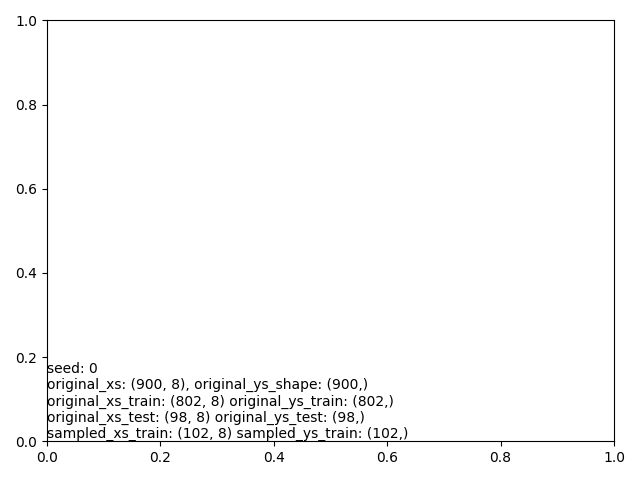

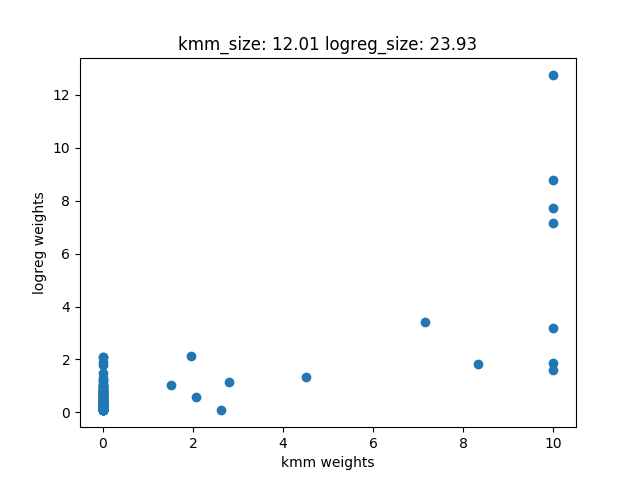

 iter		   cost val	    grad. norm
    1	+4.2779307934496582e+12	7.20702339e+12
    2	+4.2040508312412905e+12	1.11840902e+13
    3	+3.9019899115191055e+12	1.30915723e+13
    4	+3.3891550148239878e+12	6.71640548e+12
    5	+3.3124280498164800e+12	7.01978863e+12
    6	+3.1950976345545703e+12	3.93448337e+12
    7	+3.1835961832466558e+12	3.70473048e+12
    8	+3.1539415575990605e+12	1.36561522e+12
    9	+3.1405742089896880e+12	2.43998911e+12
   10	+3.1358022071912812e+12	2.92610310e+12
   11	+3.1210046596004355e+12	1.68941004e+12
   12	+3.1133564711828491e+12	2.36895888e+12
   13	+3.0997696488442988e+12	1.37980271e+12
   14	+3.0903576544212471e+12	2.46972991e+12
   15	+3.0768390323477051e+12	1.66088960e+12
   16	+3.0680241545624404e+12	2.12057506e+12
   17	+3.0583138000322417e+12	2.02133832e+12
   18	+3.0506351803432256e+12	2.55882433e+12
   19	+3.0352037239687217e+12	1.19995960e+12
   20	+3.0226129652887451e+12	4.96430629e+12
   21	+2.9866778928865469e+12	2.26176276e+12
   22	+2.974816971133

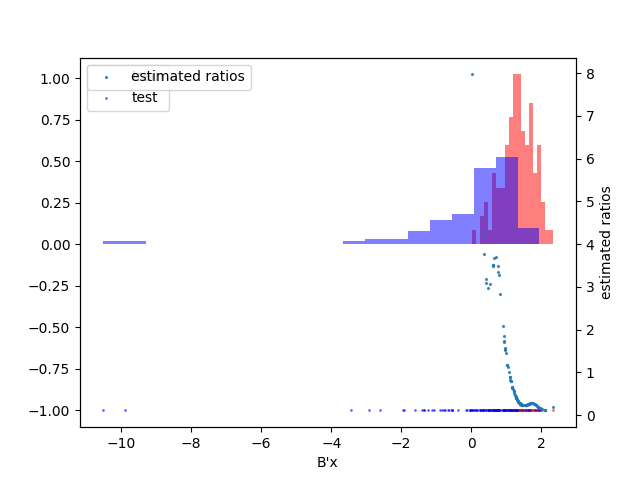

('train_loss: 1036922163188.85',)
('test_loss: 11367555163847.38',)


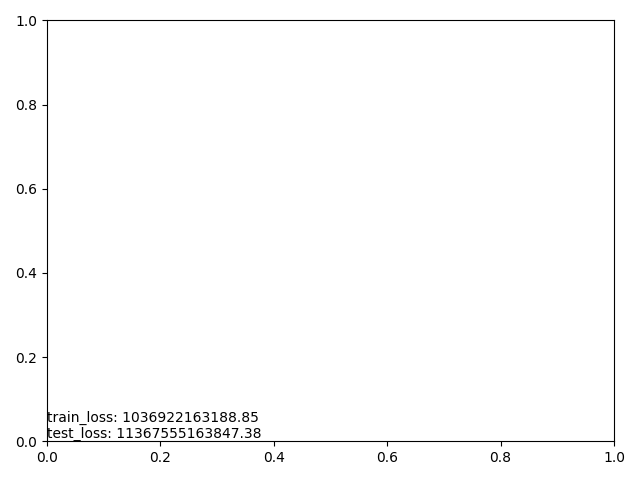

b_norm: 1.0


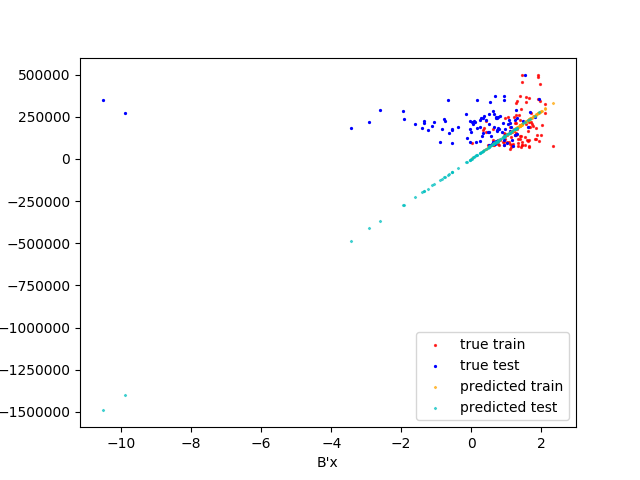

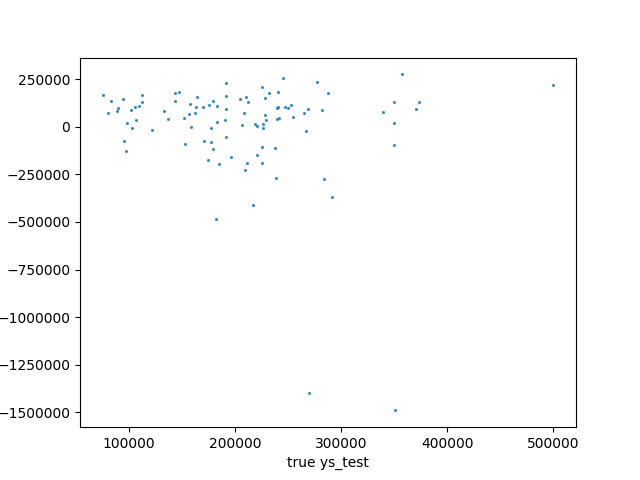

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 11367555163847.38',)


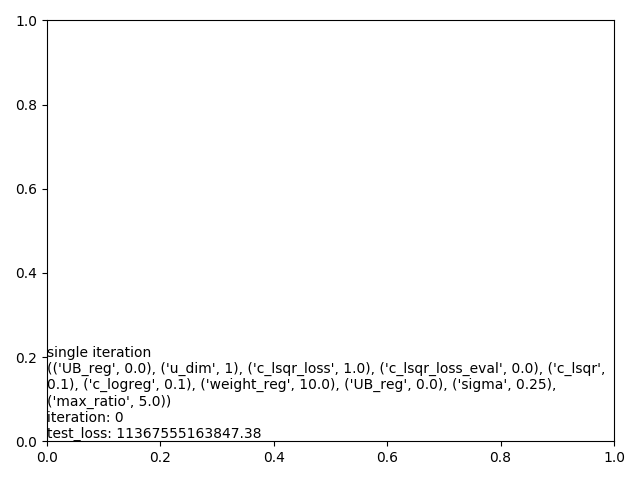

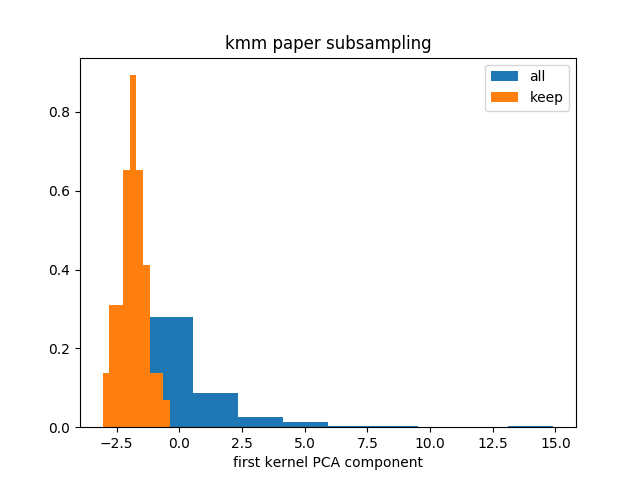

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


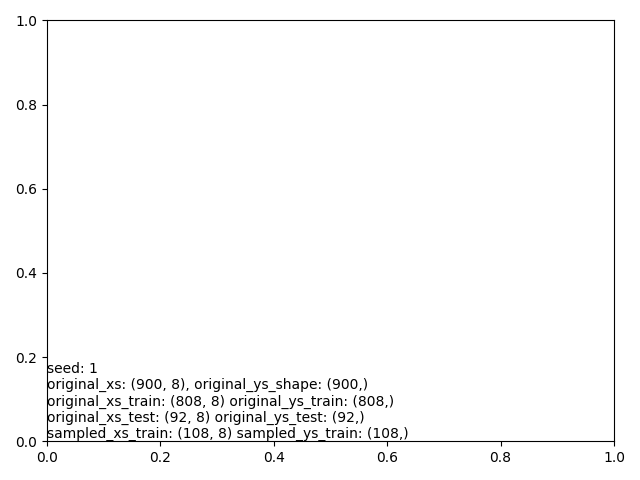

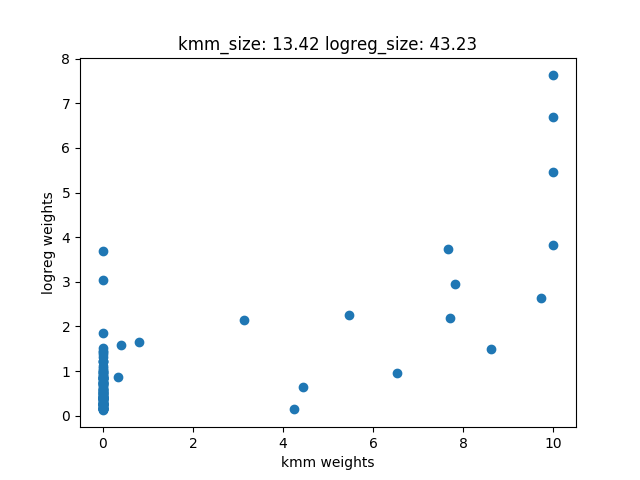

 iter		   cost val	    grad. norm
    1	+6.4145562570275723e+12	8.98182326e+12
    2	+2.8141059543775757e+12	1.30750122e+13
    3	+1.5430354661700698e+12	1.72409685e+12
    4	+1.4275878298473445e+12	1.98367273e+12
    5	+1.4161327545189849e+12	1.27670840e+12
    6	+1.4158417242583606e+12	1.62876397e+12
    7	+1.4146545026597913e+12	1.69192235e+12
    8	+1.4095412383766379e+12	1.97843972e+12
    9	+1.3859943427419849e+12	2.24541900e+12
   10	+1.3808428627806792e+12	2.49502206e+12
   11	+1.3655066737987258e+12	1.19461481e+12
   12	+1.3373492843341628e+12	3.67878683e+12
   13	+1.2081933131886921e+12	1.40435228e+12
   14	+1.1368820413516702e+12	2.01087508e+12
   15	+1.0478738064871227e+12	4.93950906e+11
   16	+1.0425212122606022e+12	7.48479652e+11
   17	+1.0407536366285879e+12	5.69402190e+11
   18	+1.0381086005952534e+12	5.45553113e+11
   19	+1.0369983429331625e+12	4.53504925e+11
   20	+1.0354340435272839e+12	4.85449217e+11
   21	+1.0340887793753783e+12	3.33871927e+11
   22	+1.033254167345

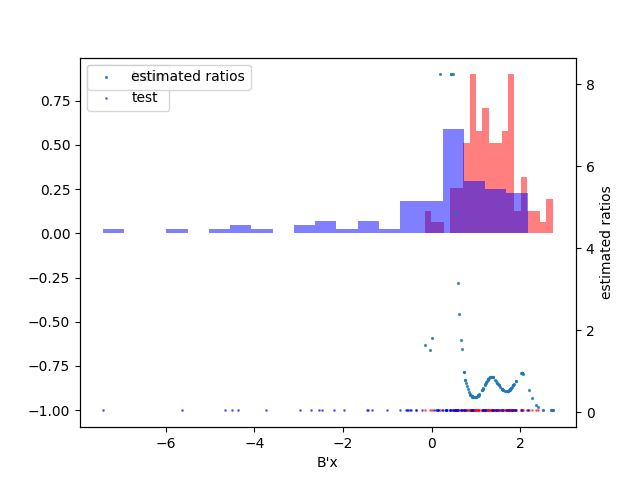

('train_loss: 1051753054636.44',)
('test_loss: 10112846912219.43',)


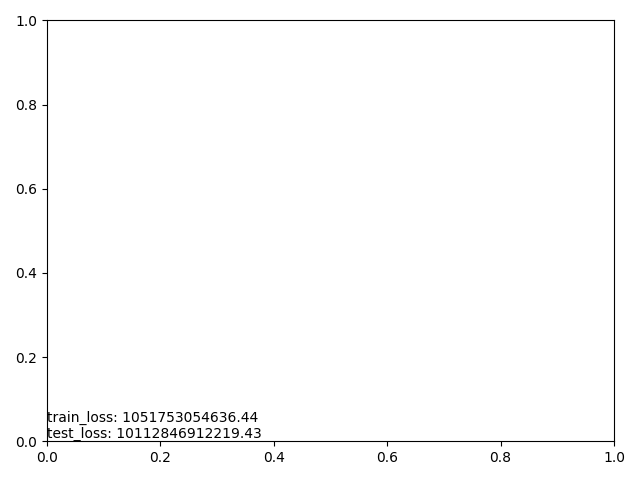

b_norm: 1.0


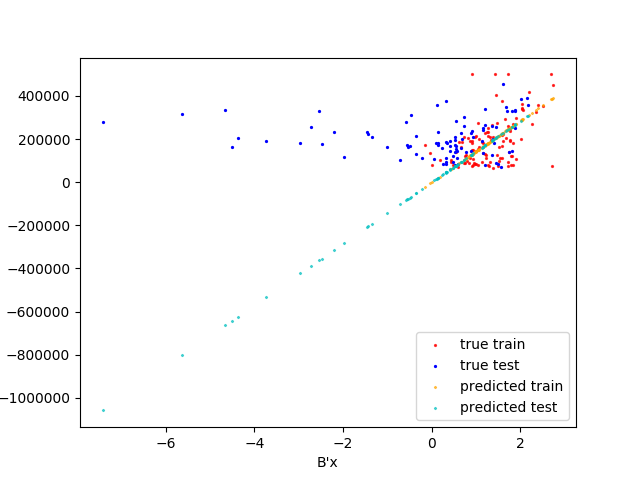

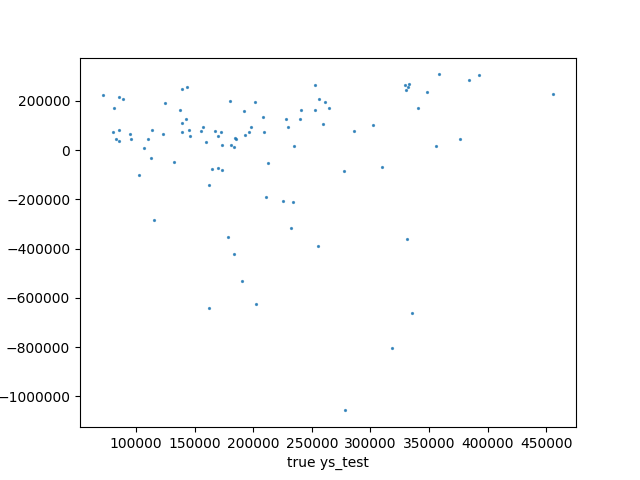

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 10112846912219.43',)


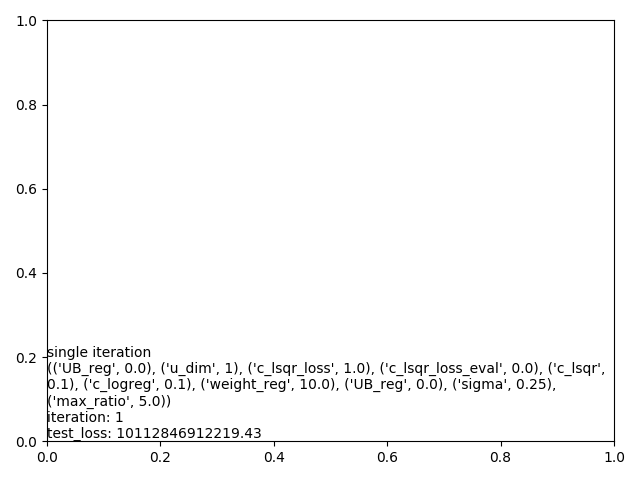

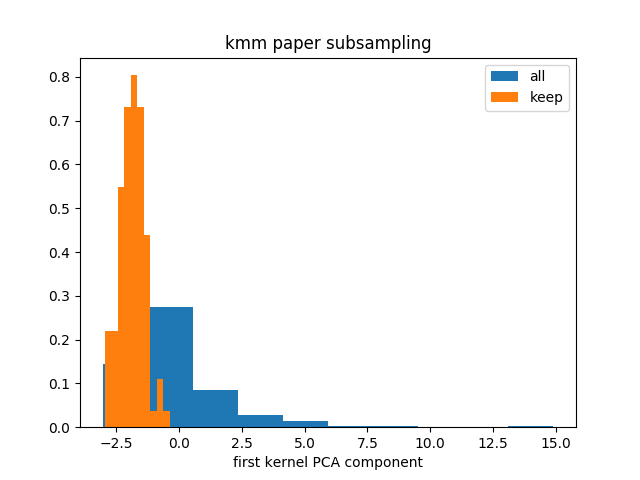

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


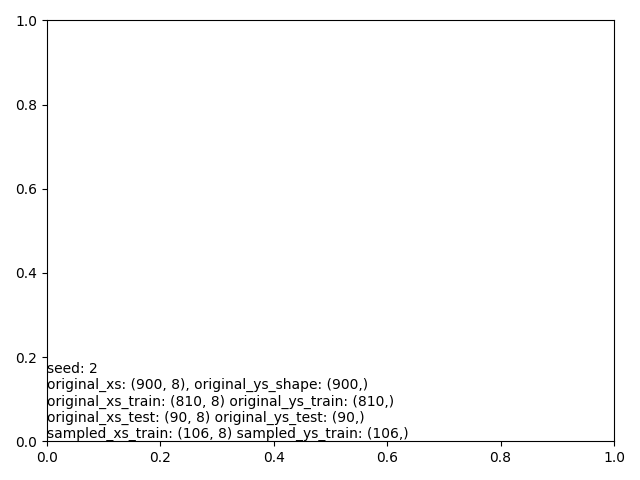

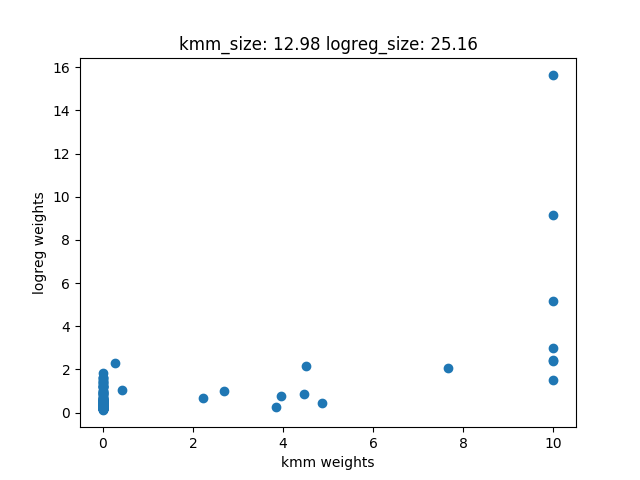

 iter		   cost val	    grad. norm
    1	+5.3823164792004316e+12	7.06826585e+12
    2	+3.1405554415906714e+12	4.51579051e+12
    3	+1.1779044297982583e+12	3.87715780e+12
    4	+7.4719367639470105e+11	1.78582533e+12
    5	+6.7946552278861377e+11	1.31532882e+12
    6	+6.0495068009178235e+11	6.62289733e+11
    7	+5.8729853048999109e+11	4.03184992e+11
    8	+5.8235436714678516e+11	4.78634699e+11
    9	+5.7554497217862439e+11	4.75696308e+11
   10	+5.6948271215827100e+11	3.54699095e+11
   11	+5.6596423544498938e+11	4.88008718e+11
   12	+5.6208758920535437e+11	3.80495413e+11
   13	+5.5910095002125391e+11	2.66046126e+11
   14	+5.5796183332752441e+11	3.56923639e+11
   15	+5.5544983027600879e+11	1.41628873e+11
   16	+5.5207666496740149e+11	4.10732625e+11
   17	+5.4908813713199213e+11	1.17523733e+11
   18	+5.4906148788622522e+11	2.28397645e+11
   19	+5.4895770080166180e+11	2.15774396e+11
   20	+5.4859275870028711e+11	1.64339793e+11
   21	+5.4815129570692517e+11	1.34836083e+11
   22	+5.477745629637

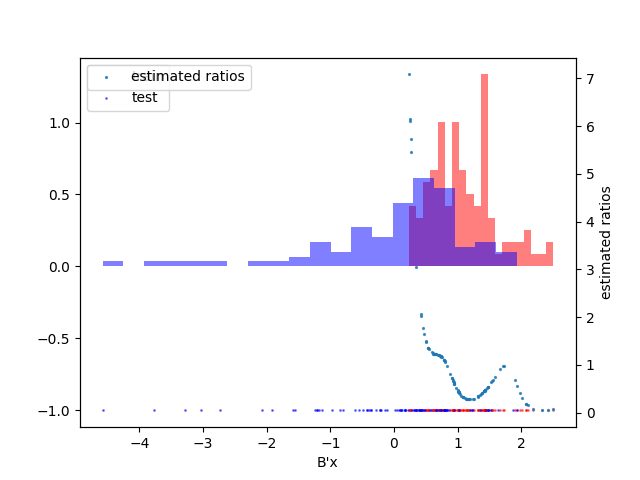

('train_loss: 858641622367.05',)
('test_loss: 8371613152919.80',)


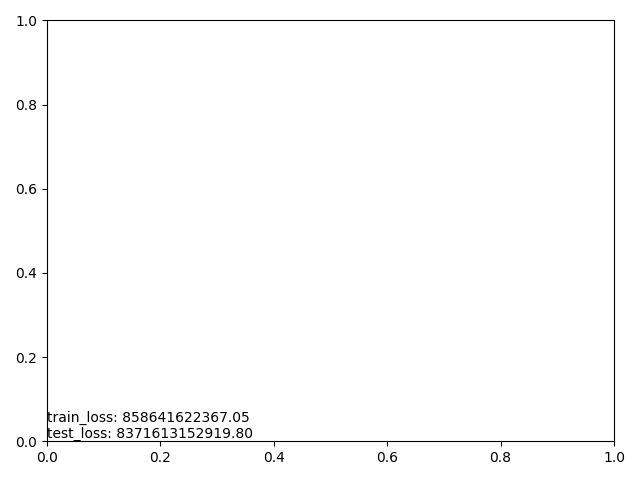

b_norm: 1.0


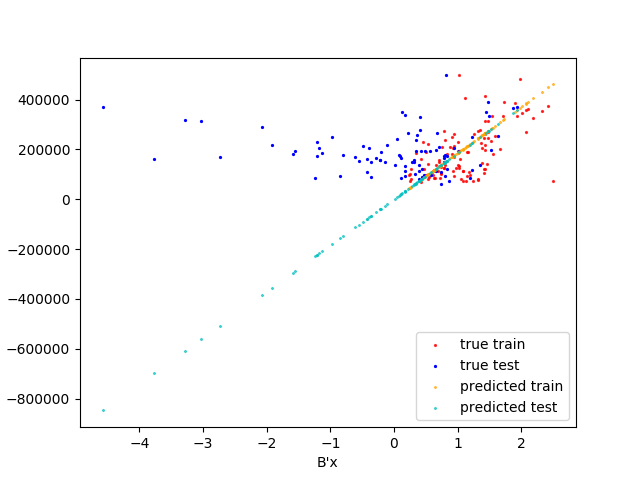

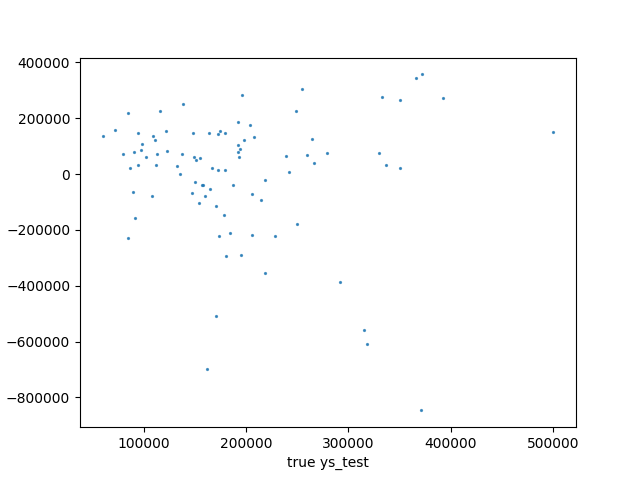

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8371613152919.80',)


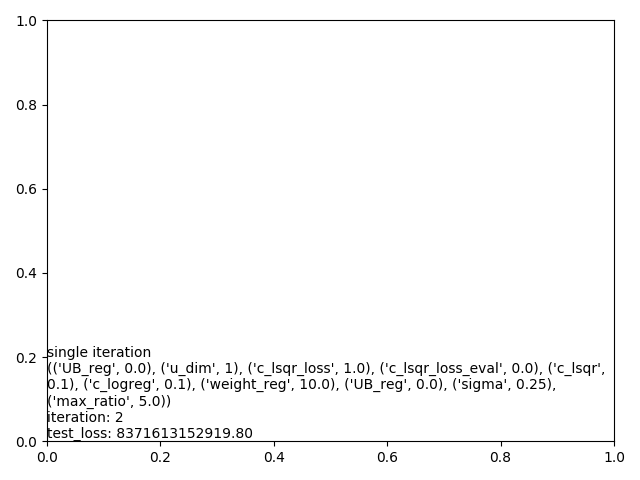

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('mean loss: 9950671742995.54',)
('std loss: 1228452338607.35',)
('test losses: [11367555163847.377, 10112846912219.43, 8371613152919.8047]',)


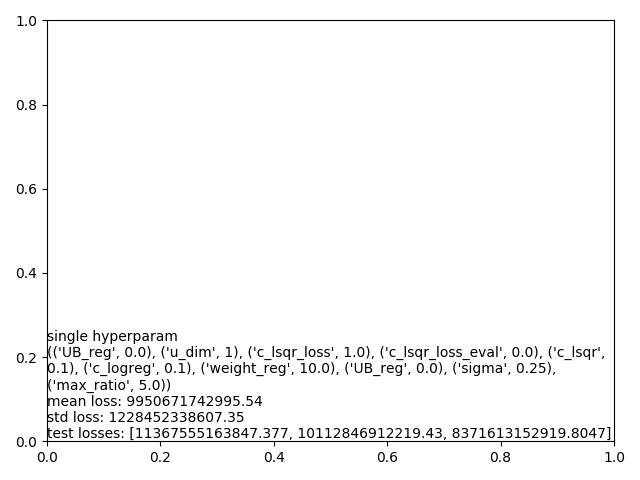

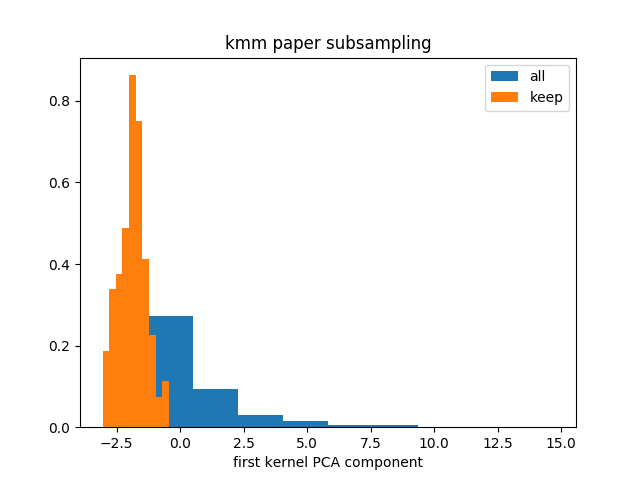

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


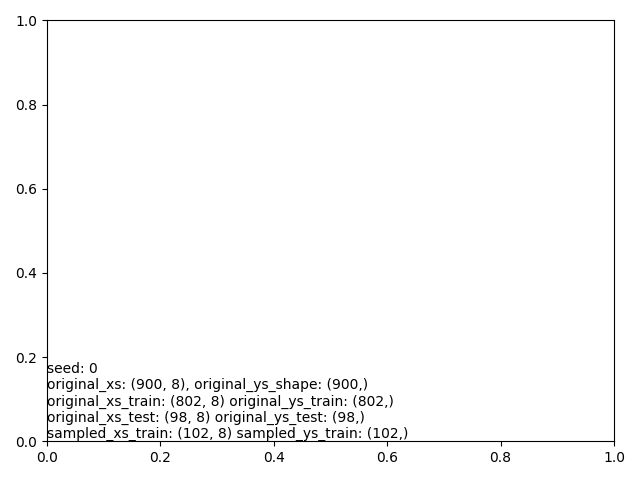

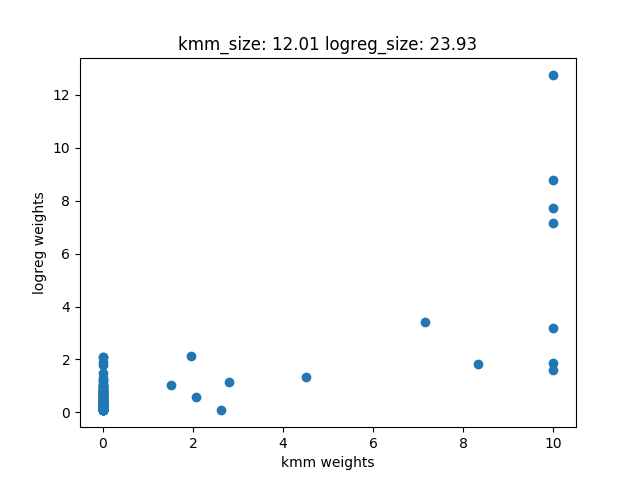

 iter		   cost val	    grad. norm
    1	+5.9251986715173672e+12	1.60327741e+13
    2	+1.3102768045720430e+12	2.91785472e+12
    3	+1.0612339582992485e+12	1.91089593e+12
    4	+9.3108769851867444e+11	1.01312129e+12
    5	+7.8537456785066675e+11	2.89443274e+11
    6	+7.7650046661438794e+11	3.34168922e+11
    7	+7.6859429733161914e+11	1.94624891e+11
    8	+7.6756290247975940e+11	4.13313402e+11
    9	+7.6389211532307690e+11	3.23909046e+11
   10	+7.5771662337792017e+11	1.70834963e+11
   11	+7.5623081634924475e+11	3.78240820e+11
   12	+7.5139069398339661e+11	2.43779793e+11
   13	+7.4733894359447864e+11	1.84141935e+11
   14	+7.4405896950338806e+11	2.27008532e+11
   15	+7.4235427394643640e+11	3.31491346e+11
   16	+7.3738772543495422e+11	1.71534176e+11
   17	+7.3438754689367920e+11	3.14180358e+11
   18	+7.2886924513418872e+11	1.69232949e+11
   19	+7.2594387109874854e+11	3.68605889e+11
   20	+7.1927462360030566e+11	1.44487209e+11
   21	+6.9292087652495166e+11	2.52453994e+11
   22	+6.898458690524

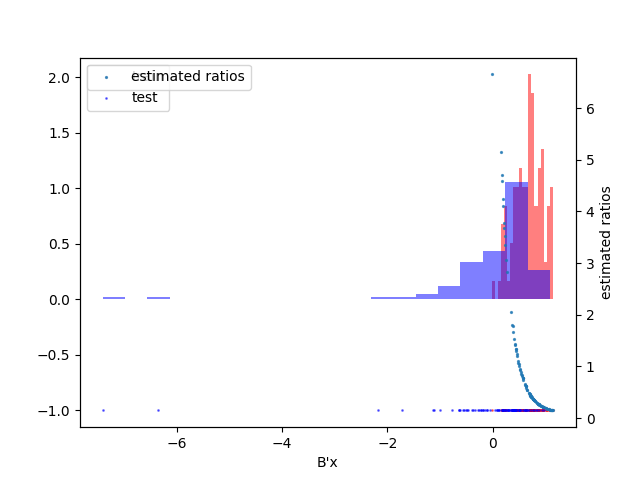

('train_loss: 982745530883.62',)
('test_loss: 15526255529205.01',)


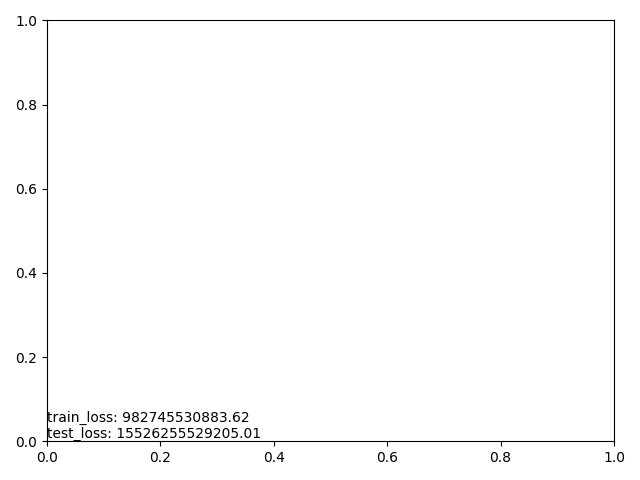

b_norm: 1.0


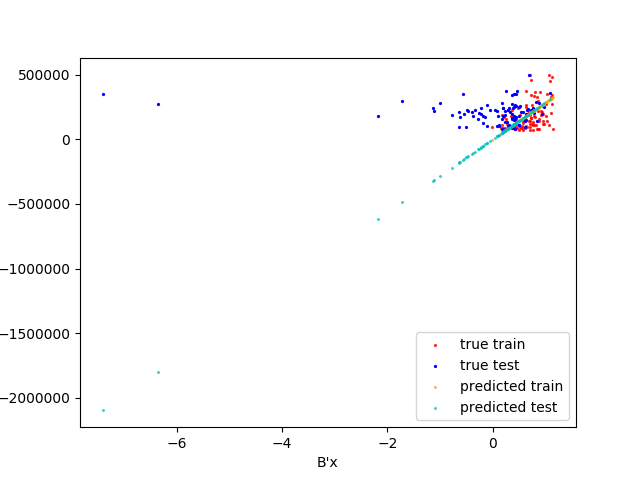

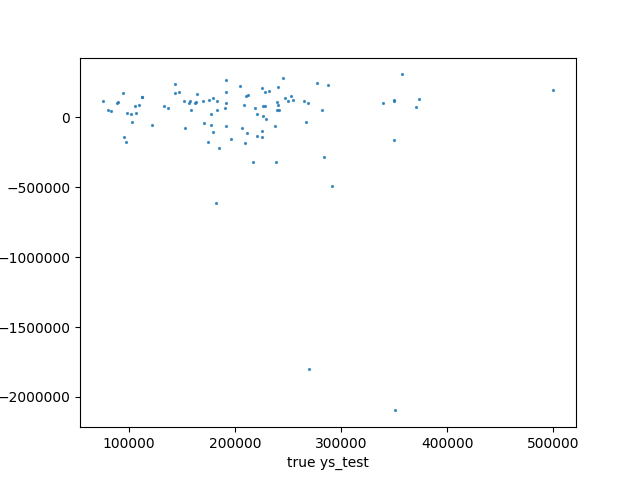

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 15526255529205.01',)


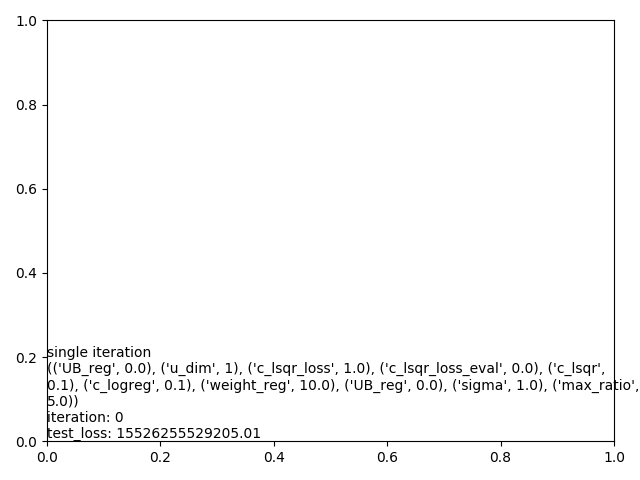

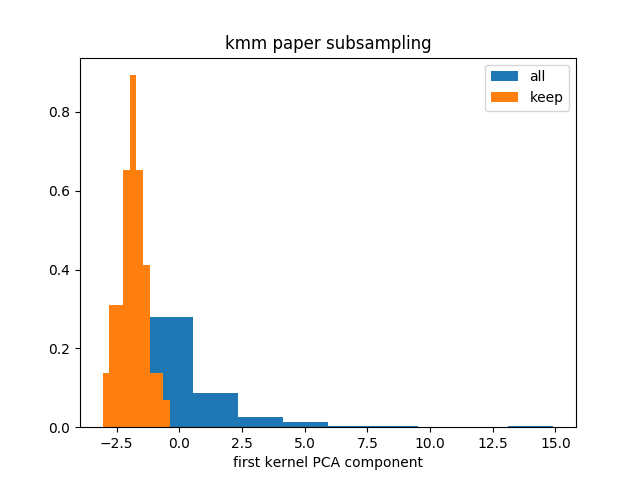

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


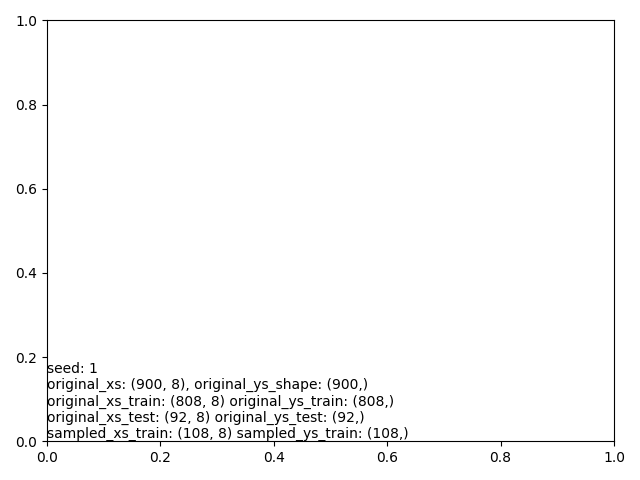

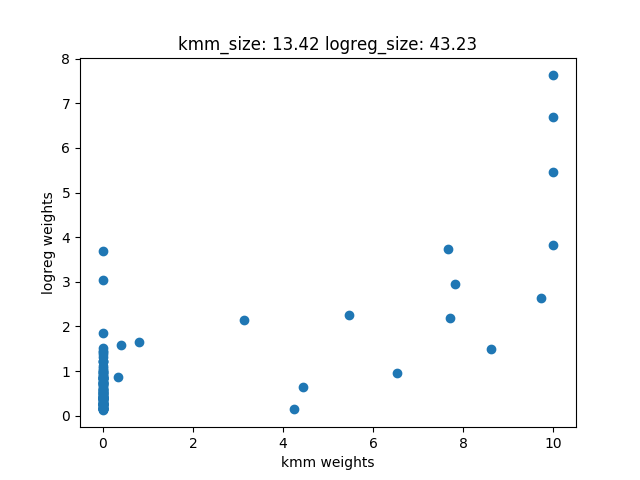

 iter		   cost val	    grad. norm
    1	+6.4422602270927588e+12	8.58688179e+12
    2	+2.4724112544976040e+12	5.79157716e+12
    3	+1.9568635633729087e+12	4.95603930e+12
    4	+1.0925081922175610e+12	1.34105866e+12
    5	+9.4654598383380103e+11	5.89441894e+11
    6	+9.3187288241130505e+11	6.22444627e+11
    7	+9.2778755052040674e+11	4.86209930e+11
    8	+9.1531504959018213e+11	2.87587231e+11
    9	+9.1329020535158960e+11	6.61909794e+11
   10	+9.0964450670120691e+11	2.61825515e+11
   11	+9.0924103289033484e+11	2.73794770e+11
   12	+9.0780100706363208e+11	2.17123421e+11
   13	+9.0747284859030286e+11	2.20890758e+11
   14	+9.0735948130243262e+11	2.13778718e+11
   15	+9.0701999537882935e+11	2.14150897e+11
   16	+9.0698365350601770e+11	2.02439906e+11
   17	+9.0690893704745093e+11	2.13338062e+11
   18	+9.0689237776116602e+11	2.02230276e+11
   19	+9.0682657372064221e+11	1.99602853e+11
   20	+9.0681260641953381e+11	2.12766082e+11
   21	+9.0678050763982654e+11	1.99056781e+11
   22	+9.067693382232

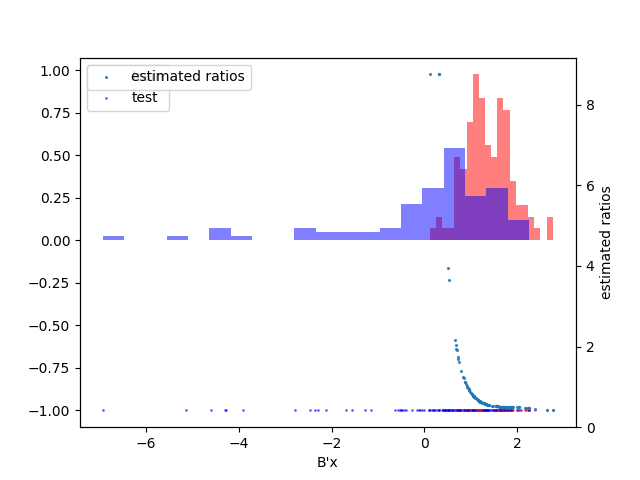

('train_loss: 1082506496581.31',)
('test_loss: 9746959110013.25',)


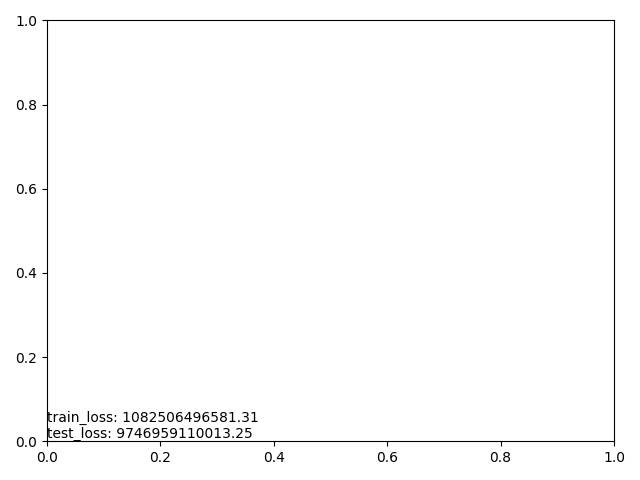

b_norm: 1.0


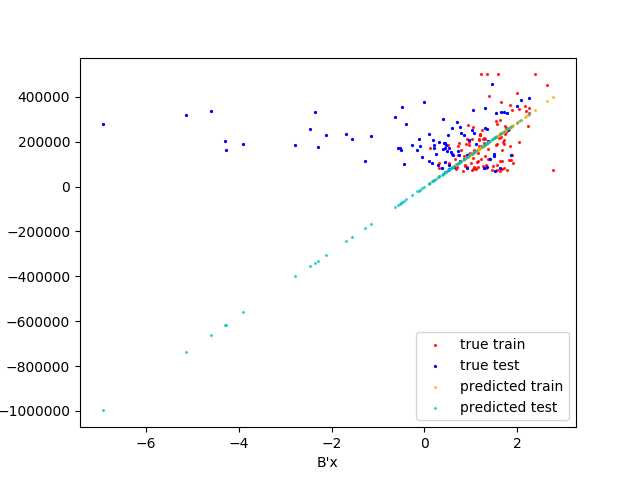

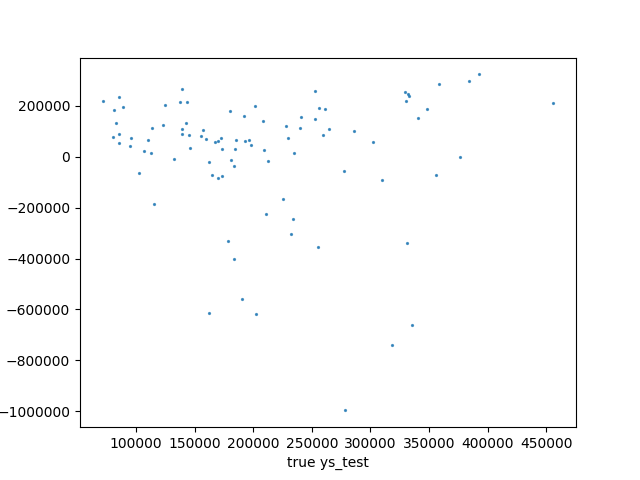

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9746959110013.25',)


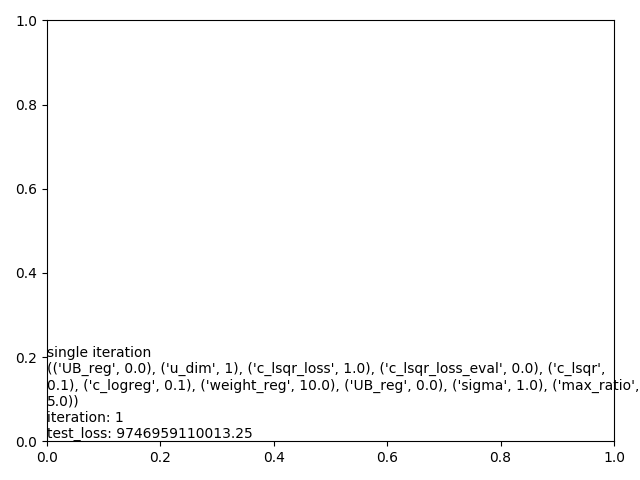

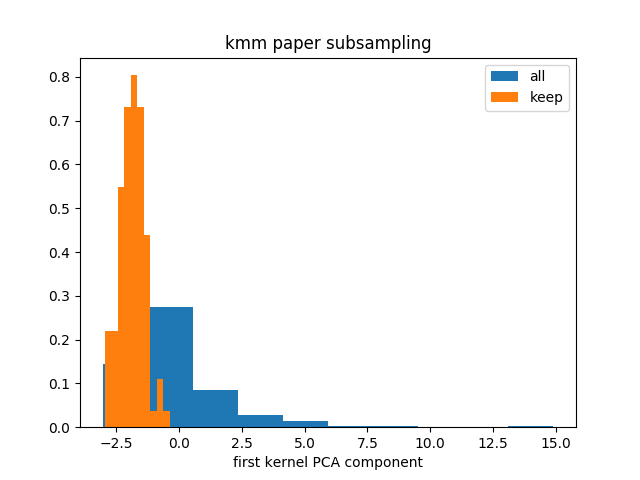

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


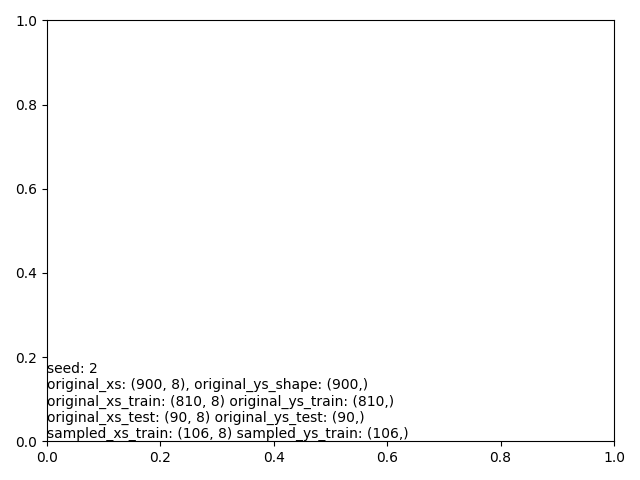

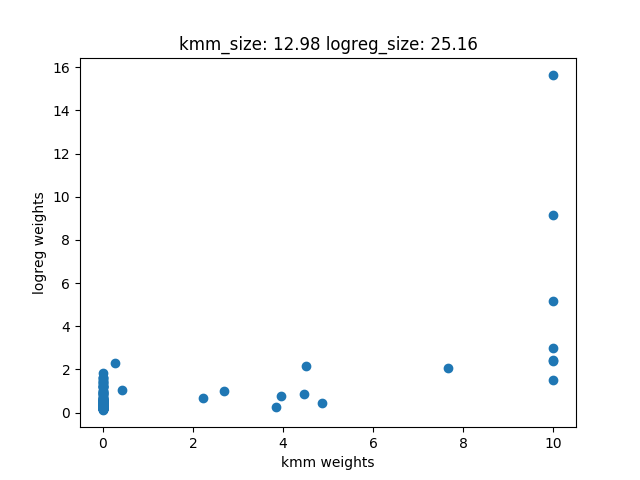

 iter		   cost val	    grad. norm
    1	+5.6578150916777666e+12	1.33426540e+12
    2	+5.6241702200825605e+12	5.60197212e+12
    3	+5.4858660757442051e+12	5.92125882e+12
    4	+4.9336864777330820e+12	6.89863542e+12
    5	+2.8095111075821978e+12	8.99700006e+12
    6	+9.6268733163637500e+11	2.14990209e+12
    7	+8.3374075682842725e+11	3.22814478e+12
    8	+6.3779740165738562e+11	3.19460869e+11
    9	+6.3454052023040491e+11	4.02834297e+11
   10	+6.2787146456529236e+11	1.72430625e+11
   11	+6.2550403458809644e+11	2.40592746e+11
   12	+6.2461658056927820e+11	3.01215744e+11
   13	+6.2189980577587366e+11	1.68177525e+11
   14	+6.2091967319551331e+11	2.60075248e+11
   15	+6.1845678576669910e+11	1.08576827e+11
   16	+6.1323628119483826e+11	3.23956007e+11
   17	+6.0964023721530481e+11	1.67831212e+11
   18	+6.0848438824766382e+11	1.56392097e+11
   19	+6.0823155870124048e+11	2.54174932e+11
   20	+6.0733013464990027e+11	2.00117833e+11
   21	+6.0573742273808838e+11	1.09672697e+11
   22	+6.049371623625

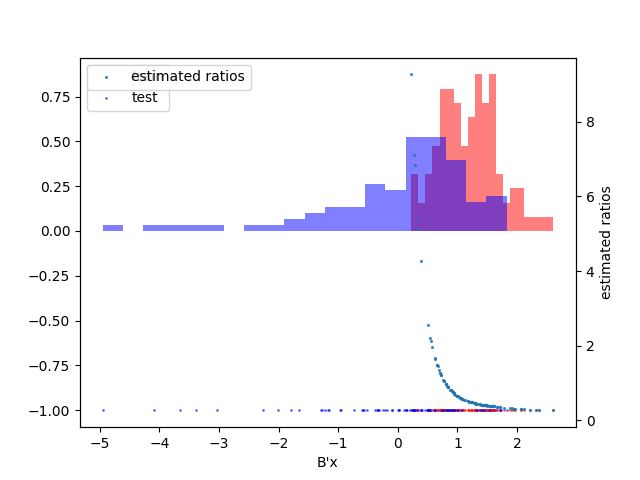

('train_loss: 837583072000.02',)
('test_loss: 8202715881001.34',)


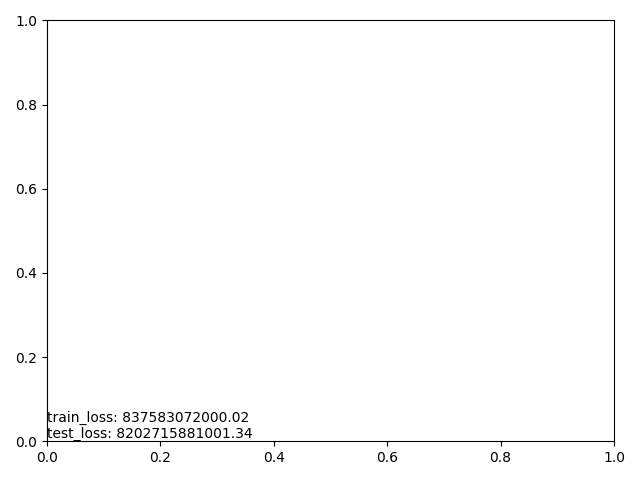

b_norm: 1.0


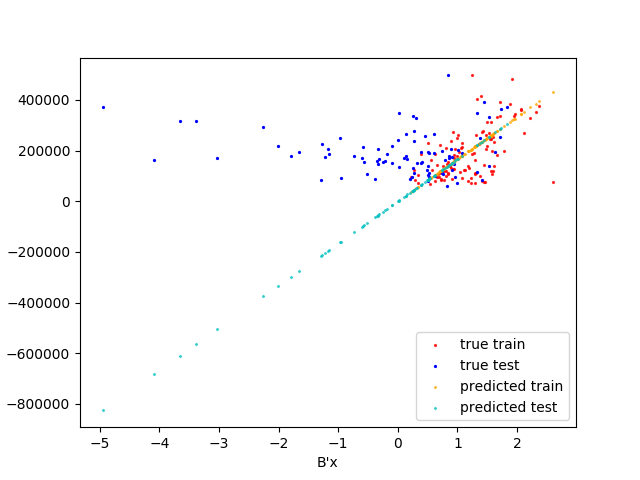

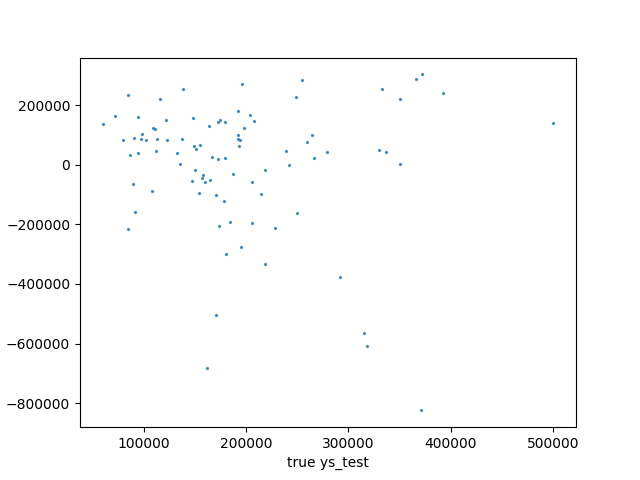

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8202715881001.34',)


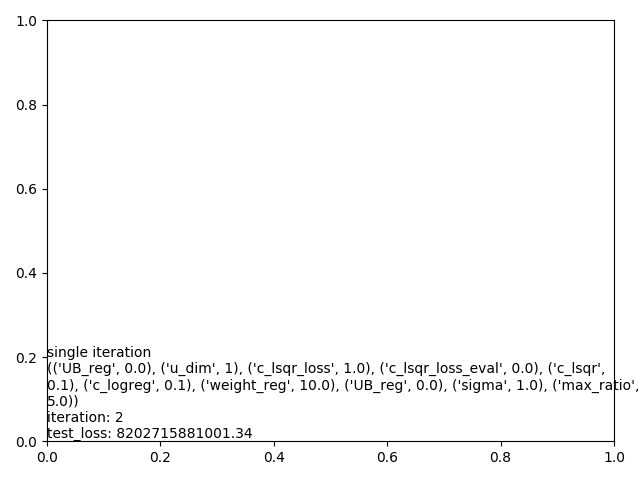

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('mean loss: 11158643506739.87',)
('std loss: 3152057304013.13',)
('test losses: [15526255529205.01, 9746959110013.252, 8202715881001.3418]',)


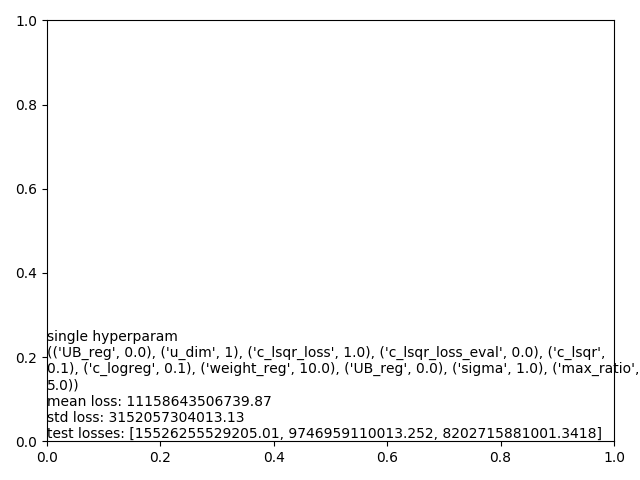

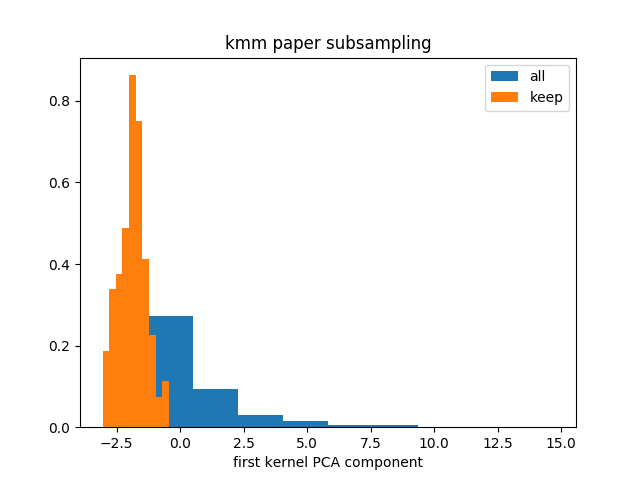

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


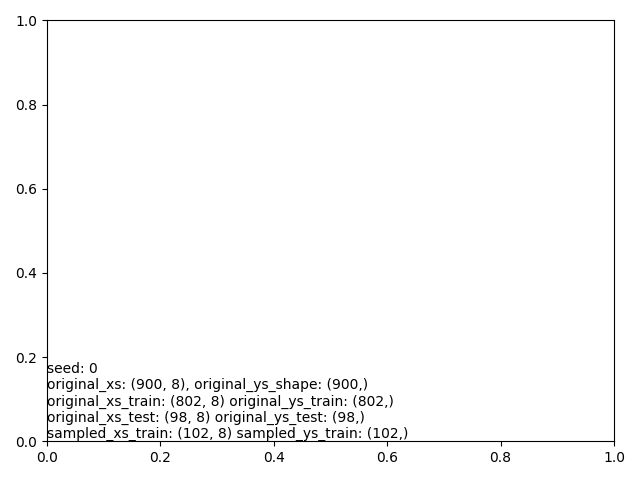

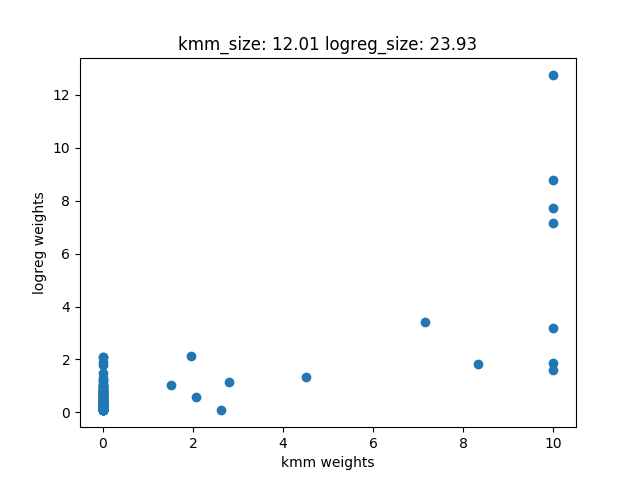

 iter		   cost val	    grad. norm
    1	+4.7382110473432617e+12	1.32548978e+13
    2	+8.8912006461802905e+11	1.36805850e+12
    3	+8.8641801292855347e+11	5.51588361e+11
    4	+8.7610105918880249e+11	5.03996578e+11
    5	+8.4174804808896387e+11	3.84480729e+11
    6	+7.3959120708106213e+11	2.22809799e+11
    7	+7.3123355946547327e+11	2.89054646e+11
    8	+7.3046686523781360e+11	4.26402409e+11
    9	+7.2756976776640271e+11	3.79606362e+11
   10	+7.1901473587026453e+11	1.99795306e+11
   11	+7.1410117817479028e+11	3.05932467e+11
   12	+7.0802259211716943e+11	2.71396745e+11
   13	+7.0325046407265027e+11	2.03366844e+11
   14	+7.0028476969044519e+11	2.53873362e+11
   15	+6.9732583338360632e+11	2.58027356e+11
   16	+6.9477091316128467e+11	2.62778477e+11
   17	+6.9150418334243591e+11	2.08668494e+11
   18	+6.8903038613359631e+11	1.82098529e+11
   19	+6.8683258012558276e+11	1.64786964e+11
   20	+6.8489707356764722e+11	1.69143629e+11
   21	+6.8303072598259082e+11	1.45946635e+11
   22	+6.813795687568

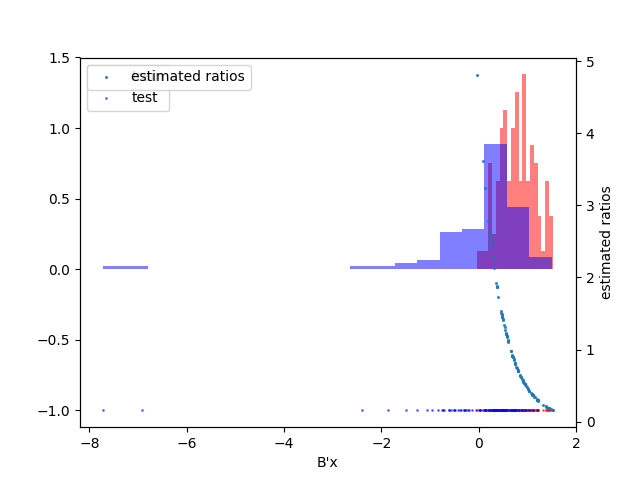

('train_loss: 801592272144.62',)
('test_loss: 12905775408884.87',)


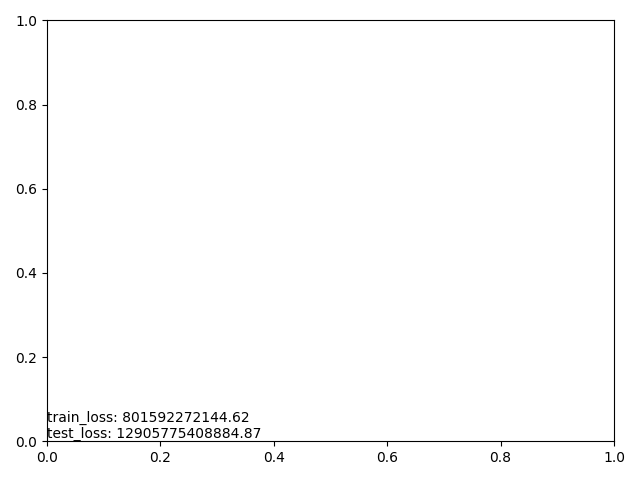

b_norm: 1.0


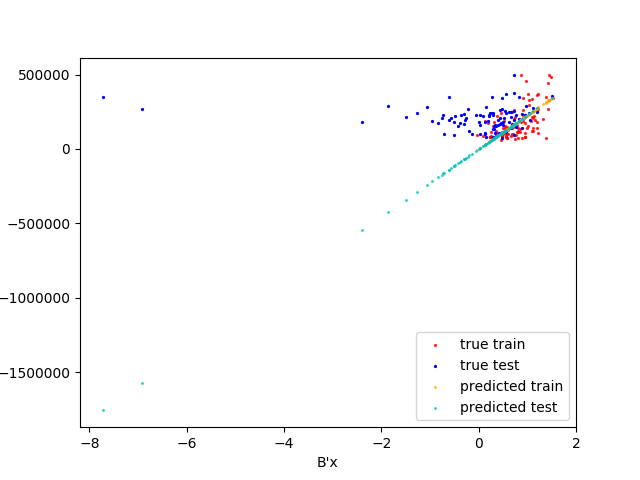

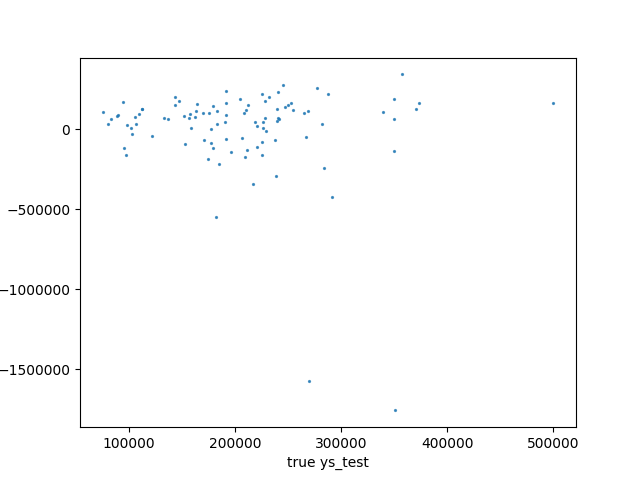

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 12905775408884.87',)


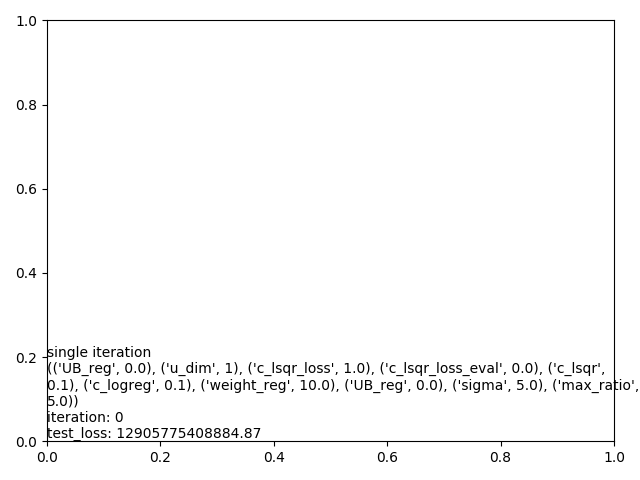

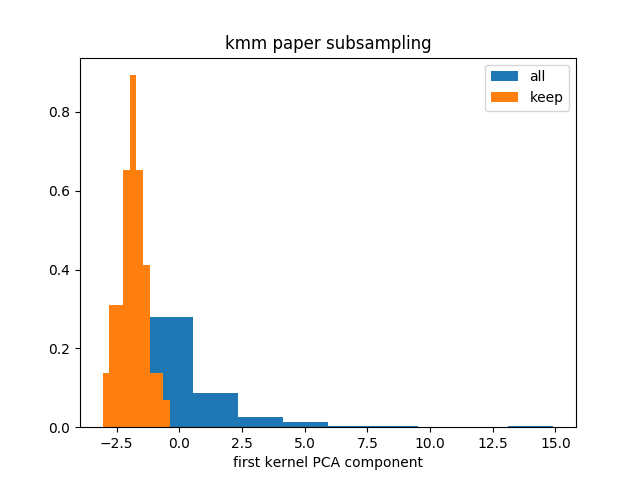

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


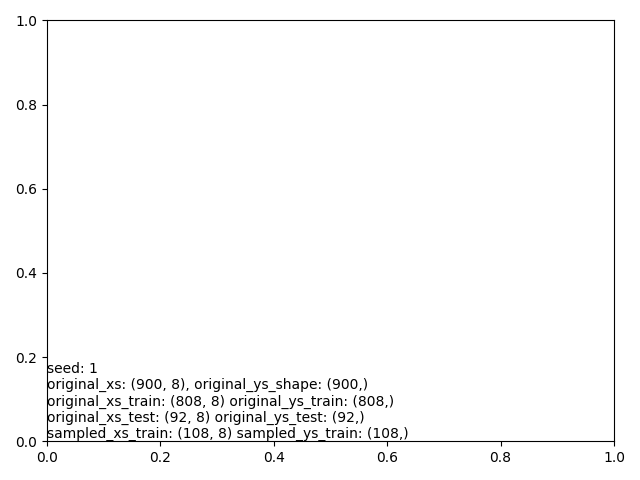

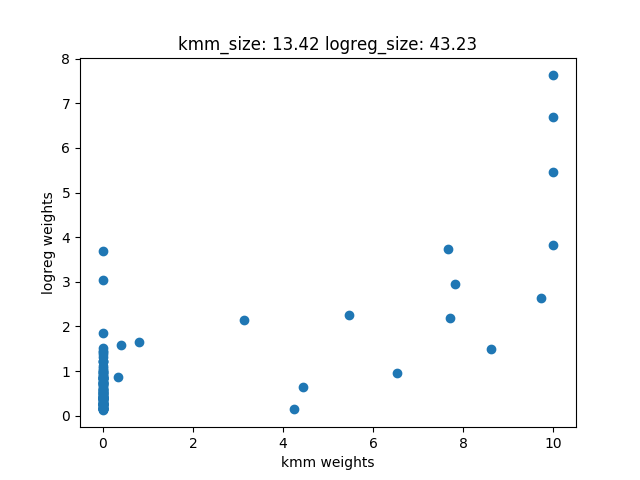

 iter		   cost val	    grad. norm
    1	+5.9881739328582686e+12	9.65639138e+12
    2	+2.7399267449438193e+12	6.67342220e+12
    3	+1.9256791142965010e+12	2.81654946e+12
    4	+1.4948782425322334e+12	2.87055379e+12
    5	+1.0617405064048541e+12	2.26456496e+12
    6	+1.0537241262999591e+12	1.67087214e+12
    7	+1.0229109192493079e+12	1.54093815e+12
    8	+9.2207226965531201e+11	9.80380262e+11
    9	+9.1000765381674231e+11	1.22569281e+12
   10	+8.7232135217580151e+11	7.07730085e+11
   11	+8.5615670932450781e+11	5.18981618e+11
   12	+8.3943206985318982e+11	2.63973772e+11
   13	+8.2738751605955530e+11	5.66706550e+11
   14	+8.1499038257997534e+11	4.51830703e+11
   15	+8.0610917192370850e+11	2.85302073e+11
   16	+8.0254752329008044e+11	4.30552969e+11
   17	+7.9462408016050122e+11	1.69254203e+11
   18	+7.7331899072284802e+11	2.29981809e+11
   19	+7.7211381234455554e+11	1.73805887e+11
   20	+7.7107660632906152e+11	9.06684972e+10
   21	+7.7104719303442297e+11	2.11073406e+11
   22	+7.709319992880

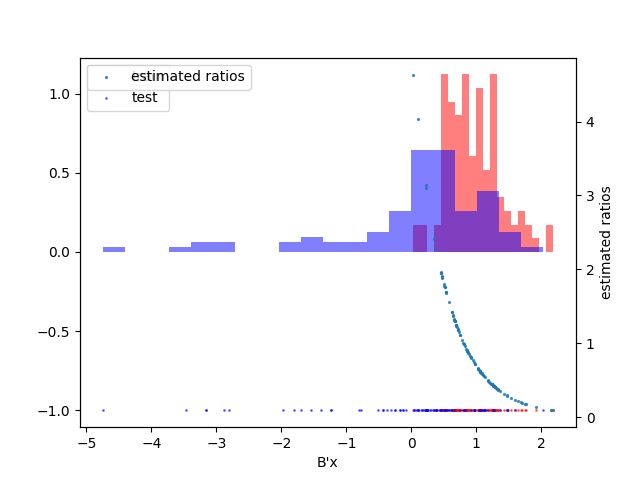

('train_loss: 1020793056268.96',)
('test_loss: 9695832831635.43',)


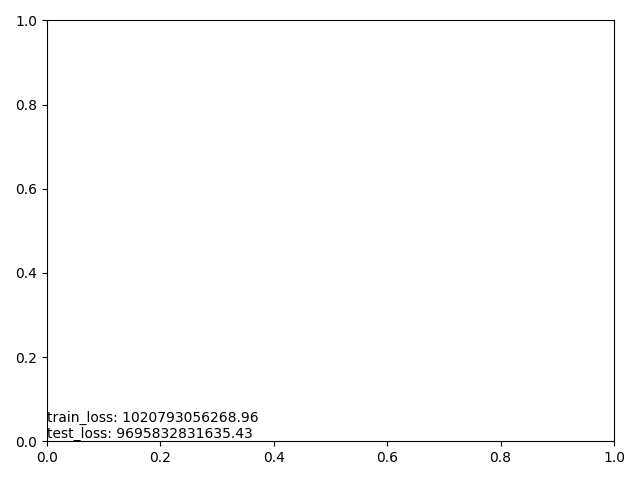

b_norm: 1.0


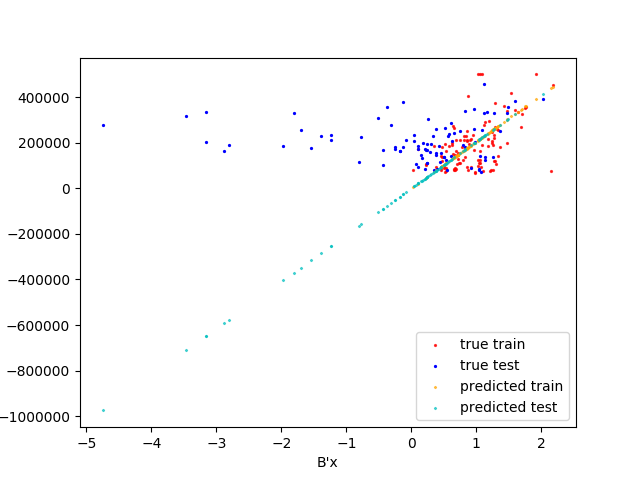

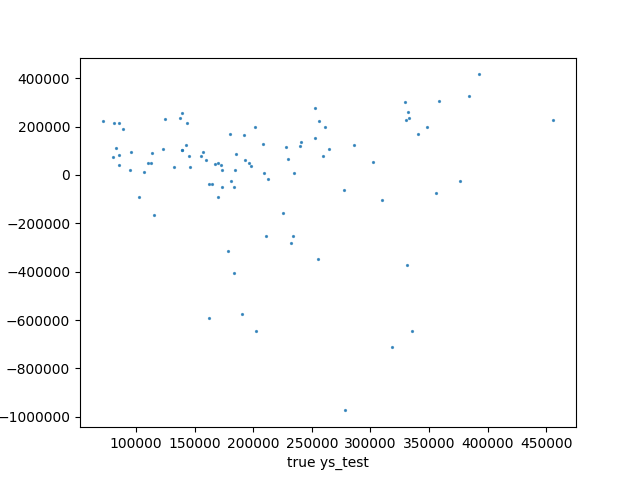

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9695832831635.43',)


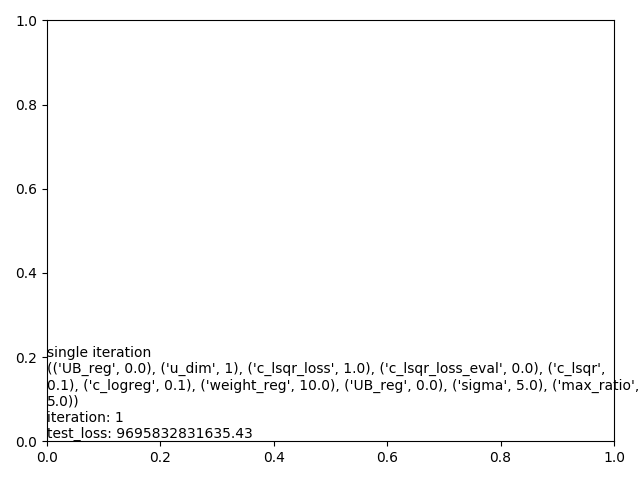

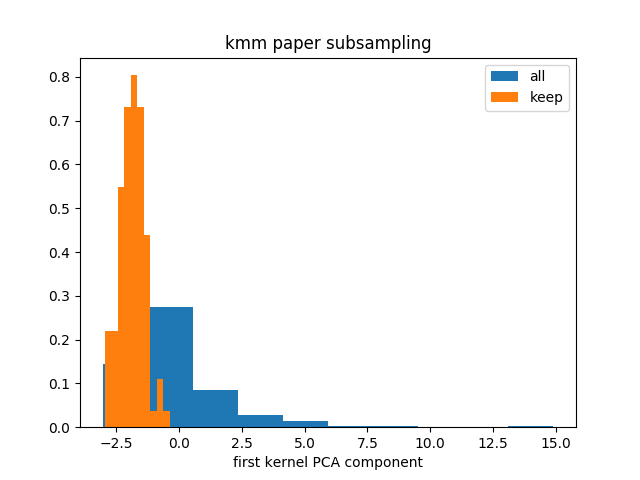

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


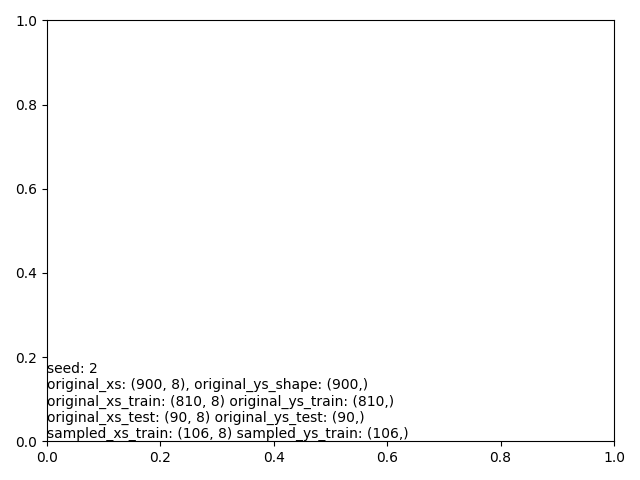

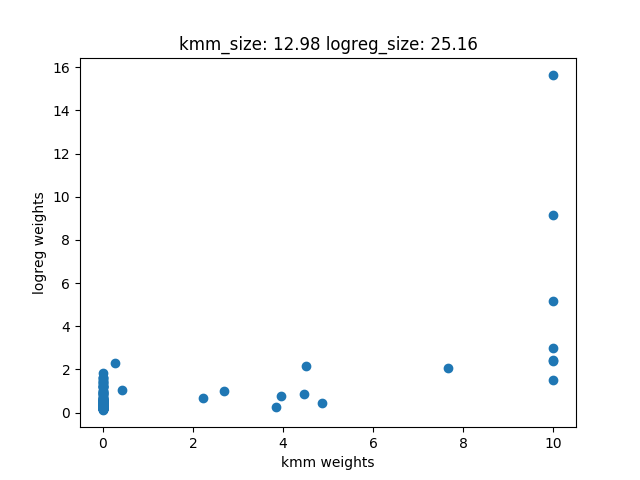

 iter		   cost val	    grad. norm
    1	+5.8141068688751553e+12	3.40776276e+12
    2	+3.3525335349615811e+12	6.64198603e+12
    3	+8.1445144779656616e+11	1.10066475e+12
    4	+7.7606882473290259e+11	2.27207634e+12
    5	+6.5507889837076355e+11	1.35892296e+12
    6	+5.6121826770734546e+11	2.35195892e+11
    7	+5.5836487224598755e+11	3.82895135e+11
    8	+5.5008824992725793e+11	1.88347626e+11
    9	+5.4948955373576465e+11	3.18033027e+11
   10	+5.4725157496508673e+11	2.76637954e+11
   11	+5.4119417661851318e+11	1.17482155e+11
   12	+5.3821567910339532e+11	1.57832550e+11
   13	+5.3588395119944458e+11	1.17548631e+11
   14	+5.3428966534251831e+11	1.36627277e+11
   15	+5.3356274041255206e+11	1.69767284e+11
   16	+5.3149650383689514e+11	8.06636859e+10
   17	+5.3141188875200464e+11	1.91455107e+11
   18	+5.3108444675164099e+11	1.79011782e+11
   19	+5.2995994422558063e+11	1.29334490e+11
   20	+5.2918590665696027e+11	1.16793253e+11
   21	+5.2817110100787598e+11	7.69868558e+10
   22	+5.279067237338

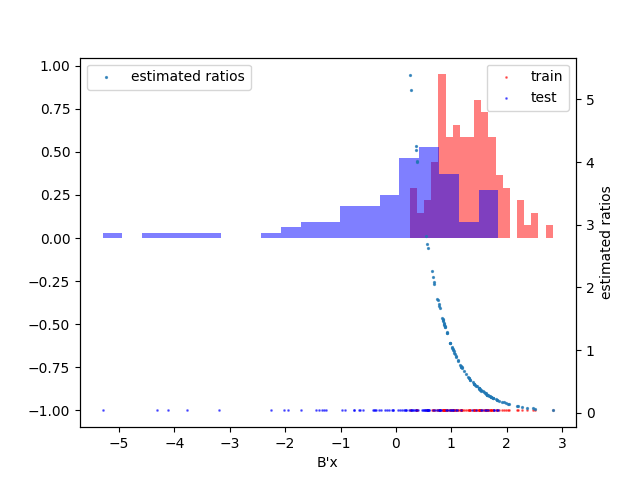

('train_loss: 869136717353.50',)
('test_loss: 8335192346613.41',)


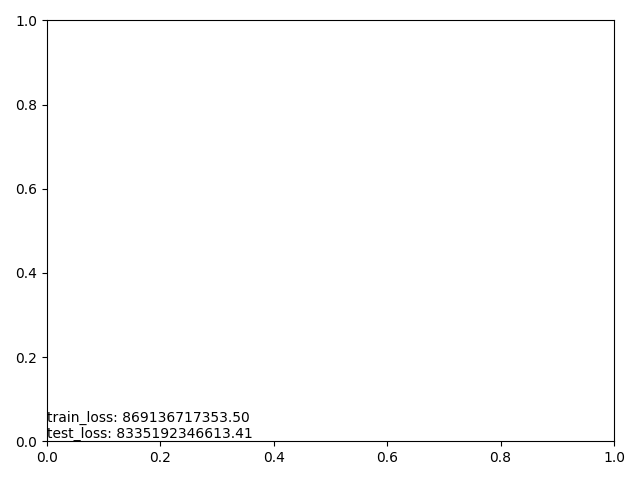

b_norm: 1.0


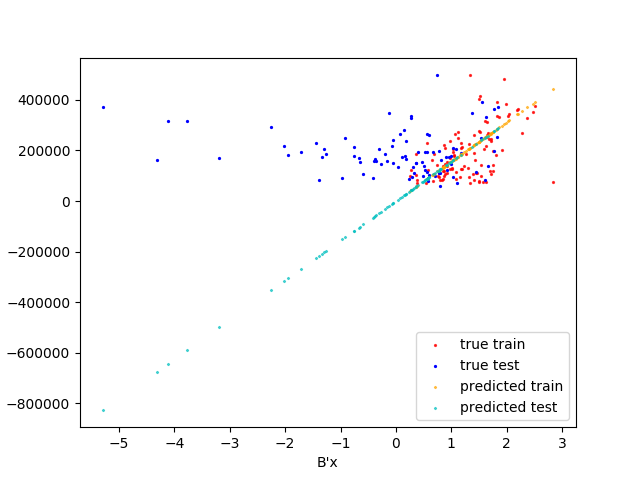

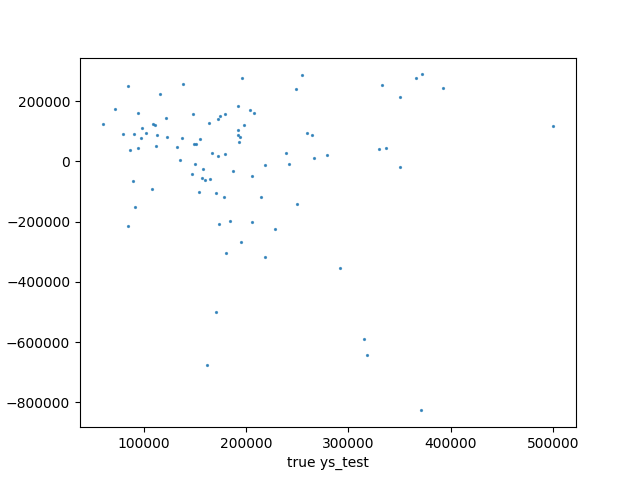

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 8335192346613.41',)


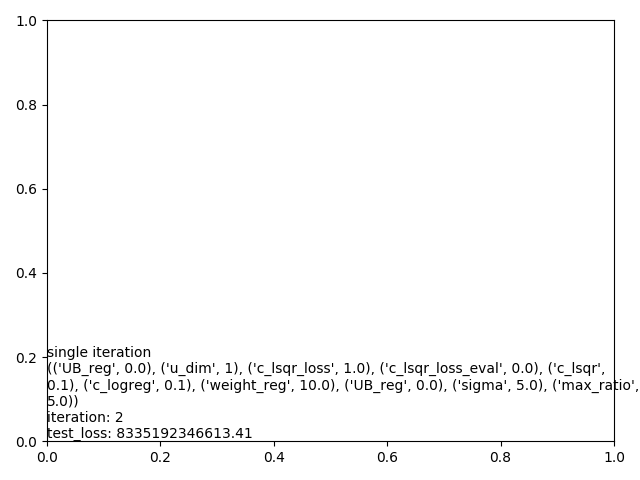

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 0.1), ('weight_reg', 10.0), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('mean loss: 10312266862377.91',)
('std loss: 1916168149889.03',)
('test losses: [12905775408884.873, 9695832831635.4336, 8335192346613.4131]',)


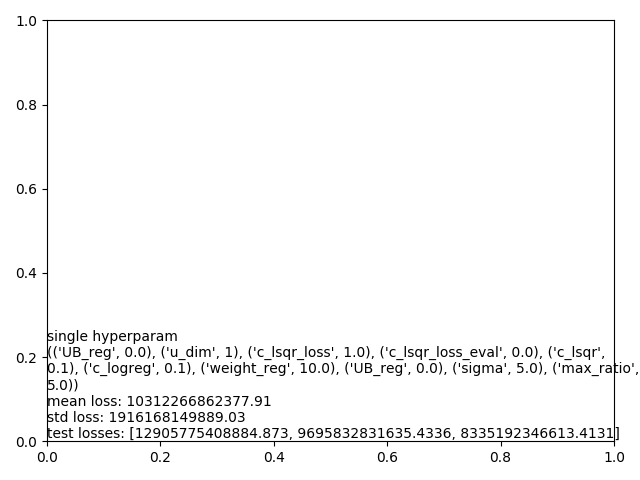

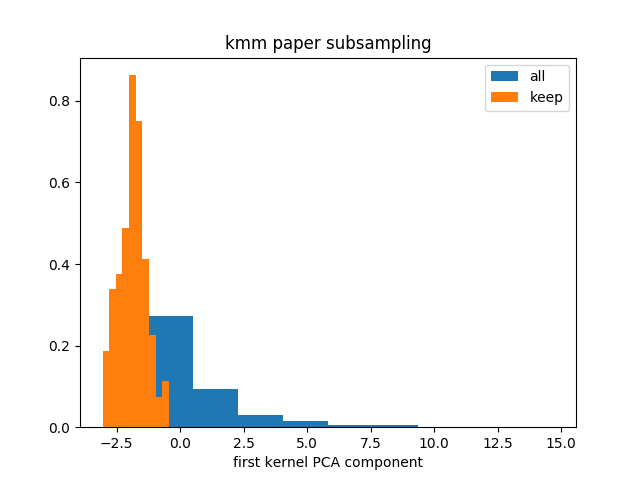

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


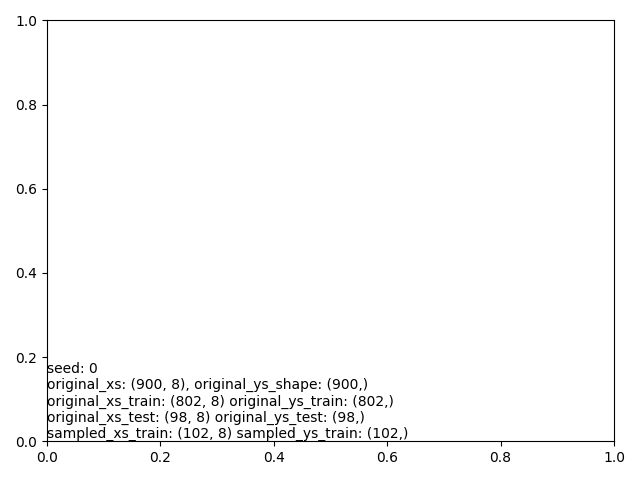

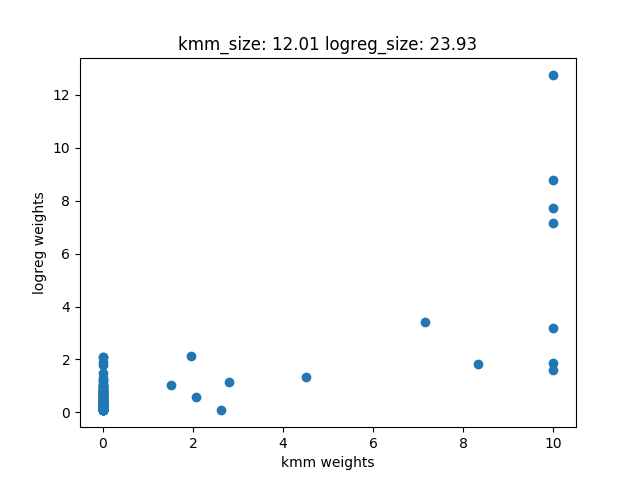

 iter		   cost val	    grad. norm
    1	+4.3336759386491221e+12	5.57107775e+12
    2	+4.2890336452339258e+12	8.22611919e+12
    3	+4.1056410184430073e+12	8.45731658e+12
    4	+3.5673623604925342e+12	4.82081159e+12
    5	+3.4642497602409243e+12	8.68319478e+12
    6	+3.3652964768815127e+12	1.98014738e+12
    7	+3.3513487400549604e+12	4.40165075e+12
    8	+3.3010481989426748e+12	3.51898029e+12
    9	+3.2498466225010239e+12	2.67430428e+12
   10	+3.2417692082820767e+12	3.46952374e+12
   11	+3.2095358746974448e+12	3.36570169e+12
   12	+3.1761060440066382e+12	5.51310167e+12
   13	+3.1365476027526143e+12	2.09130868e+12
   14	+3.1170344790849648e+12	1.66946897e+12
   15	+3.1025863537412827e+12	2.03251524e+12
   16	+3.0939578044203022e+12	2.81317334e+12
   17	+3.0719530524662524e+12	1.15919069e+12
   18	+3.0550717524031006e+12	4.34832567e+12
   19	+3.0062935478640483e+12	1.96479316e+12
   20	+2.9991250615265659e+12	2.36065819e+12
   21	+2.9813206113514795e+12	9.89968590e+11
   22	+2.926198056232

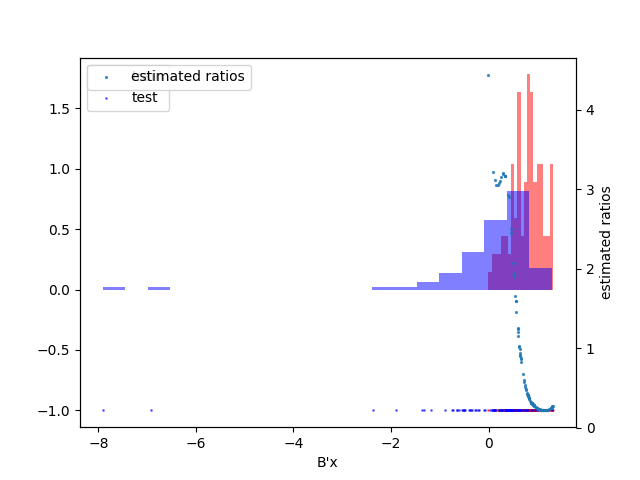

('train_loss: 932777452410.78',)
('test_loss: 13899419436888.89',)


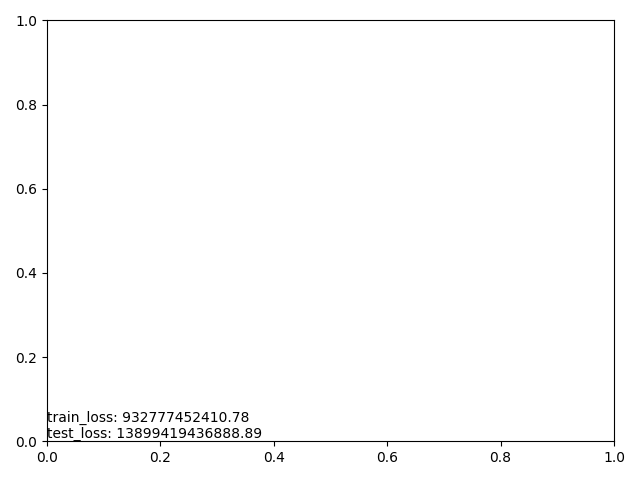

b_norm: 1.0


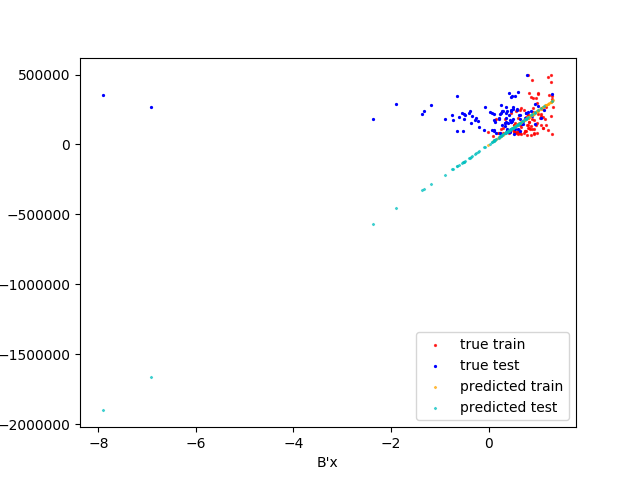

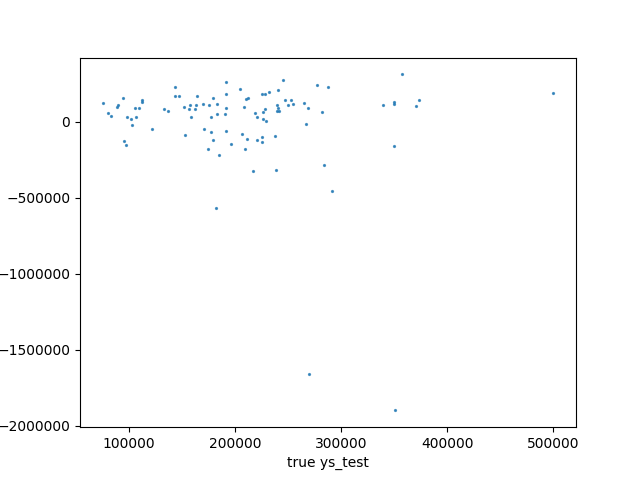

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 13899419436888.89',)


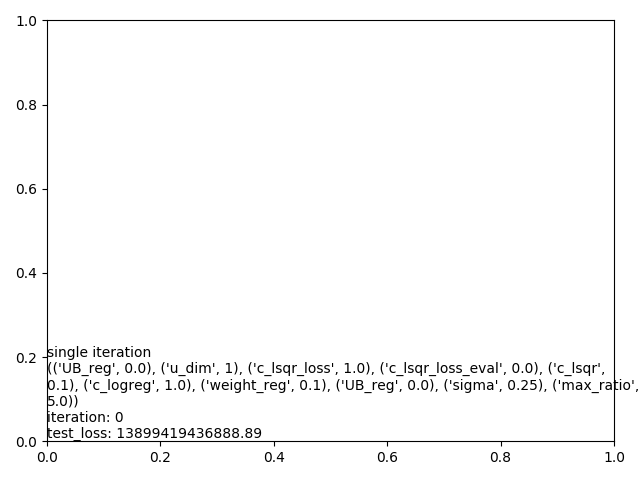

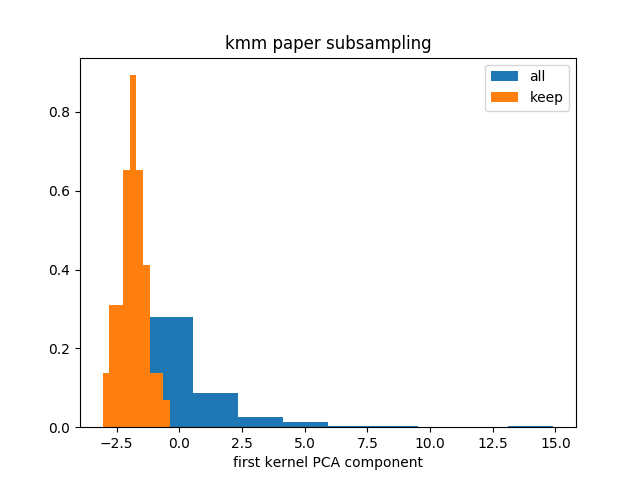

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


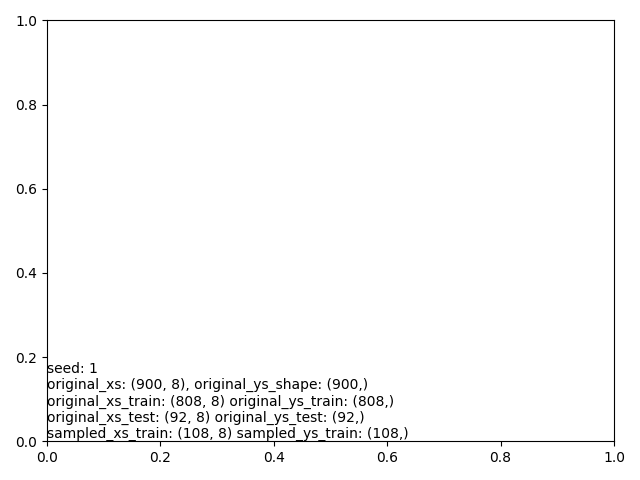

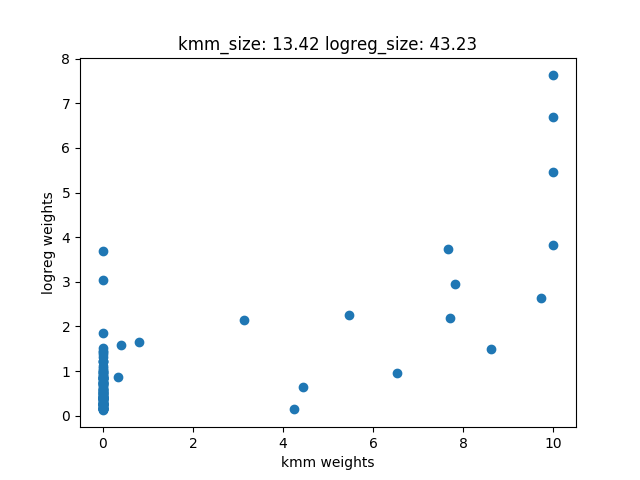

 iter		   cost val	    grad. norm
    1	+6.1576264867644697e+12	5.31972232e+12
    2	+2.1747788668234885e+12	5.58010983e+12
    3	+1.8610563309958979e+12	1.05332461e+13
    4	+1.4974674692541501e+12	1.40851321e+12
    5	+1.4824169421240413e+12	8.81752746e+11
    6	+1.4769734316865317e+12	6.94462522e+11
    7	+1.4712849344527593e+12	6.16560154e+11
    8	+1.4657351895465405e+12	3.16207296e+11
    9	+1.4643515922034814e+12	4.53003965e+11
   10	+1.4626244836546660e+12	2.48146966e+11
   11	+1.4617926865352966e+12	1.57524746e+11
   12	+1.4613530694096057e+12	2.67525505e+11
   13	+1.4604831504792729e+12	1.28131839e+11
   14	+1.4598620694849502e+12	2.90665321e+11
   15	+1.4588695354611660e+12	1.70438978e+11
   16	+1.4586937704592788e+12	3.12977972e+11
   17	+1.4580855261920281e+12	2.31096749e+11
   18	+1.4575893229808201e+12	2.83972245e+11
   19	+1.4566382656560408e+12	1.46143858e+11
   20	+1.4564040433693145e+12	6.06005752e+11
   21	+1.4555351951833438e+12	5.19204319e+11
   22	+1.453202517621

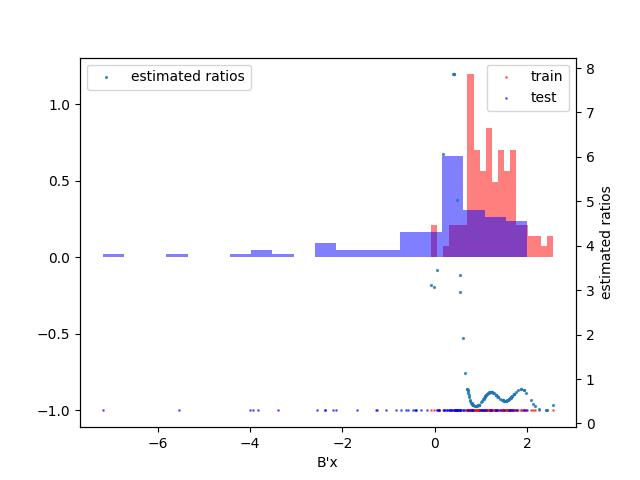

('train_loss: 1047010861433.69',)
('test_loss: 10184298550984.89',)


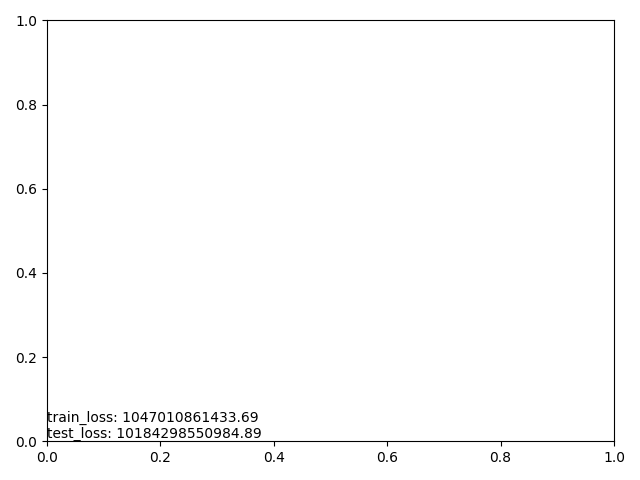

b_norm: 1.0


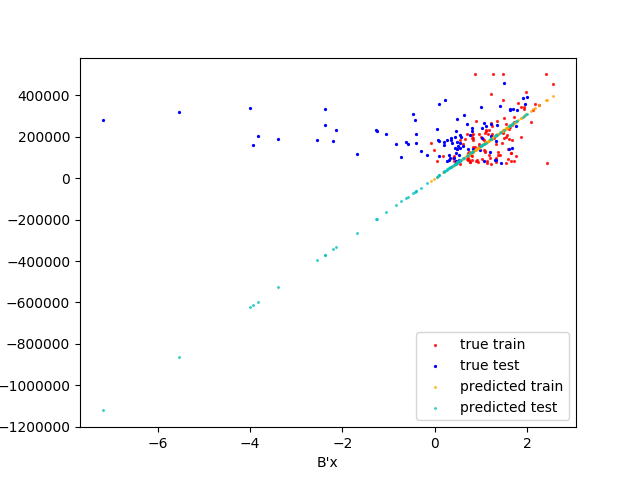

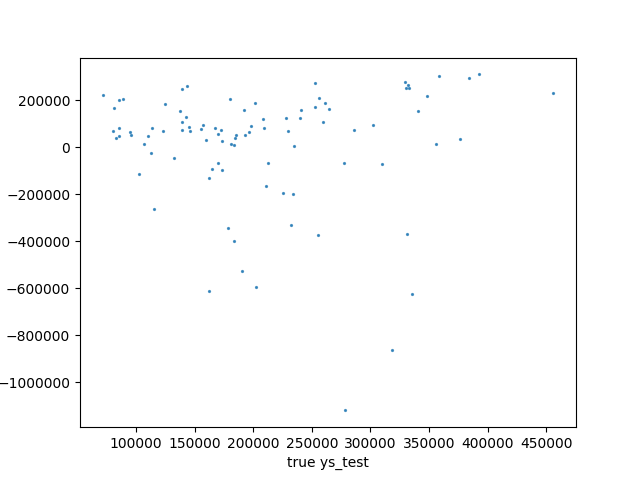

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 10184298550984.89',)


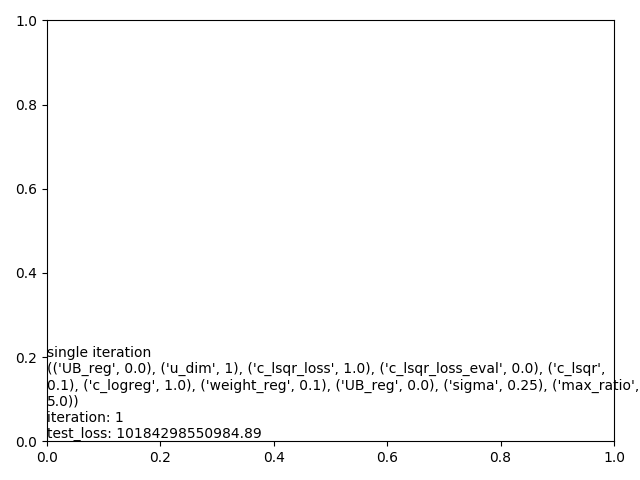

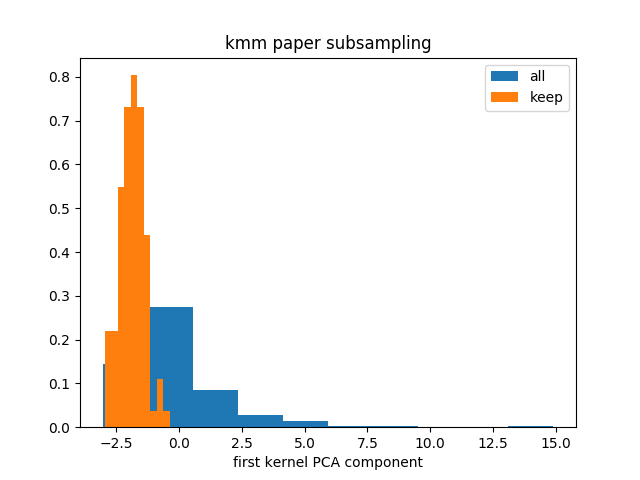

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


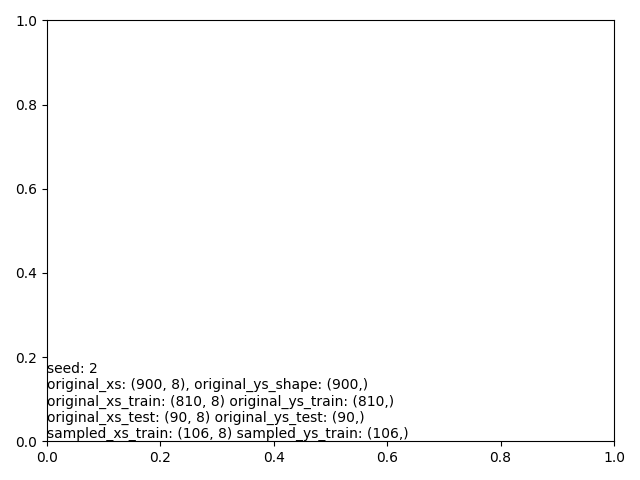

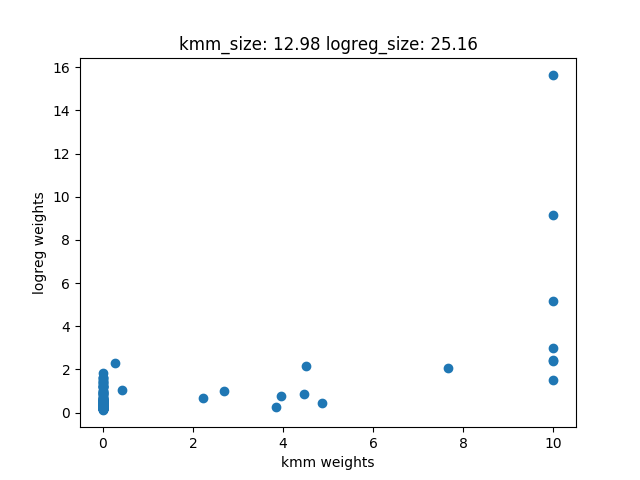

 iter		   cost val	    grad. norm
    1	+5.4056329533525127e+12	3.33176927e+12
    2	+3.3598706966332539e+12	5.78059072e+12
    3	+8.9412761919327734e+11	1.09240074e+12
    4	+7.4043917160301721e+11	1.50132850e+12
    5	+7.2484778994495300e+11	1.17881038e+12
    6	+6.7694301847283020e+11	7.59931732e+11
    7	+6.7245828859078906e+11	1.19294349e+12
    8	+6.5683273432069397e+11	8.85720518e+11
    9	+6.4341707219612939e+11	5.24205190e+11
   10	+6.3688199521913916e+11	4.61198365e+11
   11	+6.3141933264170093e+11	2.18337853e+11
   12	+6.2874355591344836e+11	2.59004304e+11
   13	+6.2631419507388049e+11	2.15908003e+11
   14	+6.2401603719204309e+11	2.43808164e+11
   15	+6.2180536197013599e+11	2.02961128e+11
   16	+6.1962756635933801e+11	2.38832519e+11
   17	+6.1754990700484192e+11	1.99648414e+11
   18	+6.1551070113004944e+11	2.32310069e+11
   19	+6.1356092170483740e+11	1.95534440e+11
   20	+6.1164642963299695e+11	2.26172537e+11
   21	+6.0981574687824158e+11	1.91678960e+11
   22	+6.080195795881

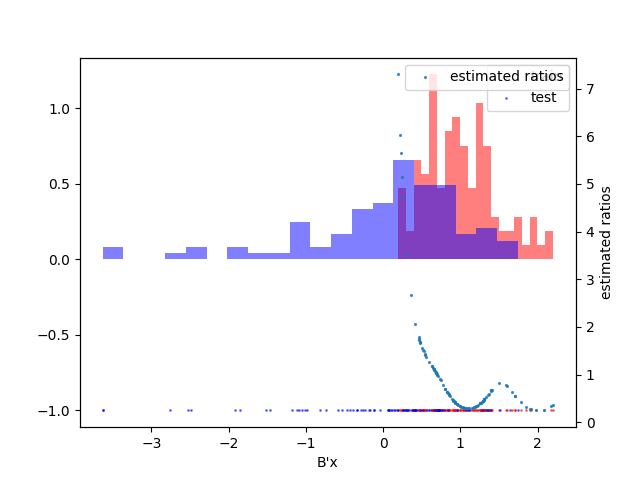

('train_loss: 807777139440.98',)
('test_loss: 7895211429162.67',)


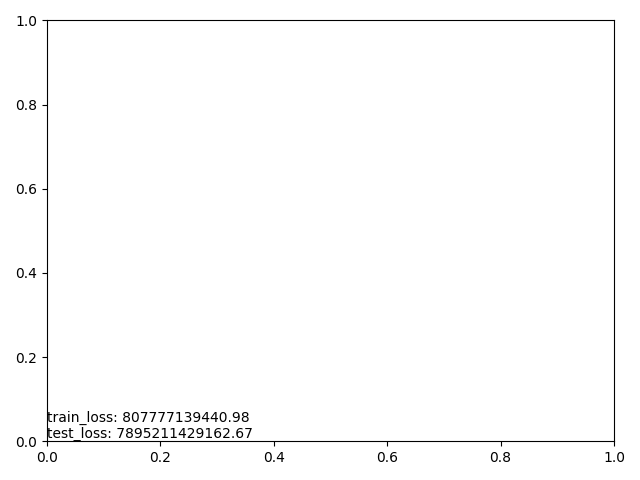

b_norm: 1.0


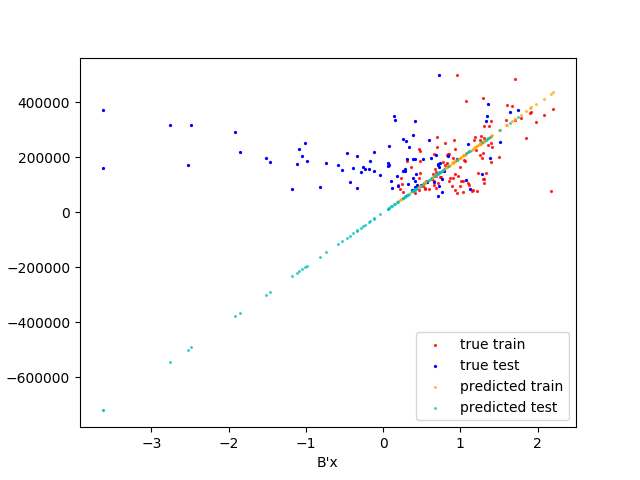

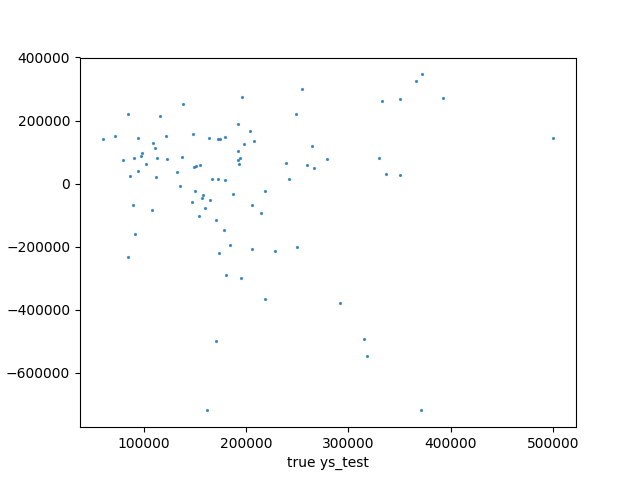

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 7895211429162.67',)


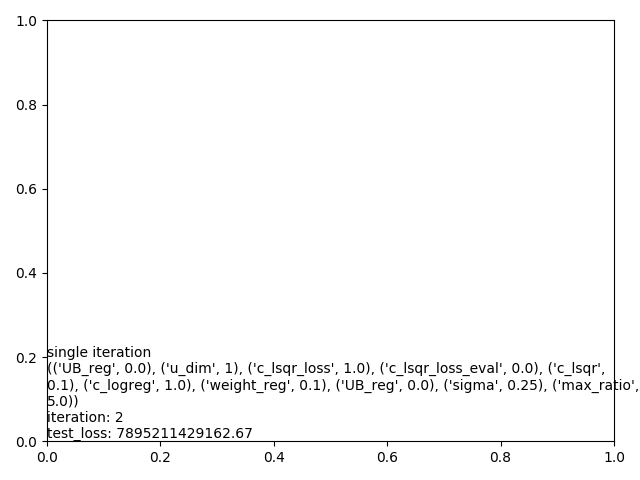

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 0.25), ('max_ratio', 5.0)),)
('mean loss: 10659643139012.15',)
('std loss: 2474145348470.33',)
('test losses: [13899419436888.895, 10184298550984.891, 7895211429162.6748]',)


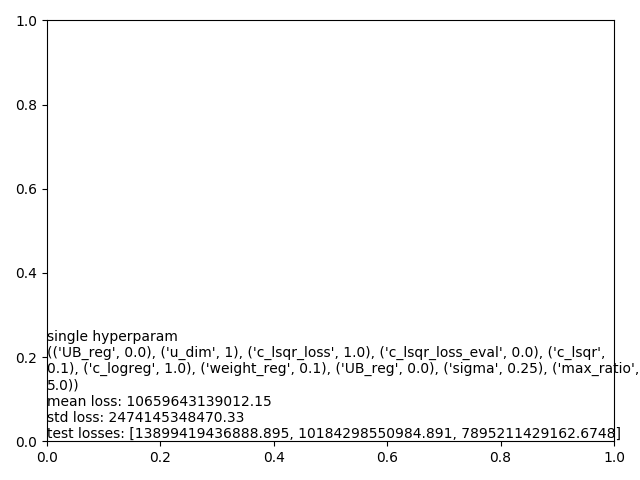

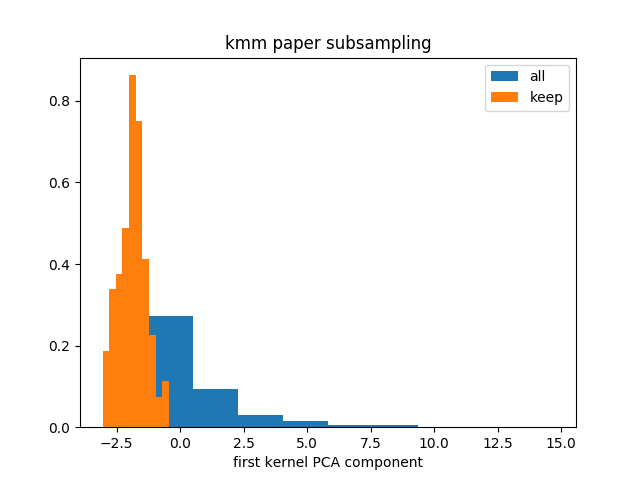

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


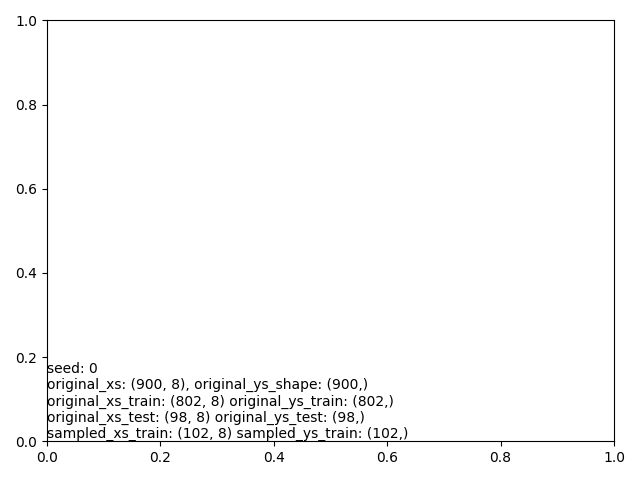

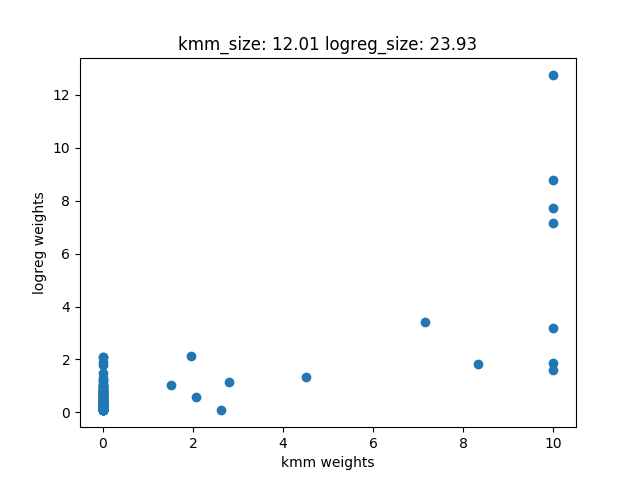

 iter		   cost val	    grad. norm
    1	+5.9660970004510225e+12	1.66658472e+13
    2	+1.2437213912035615e+12	3.03676208e+12
    3	+1.0924921860213304e+12	2.64758546e+12
    4	+8.5664001422182446e+11	6.39586730e+11
    5	+8.3507447567377991e+11	5.46570242e+11
    6	+8.2151591952638220e+11	4.64133045e+11
    7	+8.0915667973327551e+11	3.10606205e+11
    8	+8.0140704452514648e+11	4.45727017e+11
    9	+7.9210108419057263e+11	3.53345497e+11
   10	+7.8469115467272107e+11	2.66800160e+11
   11	+7.7930280379058398e+11	3.05618712e+11
   12	+7.7669024903375000e+11	4.18491962e+11
   13	+7.6912925425569714e+11	2.10463401e+11
   14	+7.6602790757952637e+11	4.07119320e+11
   15	+7.5804659789749915e+11	1.66900672e+11
   16	+7.5791514019705017e+11	8.53753152e+11
   17	+7.5739178428569043e+11	8.45966848e+11
   18	+7.5533709840243835e+11	8.14690486e+11
   19	+7.4776288511694861e+11	6.87517973e+11
   20	+7.2972552025447864e+11	1.93664566e+11
   21	+7.2913454352246045e+11	6.11004536e+11
   22	+7.268663952934

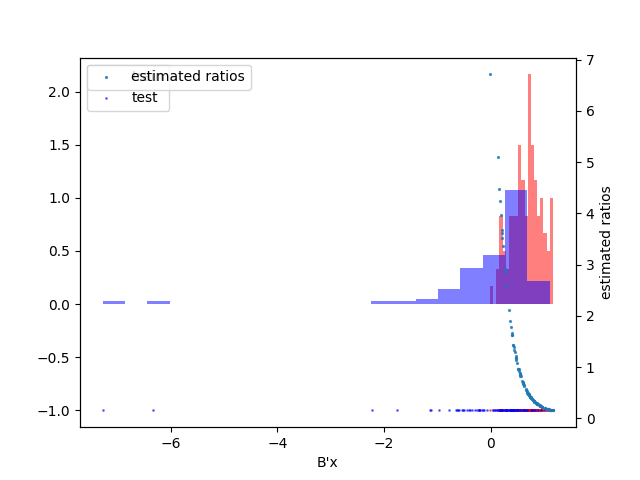

('train_loss: 949214502837.44',)
('test_loss: 15187842047232.86',)


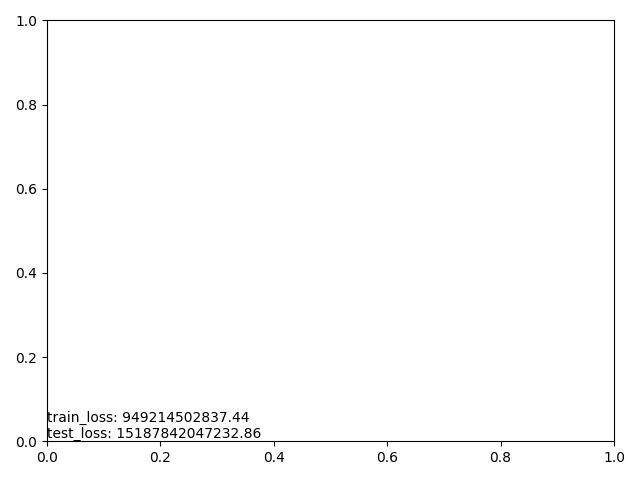

b_norm: 1.0


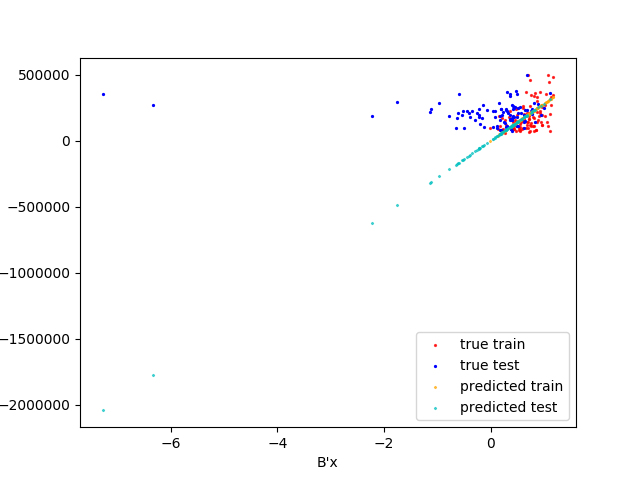

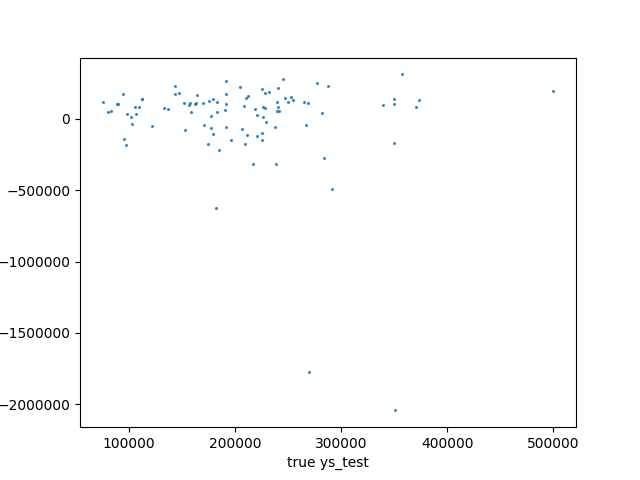

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 15187842047232.85',)


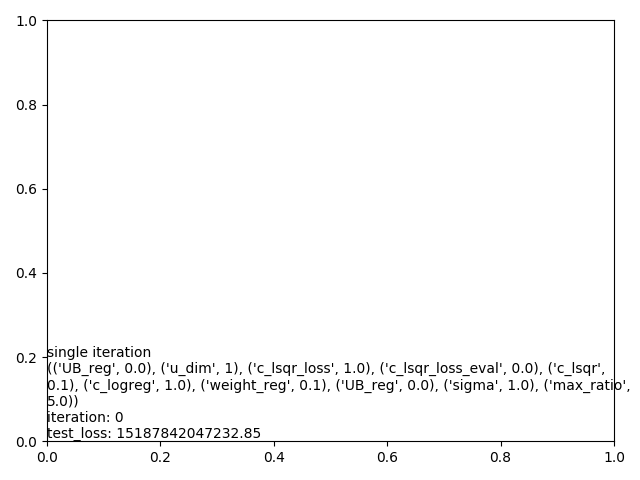

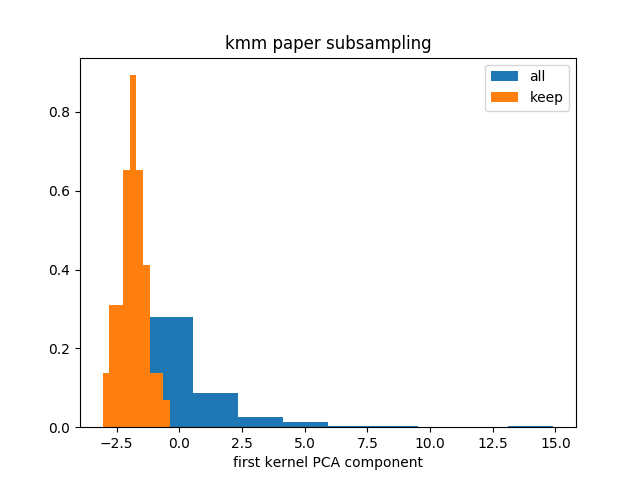

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


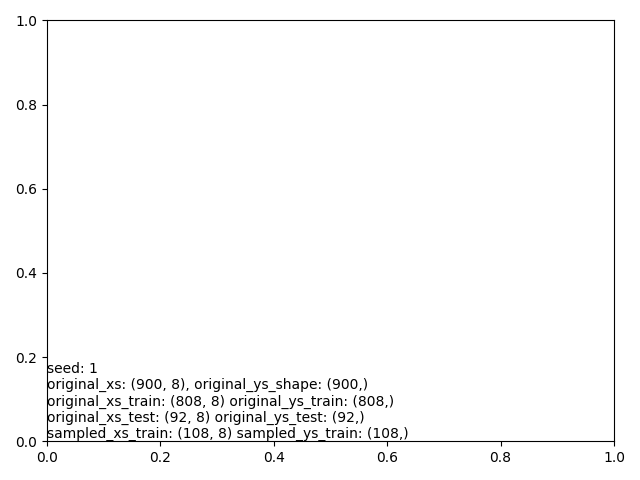

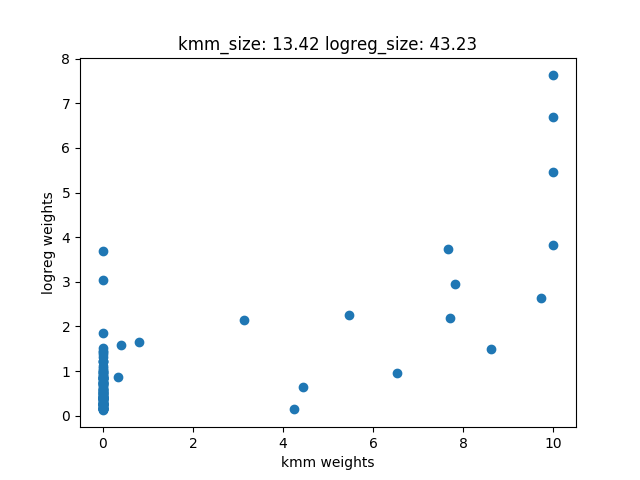

 iter		   cost val	    grad. norm
    1	+6.3664187401984727e+12	8.47130431e+12
    2	+2.4695071404597896e+12	5.74809513e+12
    3	+1.9743042283546377e+12	4.72956424e+12
    4	+1.0914971684383706e+12	1.73076097e+12
    5	+1.0325345401130225e+12	1.58512753e+12
    6	+9.4763757399543384e+11	5.71496249e+11
    7	+9.4015113992329211e+11	4.62996072e+11
    8	+9.3317071168706982e+11	4.31859449e+11
    9	+9.3168325952807678e+11	4.67676532e+11
   10	+9.2658971992350354e+11	3.37571571e+11
   11	+9.2653810187853857e+11	4.48179822e+11
   12	+9.2633280367042432e+11	4.43158138e+11
   13	+9.2553022639088892e+11	4.23151485e+11
   14	+9.2262479008289246e+11	3.45042041e+11
   15	+9.1682128665596619e+11	2.13921724e+11
   16	+9.1589691488051636e+11	2.29957681e+11
   17	+9.1288002646586792e+11	1.62048728e+11
   18	+9.1270700099083655e+11	3.05206698e+11
   19	+9.1203386872798279e+11	2.88596386e+11
   20	+9.0965884204122168e+11	2.22978007e+11
   21	+9.0788758536987268e+11	1.90392329e+11
   22	+9.063250150850

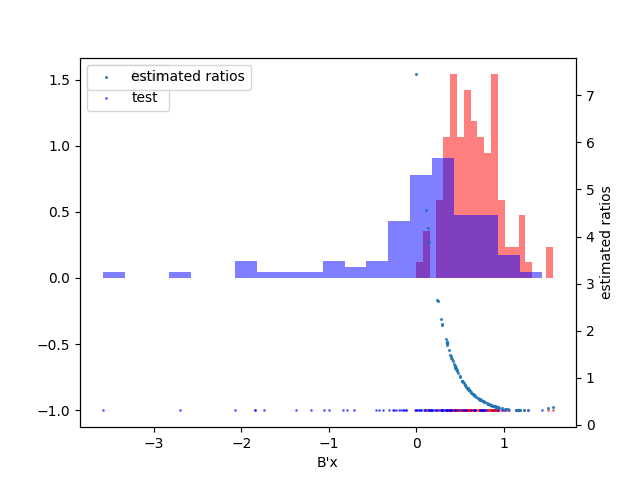

('train_loss: 1030029217476.39',)
('test_loss: 9475748054393.31',)


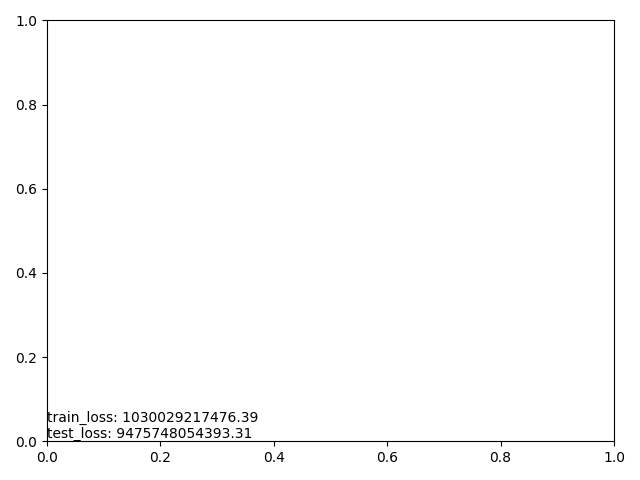

b_norm: 1.0


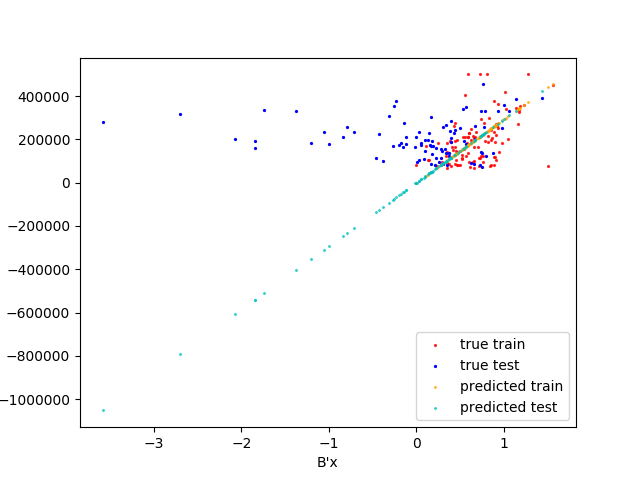

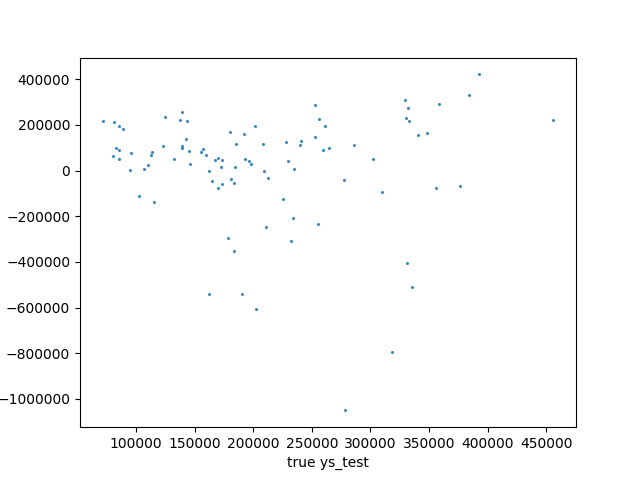

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9475748054393.31',)


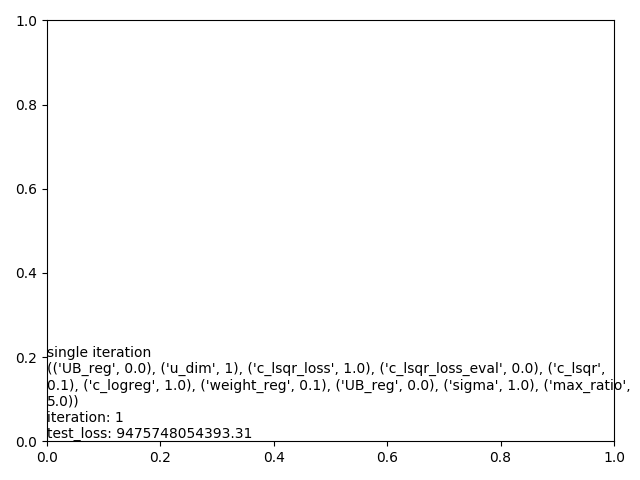

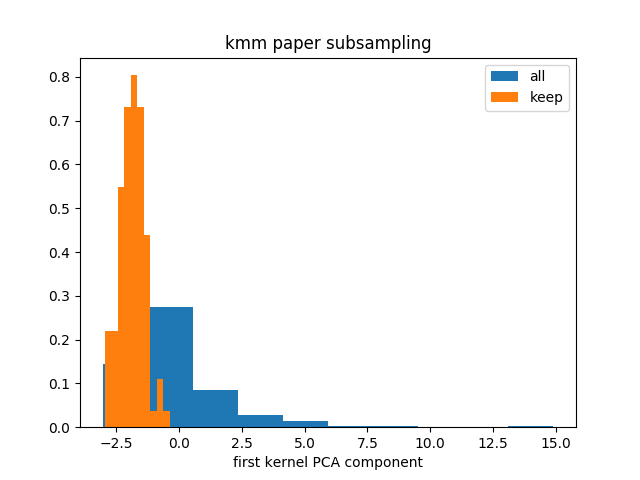

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


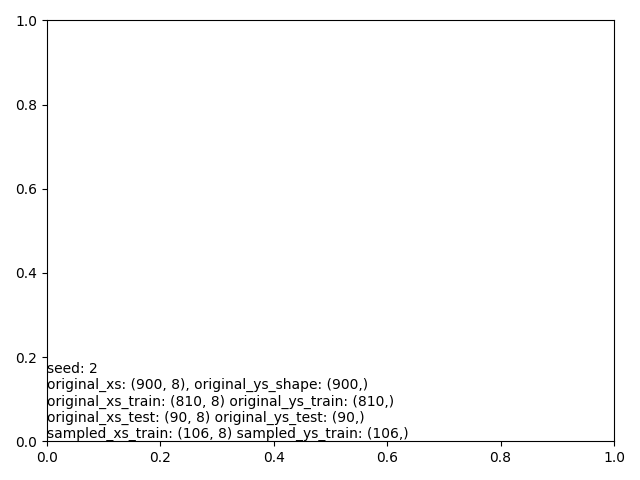

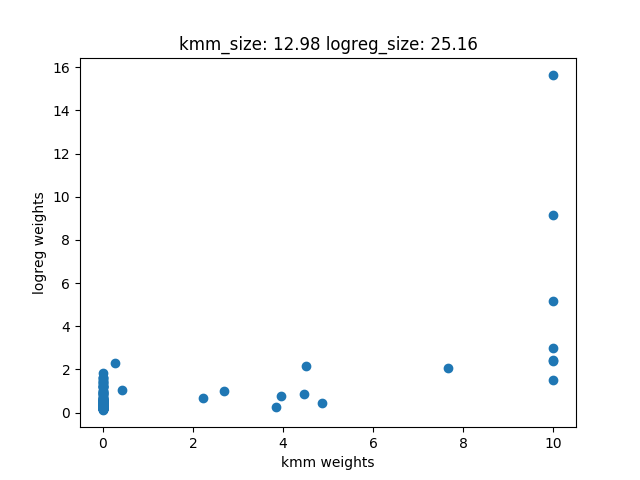

 iter		   cost val	    grad. norm
    1	+5.7512434892688369e+12	7.56075095e+11
    2	+4.9154433565698770e+12	4.69931406e+12
    3	+1.6412242964796445e+12	2.93870370e+12
    4	+1.2401525399337271e+12	3.04001385e+12
    5	+7.2630863564325818e+11	6.64690850e+11
    6	+6.8569234668356592e+11	7.88198151e+11
    7	+6.8406420906547546e+11	8.31329905e+11
    8	+6.7778906797528088e+11	7.70707880e+11
    9	+6.5743507609043274e+11	4.86054395e+11
   10	+6.4049381908983557e+11	2.34226792e+11
   11	+6.3818026553240942e+11	1.91264624e+11
   12	+6.3598095275636670e+11	1.21835958e+11
   13	+6.3411410957086743e+11	1.81026600e+11
   14	+6.3163944757957935e+11	2.28600995e+11
   15	+6.3081812957172913e+11	2.89731902e+11
   16	+6.2824376724113330e+11	1.70127778e+11
   17	+6.2702659405565771e+11	2.01345155e+11
   18	+6.2513150244909521e+11	1.34609804e+11
   19	+6.2410876648615100e+11	1.91075227e+11
   20	+6.2240081707414087e+11	1.17308493e+11
   21	+6.2157818445088562e+11	1.98714415e+11
   22	+6.198122427758

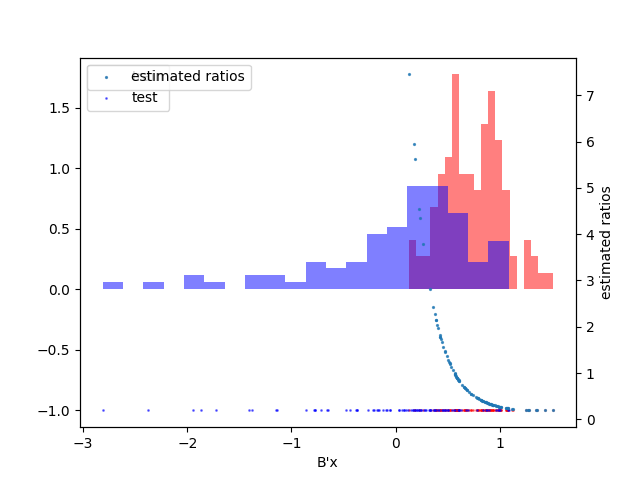

('train_loss: 853660598759.24',)
('test_loss: 7806080271870.75',)


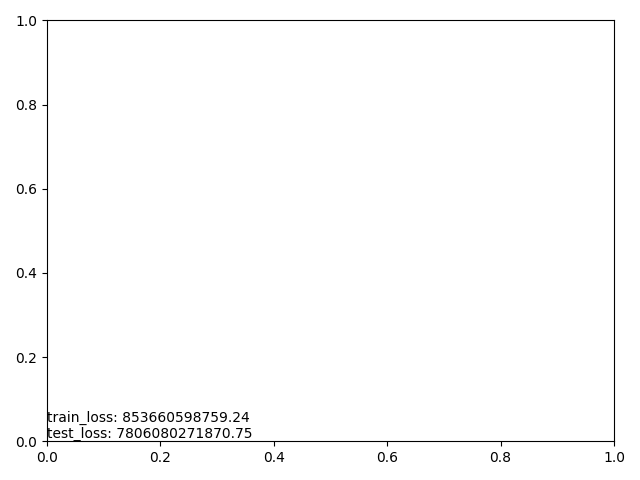

b_norm: 1.0


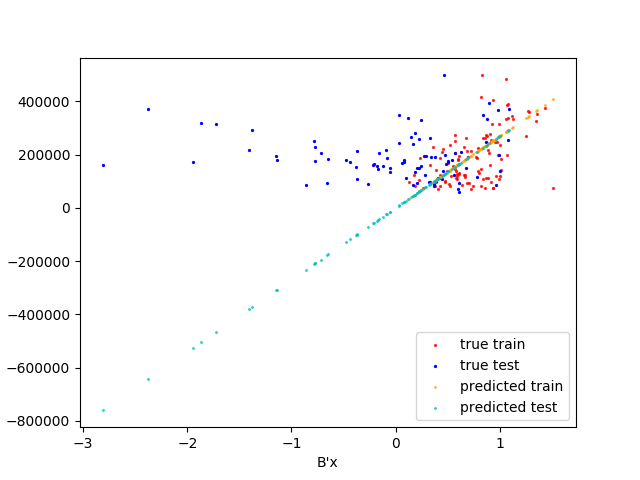

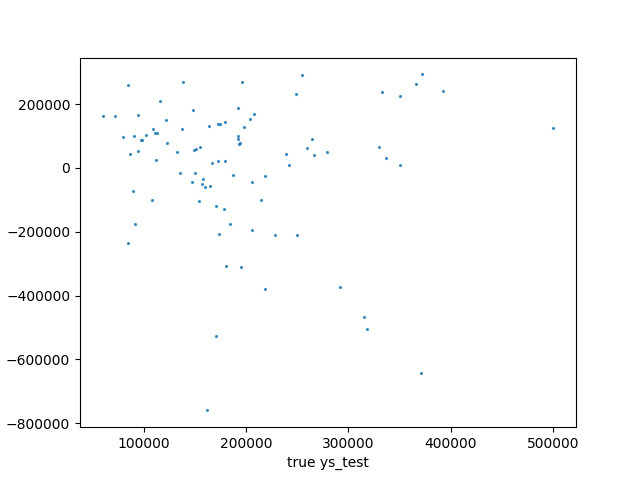

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('iteration: 2',)
('test_loss: 7806080271870.75',)


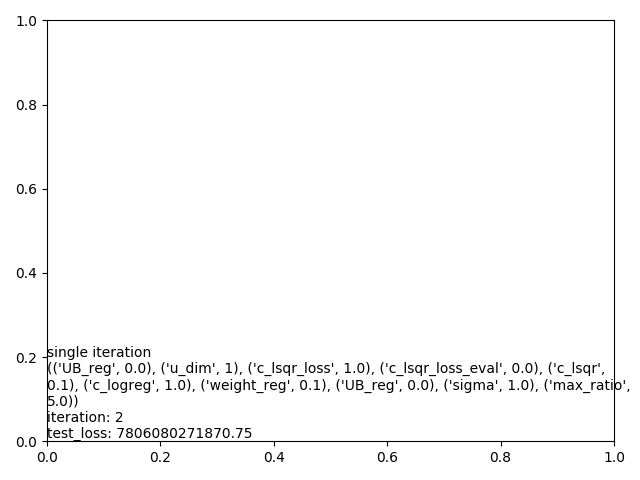

('single hyperparam',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 1.0), ('max_ratio', 5.0)),)
('mean loss: 10823223457832.30',)
('std loss: 3160629599642.46',)
('test losses: [15187842047232.854, 9475748054393.3125, 7806080271870.751]',)


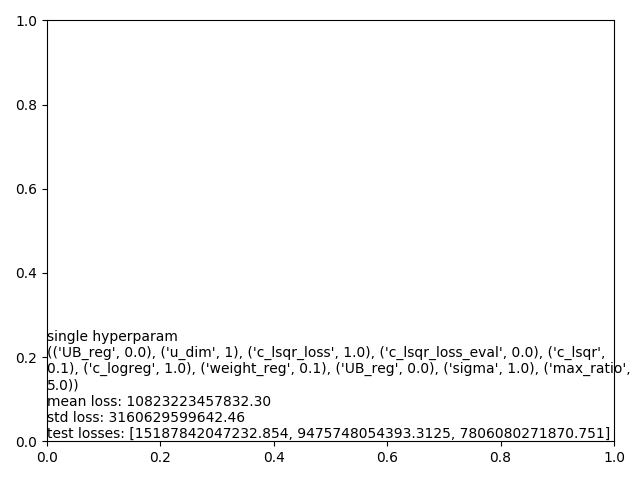

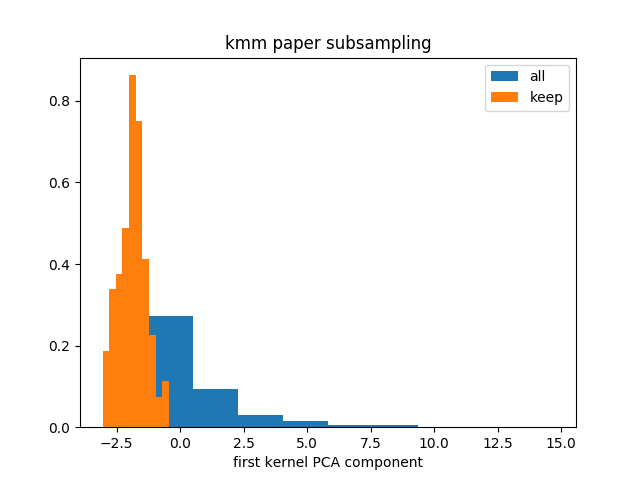

('seed: 0',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (802, 8) original_ys_train: (802,)',)
('original_xs_test: (98, 8) original_ys_test: (98,)',)
('sampled_xs_train: (102, 8) sampled_ys_train: (102,)',)


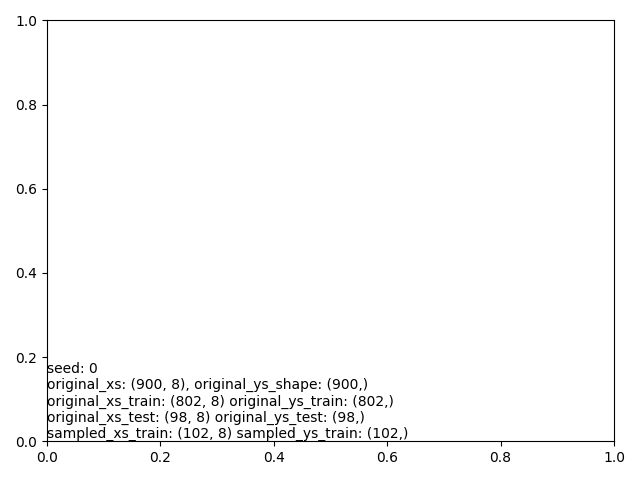

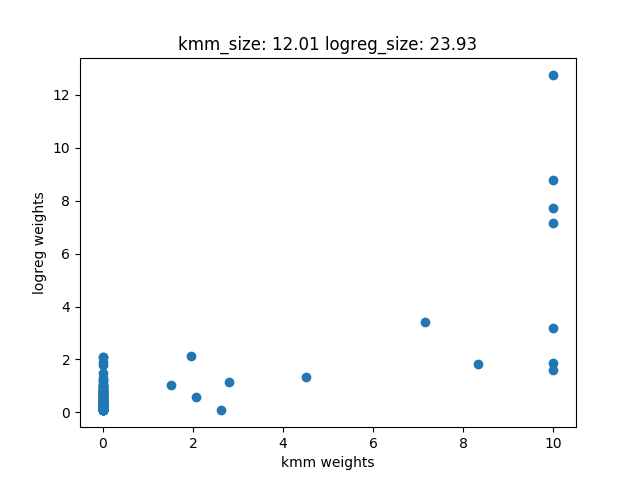

 iter		   cost val	    grad. norm
    1	+3.7429361098795107e+12	9.68229176e+12
    2	+8.4854132249315076e+11	1.31900963e+12
    3	+7.8365971606177673e+11	9.51422967e+11
    4	+7.3564353734230334e+11	3.76176963e+11
    5	+7.3132826388554224e+11	3.08753084e+11
    6	+7.2795400241624634e+11	2.90857545e+11
    7	+7.2486753210385425e+11	2.27675219e+11
    8	+7.2473444316699023e+11	3.44674593e+11
    9	+7.2421545187327429e+11	3.27442602e+11
   10	+7.2235896630400684e+11	2.59589660e+11
   11	+7.1886587092424304e+11	1.17738338e+11
   12	+7.1653059921137256e+11	2.84512477e+11
   13	+7.1274050963133325e+11	1.27329241e+11
   14	+7.1106702503122229e+11	1.63103569e+11
   15	+7.1070101158890295e+11	2.49042587e+11
   16	+7.0939039512546484e+11	1.97704591e+11
   17	+7.0714638481169360e+11	1.21038228e+11
   18	+7.0624911690768323e+11	2.12813708e+11
   19	+7.0394056777192712e+11	8.90259706e+10
   20	+7.0186175997950342e+11	3.89052540e+11
   21	+6.9650855456271997e+11	1.26872068e+11
   22	+6.957458253201

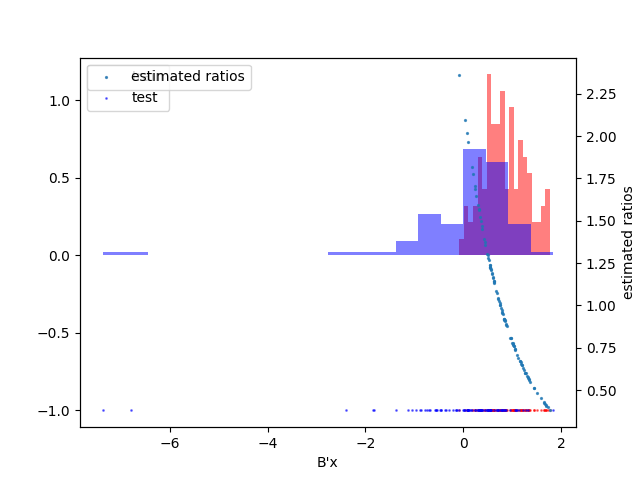

('train_loss: 730876087895.43',)
('test_loss: 11064868471109.66',)


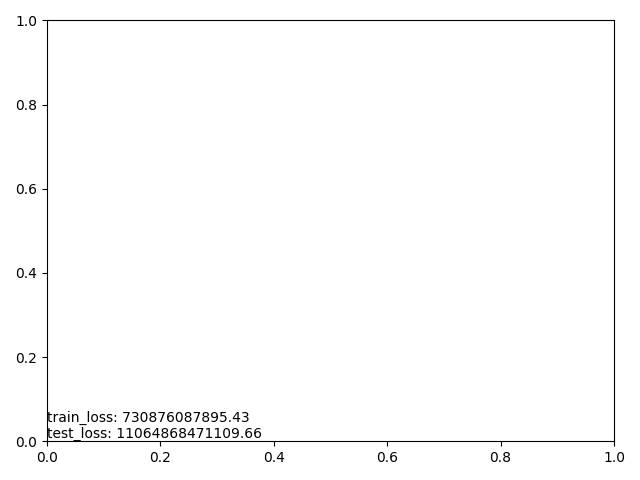

b_norm: 1.0


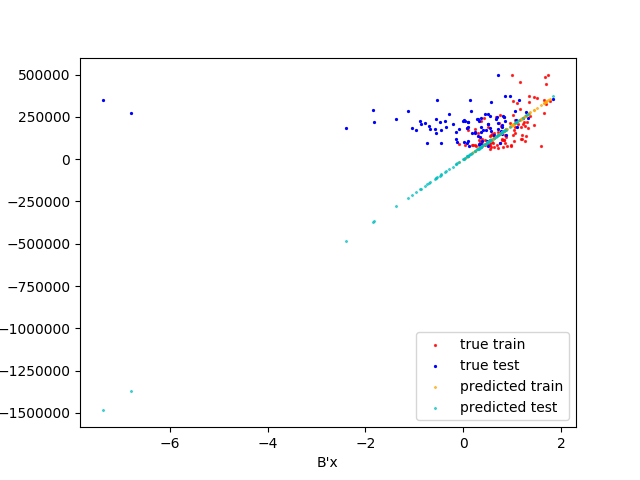

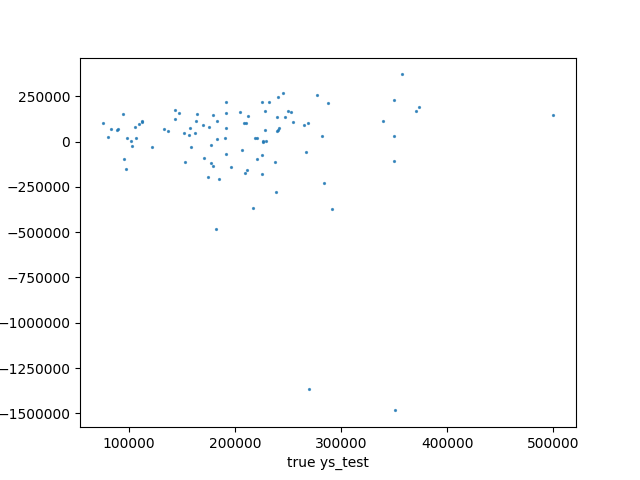

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 0',)
('test_loss: 11064868471109.66',)


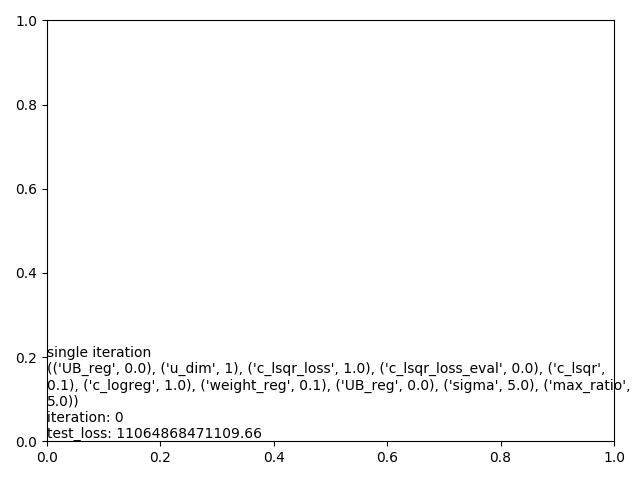

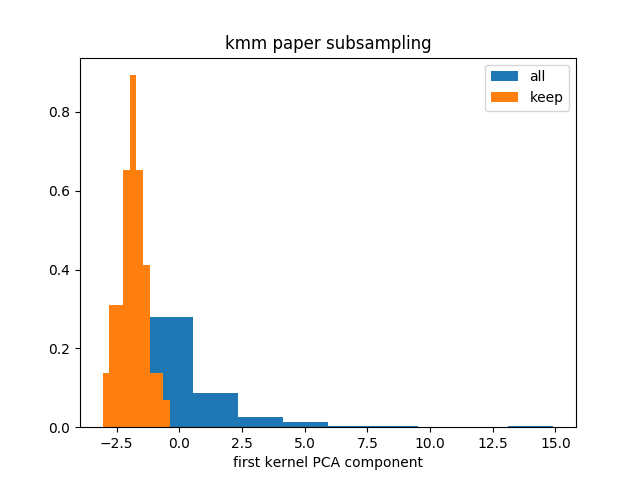

('seed: 1',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (808, 8) original_ys_train: (808,)',)
('original_xs_test: (92, 8) original_ys_test: (92,)',)
('sampled_xs_train: (108, 8) sampled_ys_train: (108,)',)


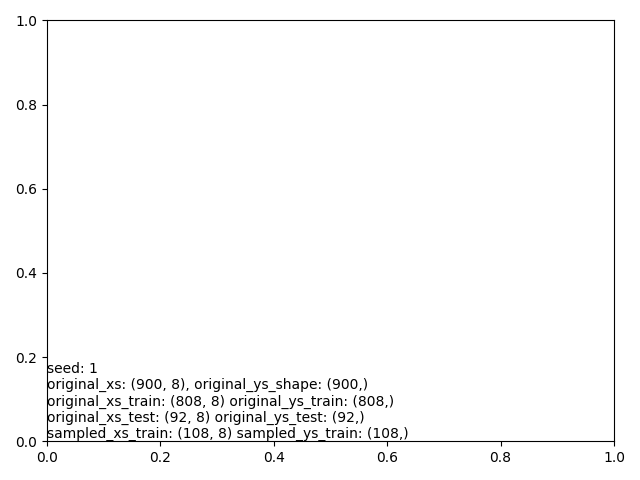

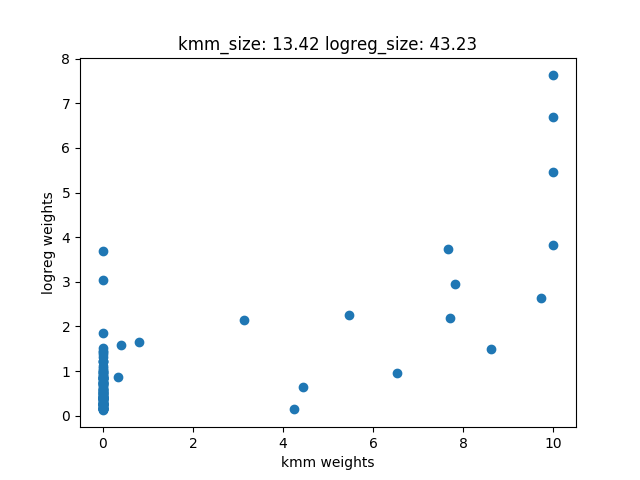

 iter		   cost val	    grad. norm
    1	+5.2714639215571758e+12	7.34849244e+12
    2	+2.2235358587835029e+12	5.25282119e+12
    3	+1.5805666317306140e+12	3.58425944e+12
    4	+1.3011277715187632e+12	2.62764671e+12
    5	+9.8533282988853711e+11	1.10252761e+12
    6	+9.1278496093230029e+11	3.76171540e+11
    7	+8.9713580546271704e+11	7.37266954e+11
    8	+8.6514549990524329e+11	2.18918453e+11
    9	+8.5118105525509265e+11	4.23985744e+11
   10	+8.4115689143567859e+11	2.26961301e+11
   11	+8.3814788915760706e+11	2.17931351e+11
   12	+8.3802531865388525e+11	3.31232599e+11
   13	+8.3754621728288367e+11	3.16259512e+11
   14	+8.3581391551208081e+11	2.56292618e+11
   15	+8.3234036919327991e+11	9.80448887e+10
   16	+8.3070255165217078e+11	2.79493429e+11
   17	+8.2741460809324243e+11	4.84715836e+10
   18	+8.2614485207263550e+11	1.06040516e+11
   19	+8.2580972900169788e+11	5.30028183e+10
   20	+8.2572673382829675e+11	3.16840274e+10
   21	+8.2572254243368872e+11	3.68249564e+10
   22	+8.257070457147

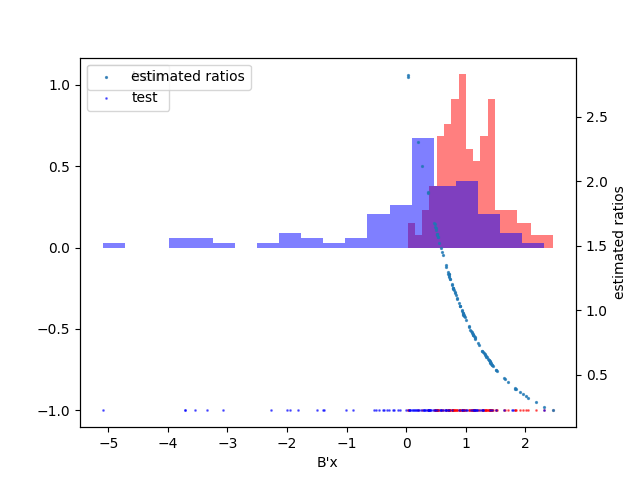

('train_loss: 959469007153.56',)
('test_loss: 9351229837077.92',)


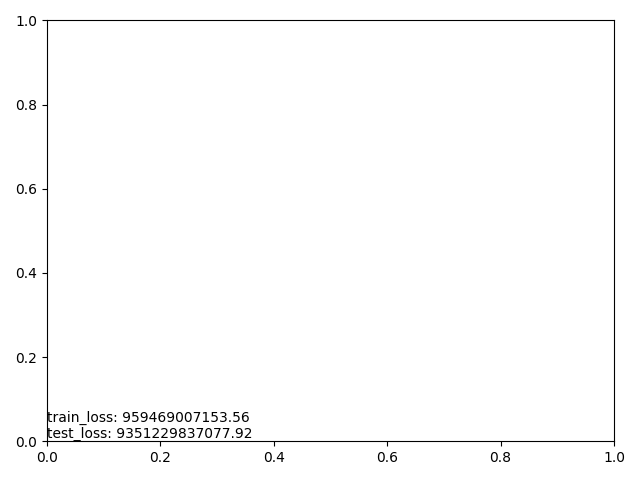

b_norm: 1.0


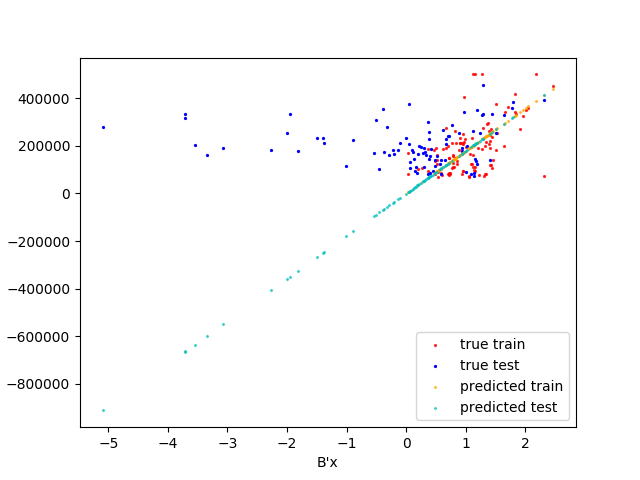

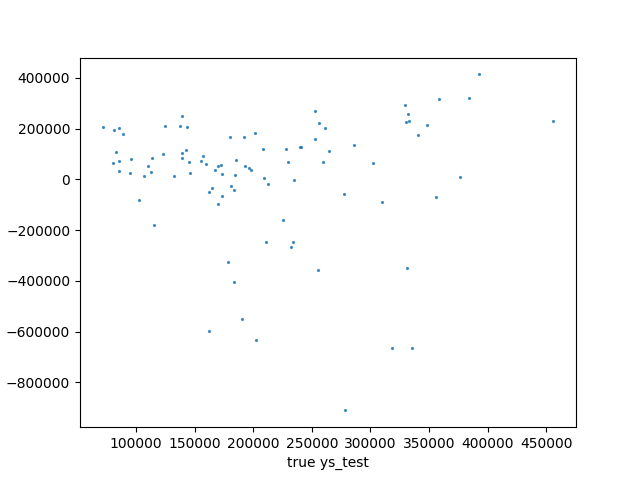

('single iteration',)
((('UB_reg', 0.0), ('u_dim', 1), ('c_lsqr_loss', 1.0), ('c_lsqr_loss_eval', 0.0), ('c_lsqr', 0.1), ('c_logreg', 1.0), ('weight_reg', 0.1), ('UB_reg', 0.0), ('sigma', 5.0), ('max_ratio', 5.0)),)
('iteration: 1',)
('test_loss: 9351229837077.92',)


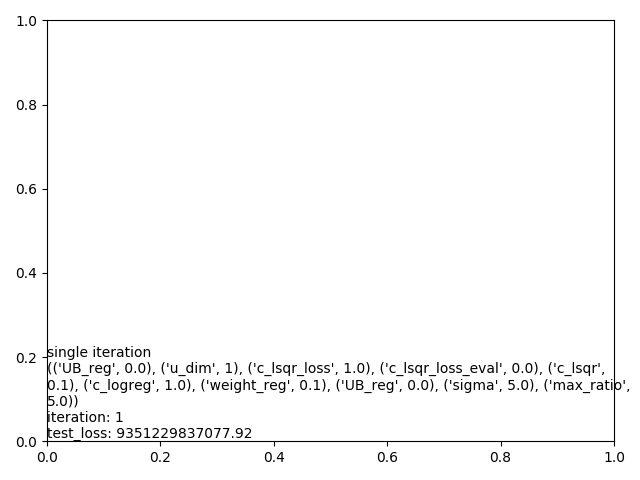

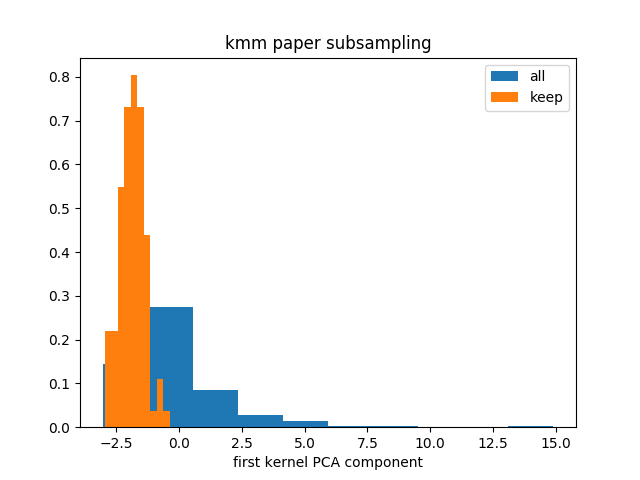

('seed: 2',)
('original_xs: (900, 8), original_ys_shape: (900,)',)
('original_xs_train: (810, 8) original_ys_train: (810,)',)
('original_xs_test: (90, 8) original_ys_test: (90,)',)
('sampled_xs_train: (106, 8) sampled_ys_train: (106,)',)


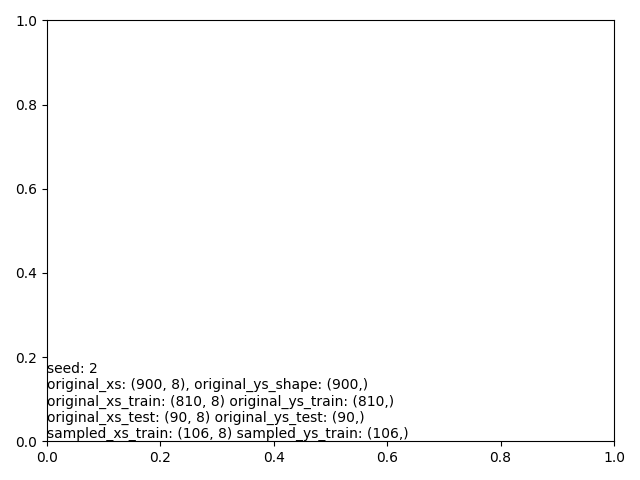

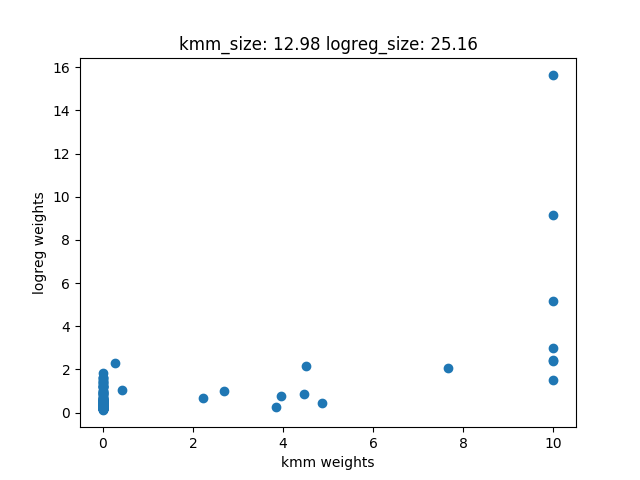

 iter		   cost val	    grad. norm
    1	+5.7388796890169141e+12	3.34359294e+12
    2	+2.7755339386350635e+12	8.06507083e+12
    3	+1.0469177327797668e+12	2.05104066e+12
    4	+1.0377993142294425e+12	3.53113537e+12
    5	+1.0023873209016949e+12	3.32681800e+12
    6	+8.7769876121401831e+11	2.55323077e+12
    7	+6.2603284439814172e+11	4.08750581e+11
    8	+6.1967541620770471e+11	4.21322450e+11
    9	+6.0235451081357373e+11	1.70123745e+11
   10	+5.9900862266198450e+11	2.95531265e+11
   11	+5.9141112519956897e+11	9.12194433e+10
   12	+5.8469041671275977e+11	1.75478421e+11
   13	+5.8182147860202844e+11	4.37145177e+10
   14	+5.8154989329609705e+11	4.40447115e+10
   15	+5.8129567873252014e+11	3.08283716e+10
   16	+5.8113437323813745e+11	4.46087765e+10
   17	+5.8096320767756519e+11	3.73059603e+10
   18	+5.8080544640875244e+11	2.11021846e+10
   19	+5.8073325661250916e+11	4.04213516e+10
   20	+5.8057314319241235e+11	1.33857575e+10
   21	+5.8020130841280139e+11	1.12353323e+10
   22	+5.801878739920

KeyboardInterrupt: 

In [11]:
# 
run.run(get_data, get_fitter, care_hyperparam_tuples, nocare_hyperparam_tuples, num_iterations, mapper)